# Exploratory Text Analytics Final Project

* Arti Patel ()
* Sudeepti Surapaneni(ss9ud@virginia.edu)
* Adonis Lu ()
* DS 5001
* 29 April 2020

# Import 

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
%matplotlib inline
from glob import glob
import re
import nltk
import plotly_express as px

# Import file into a dataframe

# Extract title of work from first line

In [2]:
# CONFIG 

OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
epub_dir = 'epubs_'



# Inspect

Since Project Gutenberg texts vary widely in their markup, we define our chunking patterns by hand.

roman = '[IVXLCM]+'
caps = "[A-Z';, -]+"
chap_pats = {
    507: {
        'start_line': 20,
        'end_line': 16261,
        'volume': re.compile('^\s*VOLUME\s+{}\s*$'.format(roman)),
        'chapter': re.compile('^Chapter\s+{}'.format(roman))
    },
    6688: {
        'start_line': 22,
        'end_line': 2556,
        'chapter': re.compile('^Chapter\s+{}\.*'.format(roman))
    },
    145: {
        'start_line': 205,
        'end_line': 33310,
        'chapter': re.compile('^CHAPTER\s+{}'.format(roman))
    }
}

In [3]:
roman = '[IVXLCM]+'
caps = "[A-Z';, -]+"
chap_pats = {
   

    2787: {
        'start_line': 21,
        'end_line': 11235,
        #'chapter': re.compile("^\s*CHAPTER\s+{}\.\s*$".format(roman))
        'chapter': re.compile("^\s*CHAPTER\s+{}\. .*$".format(roman))
    },
    
    
     2726: {
        'start_line': 21,
        'end_line': 11235,
        #'chapter': re.compile("^\s*CHAPTER\s+{}\.\s*$".format(roman))
        'chapter': re.compile("^Chapter\s+\d+.+$")
    },
    
      2786: {
        'start_line': 21,
        'end_line': 11235,
        'chapter': re.compile("^\s*Chapter\s+{}\. .*$".format(roman))
    },
    
    514: {
        'start_line': 21,
        'end_line': 11235,
        'chapter': re.compile('^CHAPTER+\s*{}\s*$'.format(caps))
    },
    
    
    3499: {
        'start_line': 21,
        'end_line': 10256,
        'chapter': re.compile("^Chapter\s+\d+.+$")
        
    },
    
    
     2788: {
        'start_line': 21,
        'end_line': 11620,
        #'chapter': re.compile('^CHAPTER+\s*{}\s*$'.format(roman))
         'chapter': re.compile("^\s*CHAPTER\s+{}\. .*$".format(roman))
    },
    
    
      2804: {
        'start_line': 21,
        'end_line': 11235,
        'chapter': re.compile("^Chapter\s+\d+.+$")
    },
    
    
     3795: {
        'start_line': 21,
        'end_line': 11235,
        'chapter': re.compile('^CHAPTER+\s*{}\s*$'.format(roman))
    }
 
}
    

# Register and Chunk

In [4]:
def acquire_epubs(epub_list, chap_pats, OHCO=OHCO):
    
    my_lib = []
    my_doc = []

    for epub_file in epub_list:
        
        # Get PG ID from filename
        book_id = int(epub_file.split('-')[-1].split('.')[0].replace('pg',''))
        print("BOOK ID", book_id)
        
        # Import file as lines
        lines = open(epub_file, 'r', encoding='utf-8-sig').readlines()
        df = pd.DataFrame(lines, columns=['line_str'])
        df.index.name = 'line_num'
        df.line_str = df.line_str.str.strip()
        df['book_id'] = book_id
        
        # FIX CHARACTERS TO IMPROVE TOKENIZATION
        df.line_str = df.line_str.str.replace('—', ' — ')
        df.line_str = df.line_str.str.replace('-', ' - ')
        
        # Get book title and put into LIB table -- note problems, though
        
        book_title = re.sub(r"The Project Gutenberg eBook( of|,) ", "", df.loc[0].line_str, flags=re.IGNORECASE)
        #book_title = re.sub(r"The Project Gutenberg eBook( of|,) ", "", df.loc[1].line_str, flags=re.IGNORECASE)
        book_title = re.sub(r"Project Gutenberg's ", "", book_title, flags=re.IGNORECASE)
        
        
        # Remove cruft
        a = chap_pats[book_id]['start_line'] - 1
        b = chap_pats[book_id]['end_line'] + 1
        df = df.iloc[a:b]
        
        # Chunk by chapter
        chap_lines = df.line_str.str.match(chap_pats[book_id]['chapter'])
        chap_nums = [i+1 for i in range(df.loc[chap_lines].shape[0])]
        df.loc[chap_lines, 'chap_num'] = chap_nums
        df.chap_num = df.chap_num.ffill()

        # Clean up
        df = df[~df.chap_num.isna()] # Remove chapter heading lines
        df = df.loc[~chap_lines] # Remove everything before Chapter 1
        df['chap_num'] = df['chap_num'].astype('int')
        
        # Group -- Note that we exclude the book level in the OHCO at this point
        df = df.groupby(OHCO[1:2]).line_str.apply(lambda x: '\n'.join(x)).to_frame() # Make big string
        
        # Split into paragrpahs
        df = df['line_str'].str.split(r'\n\n+', expand=True).stack().to_frame().rename(columns={0:'para_str'})
        df.index.names = OHCO[1:3] # MAY NOT BE NECESSARY UNTIL THE END
        df['para_str'] = df['para_str'].str.replace(r'\n', ' ').str.strip()
        df = df[~df['para_str'].str.match(r'^\s*$')] # Remove empty paragraphs
        
        # Set index
        df['book_id'] = book_id
        df = df.reset_index().set_index(OHCO[:3])

        # Register
        my_lib.append((book_id, book_title, epub_file))
        my_doc.append(df)

    docs = pd.concat(my_doc)
    library = pd.DataFrame(my_lib, columns=['book_id', 'book_title', 'book_file']).set_index('book_id')
    print("Done.")
    return library, docs

In [5]:
epubs = [epub for epub in sorted(glob(epub_dir+'/*.txt'))]
LIB, DOC = acquire_epubs(epubs, chap_pats)

LIB_arti = pd.read_csv('LIB_arti.csv')
DOC_arti = pd.read_csv('DOC_arti.csv')

DOC_arti = DOC_arti.rename(columns = {'story_num':'chap_num'})
DOC_arti = DOC_arti.set_index(['book_id','chap_num','para_num'])

LIB['book_id'] = LIB.index

LIB = LIB.append(LIB_arti)
DOC = DOC.append(DOC_arti)

LIB.index = LIB['book_id']

BOOK ID 2787
BOOK ID 2726
BOOK ID 2786
BOOK ID 3499
BOOK ID 2788
BOOK ID 514
BOOK ID 2804
BOOK ID 3795
Done.


In [6]:
LIB

,book_title,book_file,book_id
book_id,,,
2787,"An Old - fashioned Girl, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_AN_OLD-FASHIONED_GIRL...,2787
2726,"Eight Cousins, by Louisa M. Alcott",epubs_\ALCOTT_MAY_LOUISA_EIGHT_COUSINS-pg2726.txt,2726
2786,"Jack and Jill, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JACK_AND_JILL-pg2786.txt,2786
3499,"Jo's Boys, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JO’S_BOYS-pg3499.txt,3499
2788,"Little Men, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_MEN-pg2788.txt,2788
514,"Little Women, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_WOMEN-pg514.txt,514
2804,"Rose in Bloom, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_ROSE_IN_BLOOM-pg2804.txt,2804
3795,"Under the Lilacs, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_UNDER_THE_LILACS-pg37...,3795
1,The Works of Edgar Allan Poe Volume 1 (of 5) o...,epubs/2147-0.txt,1


In [7]:
DOC.sample(10)

para_str
book_id chap_num para_num                                                   
514     9        89        "Please forgive my rudeness, and come and danc...
        14       112                                   "The Rival Painters."
        23       42        "Bless me, what's all this?" cried the old lad...
3499    40       27        'Don't think of it, dear. Tell about the happy...
2788    29       22        “Now, Daisy!” called the high priest of Kitty ...
2786    10       61        “Who is it?” asked Jill, languidly, opening he...
2726    8        1         “I think I could, and I won't charge any inter...
2804    23       82        “Dear me, how you two have grown! You big thin...
2786    20       3         “Can't; we are off to Pebbly Beach the second ...
514     16       1         In the cold gray dawn the sisters lit their la...

# Tokenize and Annotate

We use NLTK this time. Note that this process takes some time, mainly because the NLTK functions are not optimized for dataframes.

Note that we can choose between tokenizers. NLTK offers a variety of them. Here is a list.

In [8]:
def tokenize(doc_df, OHCO=OHCO, remove_pos_tuple=False, ws=False):
    
    # Paragraphs to Sentences
    df = doc_df.para_str\
        .apply(lambda x: pd.Series(nltk.sent_tokenize(x)))\
        .stack()\
        .to_frame()\
        .rename(columns={0:'sent_str'})
    
    # Sentences to Tokens
    # Local function to pick tokenizer
    def word_tokenize(x):
        if ws:
            s = pd.Series(nltk.pos_tag(nltk.WhitespaceTokenizer().tokenize(x)))
        else:
            s = pd.Series(nltk.pos_tag(nltk.word_tokenize(x))) # Discards stuff in between
        return s
            
    df = df.sent_str\
        .apply(word_tokenize)\
        .stack()\
        .to_frame()\
        .rename(columns={0:'pos_tuple'})
    
    # Grab info from tuple
    df['pos'] = df.pos_tuple.apply(lambda x: x[1])
    df['token_str'] = df.pos_tuple.apply(lambda x: x[0])
    if remove_pos_tuple:
        df = df.drop('pos_tuple', 1)
    
    # Add index
    df.index.names = OHCO
    
    return df

In [9]:
%%time
TOKEN = tokenize(DOC, ws=False)

Wall time: 1min 27s


In [10]:
TOKEN.head()

pos_tuple  pos token_str
book_id chap_num para_num sent_num token_num                           
2787    1        1        0        0             (“, IN)   IN         “
                                   1           (IT, NNP)  NNP        IT
                                   2           ('S, POS)  POS        'S
                                   3          (time, NN)   NN      time
                                   4            (to, TO)   TO        to

In [11]:
TOKEN[TOKEN.pos.str.match('^NNP')]

pos_tuple  pos  token_str
book_id chap_num para_num sent_num token_num                                  
2787    1        1        0        1                 (IT, NNP)  NNP         IT
                                   10               (Tom, NNP)  NNP        Tom
                 2        0        1               (Come, NNP)  NNP       Come
                 3        0        1                 (Oh, NNP)  NNP         Oh
                          1        23             (Polly, NNP)  NNP      Polly
...                                                        ...  ...        ...
5       10       107      0        9                  (’, NNP)  NNP          ’
                          1        4                (A.M, NNP)  NNP        A.M
                          7        10         (President, NNP)  NNP  President
                          8        21         (Ponnonner, NNP)  NNP  Ponnonner
                                   22                 (’, NNP)  NNP          ’

[54314 rows x 3 columns]

# Reduce

Extract a vocabulary from the TOKEN table

In [12]:
TOKEN['term_str'] = TOKEN['token_str'].str.lower().str.replace('[\W_]', '')

In [13]:
VOCAB = TOKEN.term_str.value_counts().to_frame()\
    .rename(columns={'index':'term_str', 'term_str':'n'})\
    .sort_index().reset_index().rename(columns={'index':'term_str'})
VOCAB.index.name = 'term_id'

In [14]:
VOCAB['num'] = VOCAB.term_str.str.match("\d+").astype('int')

In [15]:
VOCAB

,term_str,n,num
term_id,,,
0,,206017,0
1,0,1,1
2,00,1,1
3,00000258,1,1
4,0000157,1,1
...,...,...,...
29554,échapper,1,0
29555,élite,1,0
29556,émeutes,1,0


# Annotate (VOCAB)

## Add Stopwords

We use NLTK's built in stopword list for English. Note that we can add and subtract from this list, or just create our own list and keep it in our data model.

In [16]:
sw = pd.DataFrame(nltk.corpus.stopwords.words('english'), columns=['term_str'])
sw = sw.reset_index().set_index('term_str')
sw.columns = ['dummy']
sw.dummy = 1

In [17]:
sw.sample(10)

,dummy
term_str,
between,1
didn't,1
about,1
few,1
them,1
during,1
you've,1
couldn't,1
who,1


In [18]:
VOCAB['stop'] = VOCAB.term_str.map(sw.dummy)
VOCAB['stop'] = VOCAB['stop'].fillna(0).astype('int')

In [19]:
VOCAB[VOCAB.stop == 1].sample(10)

,term_str,n,num,stop
term_id,,,,
13335,in,16973,0,1
17551,not,5774,0,1
18119,ours,41,0,1
12536,him,4593,0,1
1738,at,6738,0,1
29483,yourself,175,0,1
28976,whom,264,0,1
12198,having,618,0,1
26185,there,2611,0,1


## Add Stems

In [20]:
from nltk.stem.porter import PorterStemmer
stemmer1 = PorterStemmer()
VOCAB['stem_porter'] = VOCAB.term_str.apply(stemmer1.stem)

#from nltk.stem.snowball import SnowballStemmer
#stemmer2 = SnowballStemmer("english")
#VOCAB['stem_snowball'] = VOCAB.term_str.apply(stemmer2.stem)

#from nltk.stem.lancaster import LancasterStemmer
#stemmer3 = LancasterStemmer()
#VOCAB['stem_lancaster'] = VOCAB.term_str.apply(stemmer3.stem)

In [21]:
VOCAB.sample(10)
VOCAB.index.name = 'term_id'

In [22]:
#VOCAB[VOCAB.stem_porter != VOCAB.stem_lancaster]

In [23]:
#VOCAB['pos_max'] = TOKEN.pos.apply(lambda x: len(x.unique()))
#VOCAB['pos_max'] = TOKEN.pos.apply(lambda x: str.count())
#VOCAB['pos_max']  = TOKEN.pos.value_counts()
#VOCAB['pos_max']  = TOKEN.groupby('pos').size()
#VOCAB['pos_max']  = TOKEN.groupby('pos').mode()

MFCB = TOKEN.groupby(['term_str','pos']).pos.count().unstack().idxmax(1).to_frame()
VOCAB = pd.merge(VOCAB,MFCB, left_on='term_str', right_on = 'term_str')
VOCAB = VOCAB.rename(columns = {0:'pos_max'})

# Save

In [24]:
VOCAB.sample(5)
VOCAB.index.name = 'term_id'

In [25]:
DOC.to_csv('DOC.csv')
LIB.to_csv('LIBRARY.csv')
VOCAB.to_csv('VOCAB.csv')
TOKEN.to_csv('TOKEN.csv')

# TFIDF

In [26]:
count_method = 'n' # 'c' or 'n' # n = n tokens, c = distinct token (term) count
tf_method = 'sum' # sum, max, log, double_norm, raw, binary
tf_norm_k = .5 # only used for double_norm
idf_method = 'standard' # standard, max, smooth
gradient_cmap = 'YlGnBu' # YlGn, GnBu, YlGnBu; For tables; see https://matplotlib.org/3.1.0/tutorials/colors/colormaps.html 

In [27]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
SENTS = OHCO[:4]
PARAS = OHCO[:3]
CHAPS = OHCO[:2]
BOOKS = OHCO[:1]

In [28]:
bag = CHAPS

In [29]:
pd.__version__

'1.0.0'

In [30]:
sns.set()
%matplotlib inline

# Prepare the data

## Import tables

Bring the the tables we created last time.

In [31]:
%%time
LIB = pd.read_csv("LIBRARY.csv").set_index(BOOKS)
TOKEN = pd.read_csv('TOKEN.csv').set_index(OHCO)
VOCAB = pd.read_csv('VOCAB.csv').set_index('term_id')
# DOC = pd.read_csv(data_dir + "DOC.csv").set_index(PARAS)

Wall time: 1.15 s


In [32]:
LIB = LIB[['book_title', 'book_file']]
LIB

,book_title,book_file
book_id,,
2787,"An Old - fashioned Girl, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_AN_OLD-FASHIONED_GIRL...
2726,"Eight Cousins, by Louisa M. Alcott",epubs_\ALCOTT_MAY_LOUISA_EIGHT_COUSINS-pg2726.txt
2786,"Jack and Jill, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JACK_AND_JILL-pg2786.txt
3499,"Jo's Boys, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JO’S_BOYS-pg3499.txt
2788,"Little Men, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_MEN-pg2788.txt
514,"Little Women, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_WOMEN-pg514.txt
2804,"Rose in Bloom, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_ROSE_IN_BLOOM-pg2804.txt
3795,"Under the Lilacs, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_UNDER_THE_LILACS-pg37...
1,The Works of Edgar Allan Poe Volume 1 (of 5) o...,epubs/2147-0.txt


In [33]:
VOCAB.head()

,term_str,n,num,stop,stem_porter,pos_max
term_id,,,,,,
0,NaN,206017,0,0,NaN,","
1,0,1,1,0,0,CD
2,00,1,1,0,00,CD
3,00000258,1,1,0,00000258,CD
4,0000157,1,1,0,0000157,CD


In [34]:
VOCAB = VOCAB[~VOCAB.term_str.isna()]

In [35]:
VOCAB.sample(5)

,term_str,n,num,stop,stem_porter,pos_max
term_id,,,,,,
18356,pail,28,0,0,pail,NN
523,adept,4,0,0,adept,NN
8081,dredging,1,0,0,dredg,VBG
25802,taking,239,0,0,take,VBG
26277,thought,1043,0,0,thought,VBD


In [36]:
TOKEN.head()

pos_tuple  pos token_str  \
book_id chap_num para_num sent_num token_num                                  
2787    1        1        0        0             ('“', 'IN')   IN         “   
                                   1           ('IT', 'NNP')  NNP        IT   
                                   2           ("'S", 'POS')  POS        'S   
                                   3          ('time', 'NN')   NN      time   
                                   4            ('to', 'TO')   TO        to   

                                             term_str  
book_id chap_num para_num sent_num token_num           
2787    1        1        0        0              NaN  
                                   1               it  
                                   2                s  
                                   3             time  
                                   4               to

In [37]:
TOKEN = TOKEN[~TOKEN.term_str.isna()]

In [38]:
TOKEN.head()

pos_tuple  pos token_str  \
book_id chap_num para_num sent_num token_num                                  
2787    1        1        0        1           ('IT', 'NNP')  NNP        IT   
                                   2           ("'S", 'POS')  POS        'S   
                                   3          ('time', 'NN')   NN      time   
                                   4            ('to', 'TO')   TO        to   
                                   5            ('go', 'VB')   VB        go   

                                             term_str  
book_id chap_num para_num sent_num token_num           
2787    1        1        0        1               it  
                                   2                s  
                                   3             time  
                                   4               to  
                                   5               go

In [39]:
# DOC.head()

## Add term_id to TOKEN table

We need to do this to combine the VOCAB and TOKEN tables more efficiently. Note, we could have done this in the previous lab.

We use `.map()` because TOKEN and VOCAB do not share an index at this time.

In [40]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)

In [41]:
TOKEN.head()

pos_tuple  pos token_str  \
book_id chap_num para_num sent_num token_num                                  
2787    1        1        0        1           ('IT', 'NNP')  NNP        IT   
                                   2           ("'S", 'POS')  POS        'S   
                                   3          ('time', 'NN')   NN      time   
                                   4            ('to', 'TO')   TO        to   
                                   5            ('go', 'VB')   VB        go   

                                             term_str  term_id  
book_id chap_num para_num sent_num token_num                    
2787    1        1        0        1               it    14145  
                                   2                s    22463  
                                   3             time    26439  
                                   4               to    26510  
                                   5               go    11429

## Add Max POS to VOCAB

Just in case it's not there. It's easy now that we have a share feature -- `term_id` -- between VOCAB and TOKEN.

Regarding collisions when using `.idxmax()`, the documentation says "If multiple values equal the maximum, the first row label with that value is returned."

In [42]:
# Demo
# TOKEN.groupby(['term_id', 'pos']).pos.count()
# TOKEN.groupby(['term_id', 'pos']).pos.count().unstack()
# TOKEN.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

In [43]:
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)

In [44]:
VOCAB.sample(5)

,term_str,n,num,stop,stem_porter,pos_max
term_id,,,,,,
25412,sunbeams,2,0,0,sunbeam,JJ
13384,incitamentum,1,0,0,incitamentum,NN
20962,rakes,2,0,0,rake,NNS
7153,detect,14,0,0,detect,VB
10633,fountainhead,1,0,0,fountainhead,NN


## Compare POS Stats in TOKEN and VOCAB

Pause and look at distribution of POS tags. The POS table could become part of your data model (analytical edition) if you were interested in studying POS tags.

In [45]:
POS = TOKEN.pos.value_counts().to_frame().rename(columns={'pos':'n'})
POS.index.name = 'pos_id'

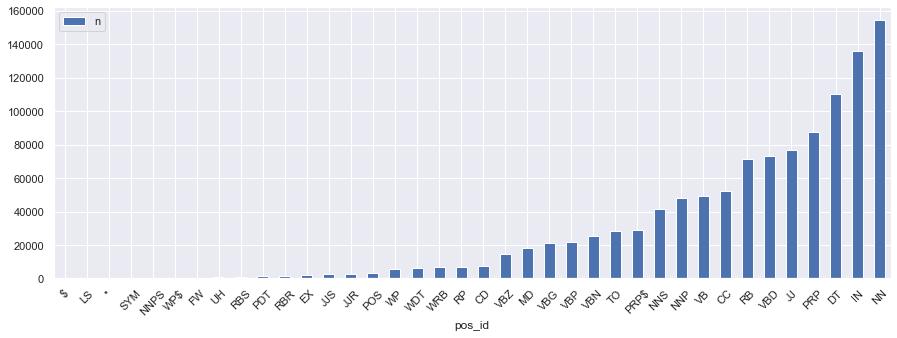

In [46]:
POS.sort_values('n').plot.bar(y='n', figsize=(15,5), rot=45);

# Zipf's Law

$f \propto \frac{1}{r} $

$k =  fr$

## Add Term Rank to VOCAB

In [47]:
if 'term_rank' not in VOCAB.columns:
    VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
    VOCAB.index.name = 'term_rank'
    VOCAB = VOCAB.reset_index()
    VOCAB = VOCAB.set_index('term_id')
    VOCAB['term_rank'] = VOCAB['term_rank'] + 1

In [48]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,pos_max
term_id,,,,,,,
26151,1,the,58042,0,1,the,DT
1110,2,and,41247,0,1,and,CC
17817,3,of,29442,0,1,of,IN
26510,4,to,28593,0,1,to,TO
219,5,a,26310,0,1,a,DT


## Alternate Rank

The `term_rank` as defined above assigns different ranks to words with the same frequency, which occurs in the long tail, e.g. with words that appear once. 
This measure groups words by term count.

In [49]:
new_rank = VOCAB.n.value_counts()\
    .sort_index(ascending=False).reset_index().reset_index()\
    .rename(columns={'level_0':'term_rank2', 'index':'n', 'n':'nn'})\
    .set_index('n')

In [50]:
new_rank.head()

,term_rank2,nn
n,,
58042,0,1
41247,1,1
29442,2,1
28593,3,1
26310,4,1


In [51]:
VOCAB['term_rank2'] = VOCAB.n.map(new_rank.term_rank2) + 1

In [52]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,pos_max,term_rank2
term_id,,,,,,,,
26151,1,the,58042,0,1,the,DT,1
1110,2,and,41247,0,1,and,CC,2
17817,3,of,29442,0,1,of,IN,3
26510,4,to,28593,0,1,to,TO,4
219,5,a,26310,0,1,a,DT,5


In [53]:
VOCAB['p'] = VOCAB.n / VOCAB.shape[0]

## Compute Zipf's K

In [54]:
VOCAB['zipf_k'] = VOCAB.n * VOCAB.term_rank
VOCAB['zipf_k2'] = VOCAB.n * VOCAB.term_rank2
VOCAB['zipf_k3'] = VOCAB.p * VOCAB.term_rank2

In [55]:
VOCAB.describe().T

,count,mean,std,min,25%,50%,75%,max
term_rank,29556.0,14778.500000,8532.226614,1.000000,7389.750000,14778.500000,22167.250000,29556.000000
n,29556.0,37.567431,598.419437,1.000000,1.000000,3.000000,9.000000,58042.000000
num,29556.0,0.007376,0.085567,0.000000,0.000000,0.000000,0.000000,1.000000
stop,29556.0,0.005075,0.071060,0.000000,0.000000,0.000000,0.000000,1.000000
term_rank2,29556.0,589.034342,55.889659,1.000000,597.000000,603.000000,605.000000,605.000000
p,29556.0,0.001271,0.020247,0.000034,0.000034,0.000102,0.000305,1.963798
zipf_k,29556.0,48129.905535,26743.165360,19026.000000,26414.750000,38806.500000,64512.000000,160560.000000
zipf_k2,29556.0,7685.649411,18765.528221,605.000000,605.000000,1809.000000,5373.000000,160560.000000
zipf_k3,29556.0,0.260037,0.634914,0.020470,0.020470,0.061206,0.181790,5.432400


### Words with low k

In [56]:
VOCAB[VOCAB.zipf_k <= VOCAB.zipf_k.quantile(.1)].sort_values('zipf_k3', ascending=True).head()

,term_rank,term_str,n,num,stop,stem_porter,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,,
26076,19026,terminate,1,0,0,termin,VB,605,0.000034,19026,605,0.02047
1426,20991,archangel,1,0,0,archangel,NNP,605,0.000034,20991,605,0.02047
28447,20992,wadding,1,0,0,wad,NN,605,0.000034,20992,605,0.02047
1428,20993,archbishop,1,0,0,archbishop,NN,605,0.000034,20993,605,0.02047
1443,20994,architects,1,0,0,architect,NNS,605,0.000034,20994,605,0.02047


### Words with high k

In [57]:
VOCAB[VOCAB.zipf_k >= VOCAB.zipf_k.quantile(.9)].sort_values('zipf_k3', ascending=False).head()

,term_rank,term_str,n,num,stop,stem_porter,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3
term_id,,,,,,,,,,,,
12226,16,he,10035,0,1,he,PRP,16,0.339525,160560,160560,5.432400
16095,39,me,4107,0,1,me,PRP,39,0.138957,160173,160173,5.419306
3719,35,by,4566,0,1,by,IN,35,0.154486,159810,159810,5.407024
17995,48,or,3322,0,1,or,CC,48,0.112397,159456,159456,5.395047
28820,47,were,3383,0,1,were,VBD,47,0.114461,159001,159001,5.379652


## Visualize

### Histogram of Zipf K

In [58]:
#px.histogram(VOCAB, 'zipf_k', marginal='box')

In [59]:
# px.histogram(VOCAB, 'zipf_k2', marginal='box')

In [60]:
# px.histogram(VOCAB, 'zipf_k3', marginal='box')

###  Rank and N

In [61]:
VSAMP1 = VOCAB[['n','term_rank','zipf_k','term_str','pos_max']]
# VSAMP2 = VOCAB[['n','term_rank2','zipf_k3']].drop_duplicates()

In [62]:
#px.scatter(VSAMP1, x='term_rank', y='n', log_y=False, log_x=False, hover_name='term_str', color='pos_max')

In [63]:
# px.scatter(VSAMP2, x='term_rank2', y='n', log_y=False, log_x=False)

In [64]:
#px.scatter(VSAMP1, x='term_rank', y='n', log_y=True, log_x=True, hover_name='term_str', color='pos_max')

In [65]:
# px.scatter(VSAMP2, x='term_rank2', y='n', log_y=True, log_x=True)

## Demo Rank Index

In [66]:
rank_index = [1, 2, 3, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000]

In [67]:
demo = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'term_rank', 'n', 'zipf_k', 'pos_max']]

In [68]:
demo.style.background_gradient(cmap=gradient_cmap, high=.5)

,term_str,term_rank,n,zipf_k,pos_max
term_id,,,,,
26151,the,1,58042,58042,DT
1110,and,2,41247,82494,CC
17817,of,3,29442,88326,IN
26145,that,10,11925,119250,IN
11934,had,20,6748,134960,VBD
7807,do,30,5242,157260,VBP
22518,said,40,3858,154320,VBD
1075,an,50,3066,153300,DT
5899,could,60,2611,156660,MD


In [69]:
# rank_index = [1, 2, 3, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800]
# demo = VOCAB.loc[VOCAB.term_rank2.isin(rank_index), ['term_str', 'term_rank2', 'n', 'zipf_k2', 'pos_max']]
# demo.style.background_gradient(cmap=gradient_cmap, high=.5)

# VOCAB Entropy

## Compute P of VOCAB

This is the prior, or marginal, probability of a term.

In [70]:
%%time
VOCAB['p2'] = VOCAB.n / VOCAB.n.sum()

Wall time: 1.99 ms


## Compute Entropy of VOCAB

In [71]:
VOCAB['h'] = VOCAB.p2 * np.log2(1/VOCAB.p2) # Self entropy of each word 
H = VOCAB.h.sum()
N_v = VOCAB.shape[0]
H_max = np.log2(N_v)
R = round(1 - (H/H_max), 2) * 100

In [72]:
print("H \t= {}\nH_max \t= {}\nR \t= {}%".format(H, H_max, int(R)))

H 	= 9.829010452294979
H_max 	= 14.851163413220117
R 	= 34%


# BOW

In [73]:
BOW = TOKEN.groupby(bag+['term_id']).term_id.count()\
    .to_frame().rename(columns={'term_id':'n'})

In [74]:
BOW['c'] = BOW.n.astype('bool').astype('int')

In [75]:
BOW.head(10)
BOW.to_csv('BOW.csv')

# Document-Term Matrix

We create a document-term count matrix. Note that we can create a matrix for any of the features in BOW. Also, see how the OHCO helps us distinguish between features and observation identity.

Note, these operations are slower than using `groupby()`.

## Create Count Matrix

In [76]:
%%time
DTCM = BOW[count_method].unstack().fillna(0).astype('int')

Wall time: 155 ms


In [77]:
DTCM.head()

term_id           1      2      3      4      5      6      7      8      \
book_id chap_num                                                           
1       1             0      0      0      0      1      0      0      0   
        2             1      0      0      0      0      0      0      0   
        3             0      0      0      0      0      0      0      0   
        4             0      0      0      0      0      0      0      0   
        5             0      0      0      0      0      0      0      0   

term_id           9      10     ...  29549  29550  29551  29552  29553  29554  \
book_id chap_num                ...                                             
1       1             0      3  ...      0      0      0      0      0      0   
        2             0      4  ...      0      0      0      0      0      0   
        3             0      2  ...      0      0      0      0      0      0   
        4             0      0  ...      0      0      0      0      0      0   
        5             0      2  ...      0      0      0      0      0      0   

term_id           29555  29556  29557  29558  
book_id chap_num                              
1       1             0      0      0      0  
        2             0      0      0      0  
        3             0      0      0      0  
        4             0      0      0      0  
        5             0      1      0      0  

[5 rows x 29556 columns]

## Compute TF

We could also compute that using `BOW.groupby()`.

In [78]:
%%time
print('TF method:', tf_method)

if tf_method == 'sum':
    TF = DTCM.T / DTCM.T.sum()

elif tf_method == 'max':
    TF = DTCM.T / DTCM.T.max()

elif tf_method == 'log':
    TF = np.log10(1 + DTCM.T)
    
elif tf_method == 'raw':
    TF = DTCM.T

elif tf_method == 'double_norm':
    TF = DTCM.T / DTCM.T.max()
    TF = tf_norm_k + (1 - tf_norm_k) * TF[TF > 0] # EXPLAIN; may defeat purpose of norming

elif tf_method == 'binary':
    TF = DTCM.T.astype('bool').astype('int')
    
TF = TF.T

TF method: sum
Wall time: 162 ms


In [79]:
TF.head()

term_id              1      2      3      4         5      6      7      \
book_id chap_num                                                          
1       1         0.000000    0.0    0.0    0.0  0.000047    0.0    0.0   
        2         0.000073    0.0    0.0    0.0  0.000000    0.0    0.0   
        3         0.000000    0.0    0.0    0.0  0.000000    0.0    0.0   
        4         0.000000    0.0    0.0    0.0  0.000000    0.0    0.0   
        5         0.000000    0.0    0.0    0.0  0.000000    0.0    0.0   

term_id           8      9         10     ...  29549  29550  29551  29552  \
book_id chap_num                          ...                               
1       1           0.0    0.0  0.000140  ...    0.0    0.0    0.0    0.0   
        2           0.0    0.0  0.000291  ...    0.0    0.0    0.0    0.0   
        3           0.0    0.0  0.000713  ...    0.0    0.0    0.0    0.0   
        4           0.0    0.0  0.000000  ...    0.0    0.0    0.0    0.0   
        5           0.0    0.0  0.000099  ...    0.0    0.0    0.0    0.0   

term_id           29553  29554  29555     29556  29557  29558  
book_id chap_num                                               
1       1           0.0    0.0    0.0  0.000000    0.0    0.0  
        2           0.0    0.0    0.0  0.000000    0.0    0.0  
        3           0.0    0.0    0.0  0.000000    0.0    0.0  
        4           0.0    0.0    0.0  0.000000    0.0    0.0  
        5           0.0    0.0    0.0  0.000049    0.0    0.0  

[5 rows x 29556 columns]

## Compute DF

In [80]:
%%time
DF = DTCM[DTCM > 0].count()

Wall time: 283 ms


In [81]:
DF.head()

term_id
1    1
2    1
3    1
4    1
5    1
dtype: int64

## Compute IDF

In [82]:
N = DTCM.shape[0]

In [83]:
print('IDF method:', idf_method)

if idf_method == 'standard':
    IDF = np.log10(N / DF)

elif idf_method == 'max':
    IDF = np.log10(DF.max() / DF) 

elif idf_method == 'smooth':
    IDF = np.log10((1 + N) / (1 + DF)) + 1 # Correct?

IDF method: standard


## Compute TFIDF

In [84]:
TFIDF = TF * IDF

In [85]:
TFIDF.head()

term_id              1      2      3      4         5      6      7      \
book_id chap_num                                                          
1       1         0.000000    0.0    0.0    0.0  0.000112    0.0    0.0   
        2         0.000174    0.0    0.0    0.0  0.000000    0.0    0.0   
        3         0.000000    0.0    0.0    0.0  0.000000    0.0    0.0   
        4         0.000000    0.0    0.0    0.0  0.000000    0.0    0.0   
        5         0.000000    0.0    0.0    0.0  0.000000    0.0    0.0   

term_id           8      9         10     ...  29549  29550  29551  29552  \
book_id chap_num                          ...                               
1       1           0.0    0.0  0.000126  ...    0.0    0.0    0.0    0.0   
        2           0.0    0.0  0.000263  ...    0.0    0.0    0.0    0.0   
        3           0.0    0.0  0.000644  ...    0.0    0.0    0.0    0.0   
        4           0.0    0.0  0.000000  ...    0.0    0.0    0.0    0.0   
        5           0.0    0.0  0.000089  ...    0.0    0.0    0.0    0.0   

term_id           29553  29554  29555     29556  29557  29558  
book_id chap_num                                               
1       1           0.0    0.0    0.0  0.000000    0.0    0.0  
        2           0.0    0.0    0.0  0.000000    0.0    0.0  
        3           0.0    0.0    0.0  0.000000    0.0    0.0  
        4           0.0    0.0    0.0  0.000000    0.0    0.0  
        5           0.0    0.0    0.0  0.000118    0.0    0.0  

[5 rows x 29556 columns]

## Move things to their places

In [86]:
VOCAB['df'] = DF
VOCAB['idf'] = IDF

In [87]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,p2,h,df,idf
term_id,,,,,,,,,,,,,,,,
26151,1,the,58042,0,1,the,DT,1,1.963798,58042,58042,1.963798,0.052274,0.222570,247,0.001755
1110,2,and,41247,0,1,and,CC,2,1.395554,82494,82494,2.791108,0.037148,0.176474,247,0.001755
17817,3,of,29442,0,1,of,IN,3,0.996143,88326,88326,2.988429,0.026516,0.138865,247,0.001755
26510,4,to,28593,0,1,to,TO,4,0.967418,114372,114372,3.869671,0.025752,0.135947,247,0.001755
219,5,a,26310,0,1,a,DT,5,0.890175,131550,131550,4.450873,0.023695,0.127937,247,0.001755


In [88]:
%%time
BOW['tf'] = TF.stack()
BOW['tfidf'] = TFIDF.stack()

Wall time: 3.08 s


In [89]:
BOW.head()

n  c        tf     tfidf
book_id chap_num term_id                          
1       1        5        1  1  0.000047  0.000112
                 10       3  1  0.000140  0.000126
                 13       1  1  0.000047  0.000098
                 16       1  1  0.000047  0.000112
                 17       1  1  0.000047  0.000112

## Apply TFIDF sum to VOCAB

In [90]:
VOCAB['tfidf_sum'] = TFIDF.sum()

## Observe results

In [91]:
VOCAB.sort_values('tfidf_sum', ascending=False).head(20).style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,n,num,stop,stem_porter,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,p2,h,df,idf,tfidf_sum
term_id,,,,,,,,,,,,,,,,,
19680,105,polly,1325,0,0,polli,NNP,104,0.044830,139125,137800,4.662336,0.001193,0.011588,26,0.979478,0.246200
14306,93,jo,1421,0,0,jo,NNP,92,0.048078,132153,130732,4.423197,0.001280,0.012299,71,0.543193,0.235562
17608,23,nt,6003,0,0,nt,RB,23,0.203106,138069,138069,4.671437,0.005406,0.040716,183,0.132001,0.182482
2541,193,ben,741,0,0,ben,NNP,185,0.025071,143013,137085,4.638145,0.000667,0.007040,31,0.903090,0.181365
22269,87,rose,1573,0,0,rose,NNP,86,0.053221,136851,135278,4.577006,0.001417,0.013406,118,0.322570,0.132242
6492,209,dan,675,0,0,dan,NNP,199,0.022838,141075,134325,4.544762,0.000608,0.006495,29,0.932054,0.120144
14290,276,jill,454,0,0,jill,NNP,256,0.015361,125304,116224,3.932332,0.000409,0.004602,23,1.032724,0.116546
26554,170,tom,819,0,0,tom,NNP,165,0.027710,139230,135135,4.572168,0.000738,0.007675,44,0.750999,0.114378
16174,215,meg,652,0,0,meg,NNP,204,0.022060,140180,133008,4.500203,0.000587,0.006303,46,0.731694,0.114222


In [92]:
VOCAB[['term_rank','term_str','pos_max','tfidf_sum']]\
    .sort_values('tfidf_sum', ascending=False).head(50)\
    .style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
19680,105,polly,NNP,0.246200
14306,93,jo,NNP,0.235562
17608,23,nt,RB,0.182482
2541,193,ben,NNP,0.181365
22269,87,rose,NNP,0.132242
6492,209,dan,NNP,0.120144
14290,276,jill,NNP,0.116546
26554,170,tom,NNP,0.114378
16174,215,meg,NNP,0.114222


In [93]:
VOCAB.loc[VOCAB.pos_max != 'NNP', ['term_rank','term_str','pos_max','tfidf_sum']]\
    .sort_values('tfidf_sum', ascending=False)\
    .head(50).style.background_gradient(cmap=gradient_cmap, high=1)

,term_rank,term_str,pos_max,tfidf_sum
term_id,,,,
17608,23,nt,RB,0.182482
23386,18,she,PRP,0.085959
12419,13,her,PRP$,0.078328
29473,14,you,PRP,0.073084
3233,138,boys,NNS,0.068645
26509,492,tm,NN,0.065367
16228,319,men,NNS,0.051253
15306,85,ll,MD,0.043059
11299,158,girls,NNS,0.042432


In [94]:
BOW = BOW.join(VOCAB[['term_str','pos_max']], on='term_id')

In [95]:
BOW.sort_values('tfidf', ascending=False).head(20)\
    .style.background_gradient(cmap=gradient_cmap, high=1)

## Visualize

### Rank and TFIDF Sum

In [96]:
#px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max')

In [97]:
# px.scatter(VOCAB, x='term_rank2', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max')

### Log Rank and Log TFIDF Sum

In [98]:
#px.scatter(VOCAB, x='term_rank', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max', log_x=True, log_y=True)

In [99]:
# px.scatter(VOCAB, x='term_rank2', y='tfidf_sum', hover_name='term_str', hover_data=['n'], color='pos_max', 
#            log_x=True, log_y=True)

### Show Demo Table with TFIDF

In [100]:
demo2 = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'pos_max', 'term_rank', 'n', 'zipf_k', 'tfidf_sum']]

In [101]:
demo2.style.background_gradient(cmap=gradient_cmap, high=1)

,term_str,pos_max,term_rank,n,zipf_k,tfidf_sum
term_id,,,,,,
26151,the,DT,1,58042,58042,0.022318
1110,and,CC,2,41247,82494,0.016572
17817,of,IN,3,29442,88326,0.011051
26145,that,IN,10,11925,119250,0.004624
11934,had,VBD,20,6748,134960,0.005251
7807,do,VBP,30,5242,157260,0.014852
22518,said,VBD,40,3858,154320,0.010826
1075,an,DT,50,3066,153300,0.002332
5899,could,MD,60,2611,156660,0.003041


In [102]:
#px.scatter(demo2, x='term_rank', y='tfidf_sum', log_x=True, log_y=True, text='term_str', color='pos_max', size='n')

# Word-Context Matrix Entropy

In [103]:
WCM = DTCM / DTCM.sum()

In [104]:
WCM.sum().head()

term_id
1    1.0
2    1.0
3    1.0
4    1.0
5    1.0
dtype: float64

In [105]:
WCMh = WCM * np.log2(1/WCM)

In [106]:
VOCAB['h2'] = WCMh.sum()

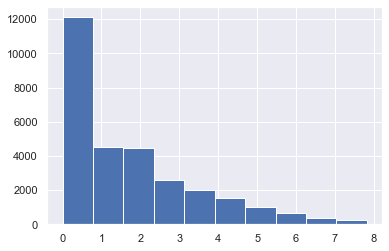

In [107]:
VOCAB['h2'].hist();

# X Factor

In [108]:
# VOCAB['x_factor'] = np.log(VOCAB.term_rank) * VOCAB.h2

In [109]:
# px.scatter(VOCAB, x='term_rank', y='x_factor', hover_name='term_str', color='pos_max', hover_data=['n'])

In [110]:
# VOCAB['x_factor2'] = VOCAB.term_rank2 * VOCAB.h2

In [111]:
VOCAB['x_factor2'] = np.log(VOCAB.term_rank2) * VOCAB.h2

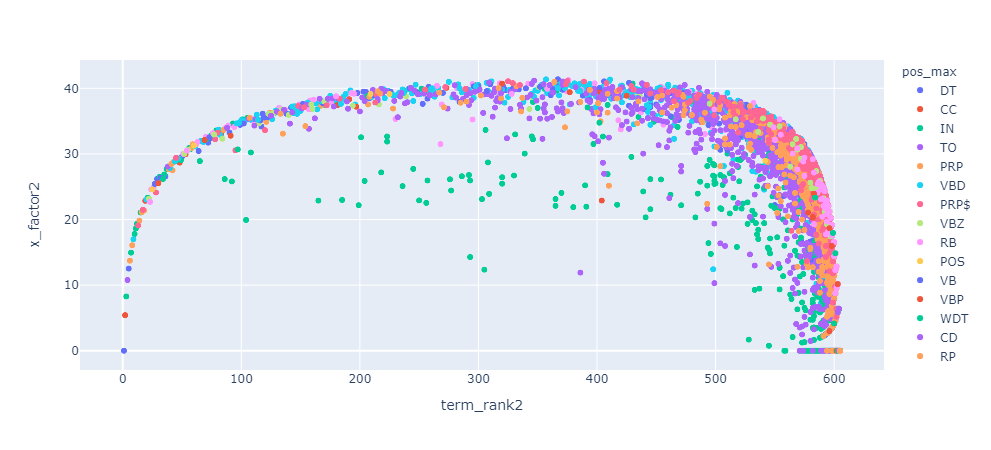

In [112]:
px.scatter(VOCAB, x='term_rank2', y='x_factor2', hover_name='term_str', color='pos_max', hover_data=['n'])

In [113]:
# px.scatter(VOCAB, x='term_rank', y='x_factor', log_x=True, log_y=True, hover_name='term_str', color='pos_max', hover_data=['n'])

In [114]:
# px.scatter(VOCAB, x='term_rank2', y='x_factor2', log_x=True, log_y=True, hover_name='term_str', color='pos_max', hover_data=['n'])

## Demo Table

In [115]:
# demo3 = VOCAB.loc[VOCAB.term_rank.isin(rank_index), ['term_str', 'pos_max', 'n', 'term_rank', 'zipf_k', 'tfidf_sum', 'h2', 'x_factor', 'term_rank2', 'x_factor2']]

In [116]:
# demo3.style.background_gradient(cmap=gradient_cmap)

In [117]:
# px.scatter(demo3, x='term_rank', y='x_factor', log_x=True, log_y=True, text='term_str', color='pos_max', size='n')

In [118]:
# px.scatter(demo3, x='term_rank2', y='x_factor2', log_x=False, log_y=False, text='term_str', color='pos_max', size='n')

# Reduce VOCAB

## Select Significant Terms based on X Factor

We want to take the upper and middle segment of our graph.

In [119]:
# key_col = 'tfidf_sum'
key_col = 'x_factor2'
key_min = VOCAB[key_col].quantile(.9)
rank_min = 200

In [120]:
SIGS = VOCAB.loc[(VOCAB[key_col] >= key_min) & (VOCAB.term_rank >= rank_min)].sort_values(key_col, ascending=False)

In [121]:
SIGS.shape[0]

2805

In [122]:
SIGS[['pos_max', 'term_str', 'n', 'term_rank', 'zipf_k', 'df', 'idf', 'tfidf_sum','x_factor2']].head(100).style.background_gradient(cmap=gradient_cmap, high=1)

,pos_max,term_str,n,term_rank,zipf_k,df,idf,tfidf_sum,x_factor2
term_id,,,,,,,,,
14967,VB,leave,253,457,115621,147,0.227134,0.013890,41.379320
12364,VBD,held,265,436,115540,150,0.218360,0.013137,41.372233
4128,VBD,caught,197,569,112093,129,0.283862,0.013035,41.343166
8641,RB,else,238,479,114002,140,0.248324,0.013819,41.252227
27111,NN,turn,278,419,116482,153,0.209760,0.012972,41.163218
25802,VBG,taking,239,477,114003,144,0.236089,0.013082,41.110264
5100,VBG,coming,309,384,118656,158,0.195795,0.014899,41.076993
29199,VB,wonder,204,555,113220,131,0.277180,0.013006,41.061266
3458,VBD,brought,332,358,118856,168,0.169142,0.012631,41.058465


# Save Work

In [123]:
VOCAB.to_csv('VOCAB2.csv')
TOKEN.to_csv('TOKEN2.csv')
BOW.to_csv('DOC2.csv')
DTCM.to_csv('DTCM.csv')
TFIDF.to_csv('TFIDF.csv')
#SIGS.to_csv('SIGS.csv')
#WCM.to_csv('WCM.csv')
# BOW.to_csv('BOW.csv')

# Similarity and Distance Measures

## Config

We define two OHCO lists, one to match the reduced TFIDF table we are importing, and the other to define the table after we compress this table to make clustering easier.

In [124]:
OHCO_src = ['book_id', 'chap_num']
OHCO = ['book_id']

## Import

In [125]:
import pandas as pd
import numpy as np
import re 
from numpy.linalg import norm
from scipy.spatial.distance import pdist

In [126]:
import seaborn as sns
sns.set(style="ticks")

%matplotlib inline

# Prepare the Data

## Import tables

In [127]:
TFIDF = pd.read_csv('TFIDF.csv').set_index(OHCO_src)
VOCAB = pd.read_csv('VOCAB.csv').set_index('term_id')
LIB = pd.read_csv('LIBRARY.csv').set_index('book_id')

In [128]:
TFIDF.head()

1    2    3    4         5    6    7    8    9  \
book_id chap_num                                                          
1       1         0.000000  0.0  0.0  0.0  0.000112  0.0  0.0  0.0  0.0   
        2         0.000174  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
        3         0.000000  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
        4         0.000000  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   
        5         0.000000  0.0  0.0  0.0  0.000000  0.0  0.0  0.0  0.0   

                        10  ...  29549  29550  29551  29552  29553  29554  \
book_id chap_num            ...                                             
1       1         0.000126  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        2         0.000263  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        3         0.000644  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        4         0.000000  ...    0.0    0.0    0.0    0.0    0.0    0.0   
        5         0.000089  ...    0.0    0.0    0.0    0.0    0.0    0.0   

                  29555     29556  29557  29558  
book_id chap_num                                 
1       1           0.0  0.000000    0.0    0.0  
        2           0.0  0.000000    0.0    0.0  
        3           0.0  0.000000    0.0    0.0  
        4           0.0  0.000000    0.0    0.0  
        5           0.0  0.000118    0.0    0.0  

[5 rows x 29556 columns]

## Add Some Labels to the Library

In [129]:
LIB.loc[LIB.book_title.str.contains('Alcott'), 'author'] = 'Alcott'
LIB['author'] = LIB['author'].fillna('Poe')
LIB['title'] = LIB.book_title.str.split(', by').apply(lambda x: x[0])
LIB.columns = ['book_id','book_title','book_file','author','title']

In [130]:
LIB

,book_id,book_title,book_file,author,title
book_id,,,,,
2787,"An Old - fashioned Girl, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_AN_OLD-FASHIONED_GIRL...,2787,Alcott,An Old - fashioned Girl
2726,"Eight Cousins, by Louisa M. Alcott",epubs_\ALCOTT_MAY_LOUISA_EIGHT_COUSINS-pg2726.txt,2726,Alcott,Eight Cousins
2786,"Jack and Jill, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JACK_AND_JILL-pg2786.txt,2786,Alcott,Jack and Jill
3499,"Jo's Boys, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JO’S_BOYS-pg3499.txt,3499,Alcott,Jo's Boys
2788,"Little Men, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_MEN-pg2788.txt,2788,Alcott,Little Men
514,"Little Women, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_WOMEN-pg514.txt,514,Alcott,Little Women
2804,"Rose in Bloom, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_ROSE_IN_BLOOM-pg2804.txt,2804,Alcott,Rose in Bloom
3795,"Under the Lilacs, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_UNDER_THE_LILACS-pg37...,3795,Alcott,Under the Lilacs
1,The Works of Edgar Allan Poe Volume 1 (of 5) o...,epubs/2147-0.txt,1,Poe,The Works of Edgar Allan Poe Volume 1 (of 5) o...


## Collapse TFIDF

We want to work with larger bags in this notebook, in order to better visualize our resulting clusters.

In [131]:
TFIDF = TFIDF.groupby(OHCO).mean()

In [132]:
TFIDF

,1,2,3,4,5,6,7,8,9,10,...,29549,29550,29551,29552,29553,29554,29555,29556,29557,29558
book_id,,,,,,,,,,,,,,,,,,,,,
1,0.000022,0.000000,0.000000,0.000000,0.000014,0.000000,0.000000,0.000000,0.000000,0.000184,...,0.00010,0.000057,0.000057,0.000000,0.000000,0.000000,0.000000,0.000015,0.000000,0.000000
2,0.000000,0.000000,0.000023,0.000023,0.000000,0.000000,0.000000,0.000000,0.000000,0.000097,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
3,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
4,0.000000,0.000034,0.000000,0.000000,0.000000,0.000034,0.000034,0.000000,0.000000,0.000157,...,0.00001,0.000000,0.000000,0.000077,0.000077,0.000012,0.000012,0.000000,0.000012,0.000041
5,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000097,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000054
514,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2726,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000013,0.000013,0.000012,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2786,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000011,0.000011,0.000019,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
2787,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000


## Create a DOC table

We want to create a new table that maps the OHCO levels to a single doc_id. We do this so that when we create a table to store pairs of docs and their distances, we can use a single-valued ID for each docs. 

This table will also be used to store cluster assignments.

All of this will become clearer below!

In [133]:
DOC = TFIDF.reset_index()[OHCO] # We create a table from the OHCO in our TFIDF table

In [134]:
DOC.head()

,book_id
0,1
1,2
2,3
3,4
4,5


In [135]:
DOC.index.name = 'doc_id' # We give the new index a name

In [136]:
DOC.head()

,book_id
doc_id,
0,1
1,2
2,3
3,4
4,5


## Add a meaningful Title to DOC index

In [137]:
DOC['title'] = DOC.book_id.map(LIB.author) \
    + '-' + DOC[OHCO].apply(lambda x: x.astype('str').str.cat(sep='-'), 1) \
    + ': '+ DOC.book_id.map(LIB.title) 

In [138]:
DOC

,book_id,title
doc_id,,
0,1,Poe-1: The Works of Edgar Allan Poe Volume 1 (...
1,2,Poe-2: The Works of Edgar Allan Poe Volume 2 (...
2,3,Poe-3: The Works of Edgar Allan Poe Volume 3 (...
3,4,Poe-4: The Works of Edgar Allan Poe Volume 4 (...
4,5,Poe-5: The Works of Edgar Allan Poe Volume 5 (...
5,514,Alcott-514: Little Women
6,2726,Alcott-2726: Eight Cousins
7,2786,Alcott-2786: Jack and Jill
8,2787,Alcott-2787: An Old - fashioned Girl


## Create Normalized Tables

In [139]:
L0 = TFIDF.astype('bool').astype('int')
L1 = TFIDF.apply(lambda x: x / x.sum(), 1)
L2 = TFIDF.apply(lambda x: x / norm(x), 1)

In [140]:
# ((L2.T)**2).sum()

## Create Doc Pair Table

Create a table to store our results.

Note that `pist()` is a "distance matrix computation from a collection of raw observation vectors stored in a rectangular array".

In [141]:
PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([DOC.index.tolist(), DOC.index.tolist()])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['doc_a', 'doc_b']

In [142]:
PAIRS.shape

(78, 0)

In [143]:
PAIRS.head()

Empty DataFrame
Columns: []
Index: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5)]

# Compute Distances

In [144]:
%time PAIRS['cityblock'] = pdist(TFIDF, 'cityblock')

Wall time: 6.98 ms


In [145]:
%time PAIRS['euclidean'] = pdist(TFIDF, 'euclidean')

Wall time: 7.98 ms


In [146]:
%time PAIRS['cosine'] = pdist(TFIDF, 'cosine')

Wall time: 7.98 ms


In [147]:
%time PAIRS['jaccard'] = pdist(L0, 'jaccard') # Fast, and similar to js

Wall time: 20.9 ms


In [148]:
%time PAIRS['dice'] = pdist(L0, 'dice')

Wall time: 4.99 ms


In [149]:
# %time PAIRS['js'] = pdist(L1, 'jensenshannon') # Turns out to be really slow                               

In [150]:
%time PAIRS['euclidean2'] = pdist(L2, 'euclidean') # Should be the same as cosine (colinear)

Wall time: 4.99 ms


In [151]:
%time PAIRS['js'] = pdist(TFIDF, 'jensenshannon')

Wall time: 28.9 ms


In [152]:
import scipy
scipy.__version__

'1.3.2'

In [153]:
PAIRS.head()

cityblock  euclidean    cosine   jaccard      dice  euclidean2  \
doc_a doc_b                                                                   
0     1       0.529754   0.007972  0.599803  0.641180  0.471865    1.095265   
      2       0.611615   0.011209  0.757811  0.712373  0.553245    1.231106   
      3       0.582552   0.008748  0.676188  0.656640  0.488804    1.162917   
      4       0.645247   0.011271  0.782488  0.702160  0.541023    1.250990   
      5       0.576153   0.011543  0.919940  0.737200  0.583782    1.356422   

                   js  
doc_a doc_b            
0     1      0.582456  
      2      0.646053  
      3      0.610223  
      4      0.651606  
      5      0.695814

## Compare Distributions

In [154]:
if PAIRS.shape[0] > 1000:
    SAMPLE = PAIRS.sample(1000)
else:
    SAMPLE = PAIRS

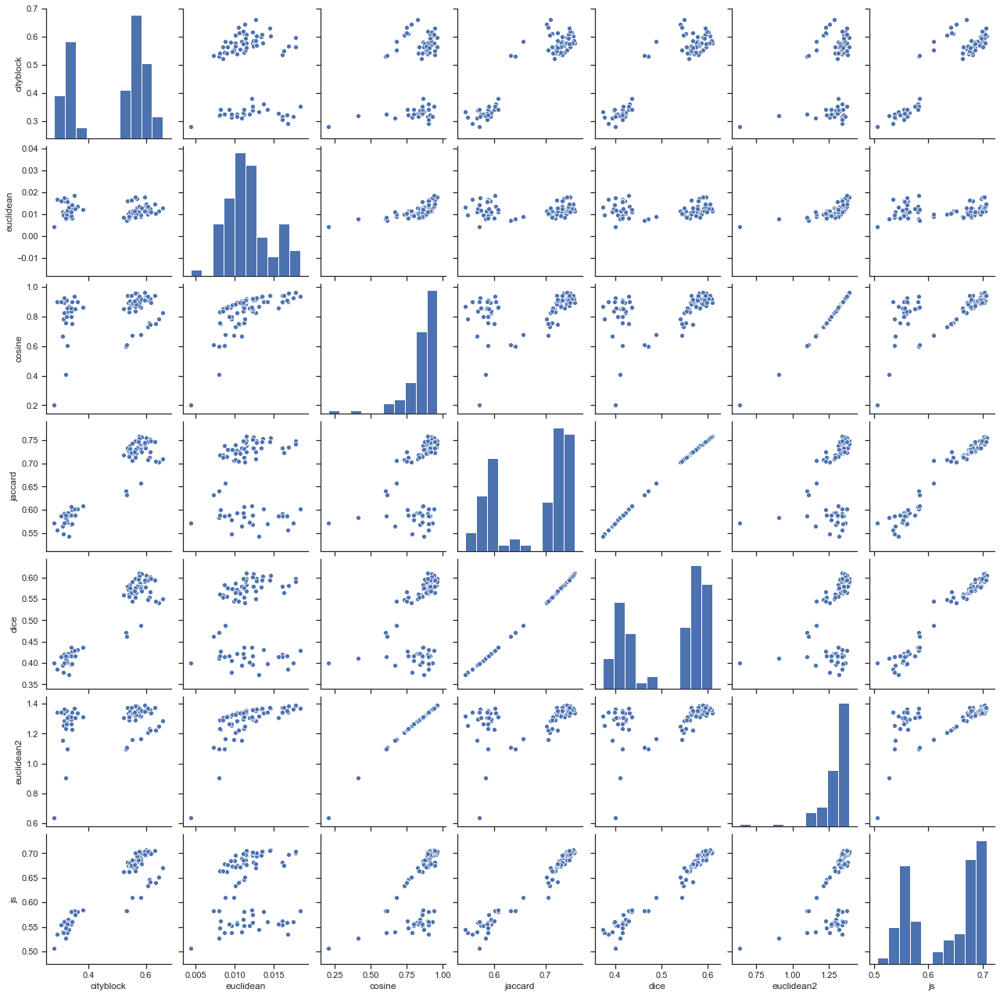

In [155]:
sns.pairplot(SAMPLE)

In [156]:
PAIRS.sort_values('cosine').head(20).style.background_gradient('YlGn', high=1)

,,cityblock,euclidean,cosine,jaccard,dice,euclidean2,js
doc_a,doc_b,,,,,,,
6,10,0.279733,0.004397,0.203373,0.571110,0.399688,0.637767,0.506003
9,11,0.320440,0.007974,0.408351,0.582797,0.411230,0.903716,0.527273
0,1,0.529754,0.007972,0.599803,0.641180,0.471865,1.095265,0.582456
5,11,0.325244,0.008646,0.604417,0.587026,0.415454,1.099470,0.538363
1,3,0.533722,0.007259,0.611246,0.632314,0.462324,1.105664,0.583025
5,9,0.309606,0.010875,0.665723,0.565483,0.394197,1.153883,0.539526
1,2,0.552469,0.009888,0.674817,0.705388,0.544864,1.161737,0.610005
0,3,0.582552,0.008748,0.676188,0.656640,0.488804,1.162917,0.610223
1,4,0.606536,0.010094,0.729115,0.707712,0.547643,1.207572,0.633531


In [157]:
# def get_comps(doc_id):
#     idx = pd.IndexSlice
#     a = PAIRS.loc[idx[doc_id, :], :]
#     b = PAIRS.loc[idx[:, doc_id], :]
#     return pd.concat([a,b])

# Create Clusters

## Hiearchical

In [158]:
import scipy.cluster.hierarchy as sch
import matplotlib.pyplot as plt

In [159]:
def hca(sims, linkage_method='ward', color_thresh=.3, figsize=(10, 10)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = DOC.title.values
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh
                               )
    plt.tick_params(axis='both', which='major', labelsize=14)

<Figure size 432x288 with 0 Axes>

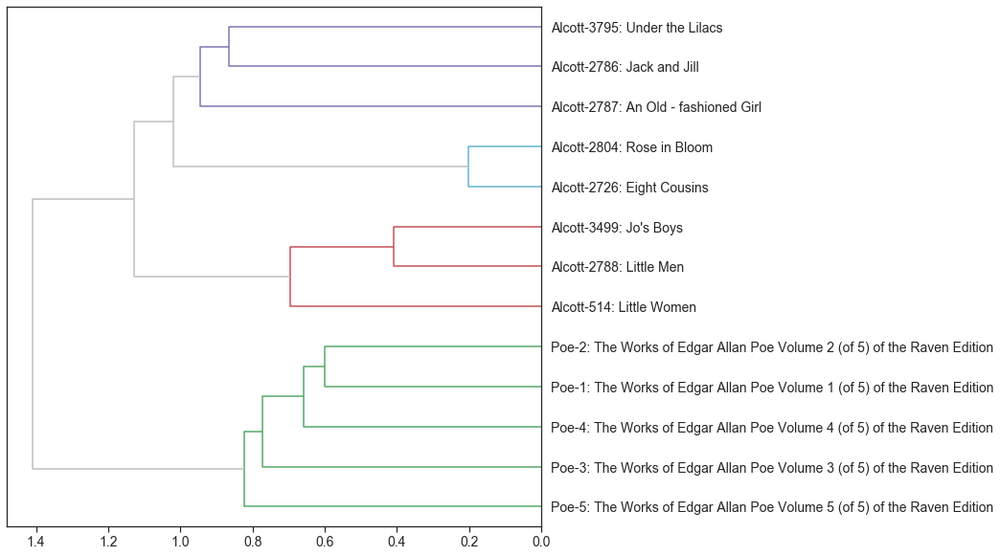

In [160]:
hca(PAIRS.cosine, color_thresh=1)

<Figure size 432x288 with 0 Axes>

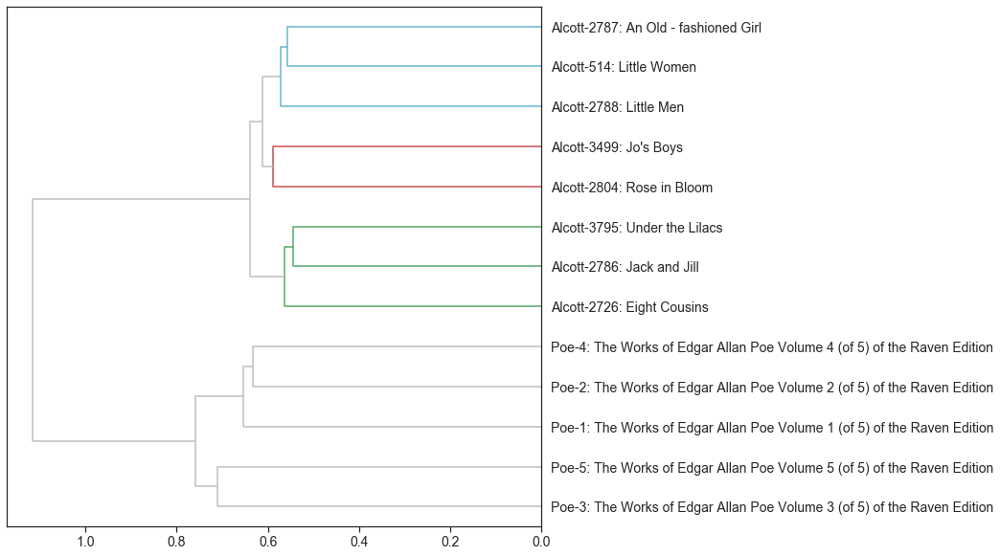

In [161]:
hca(PAIRS.jaccard, color_thresh=.6)

<Figure size 432x288 with 0 Axes>

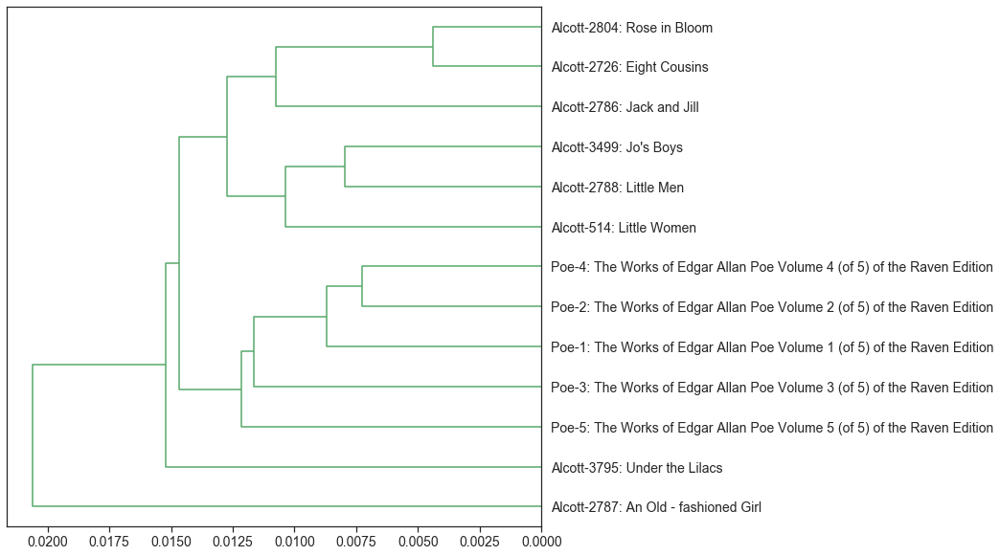

In [162]:
hca(PAIRS.euclidean, color_thresh=.3)

<Figure size 432x288 with 0 Axes>

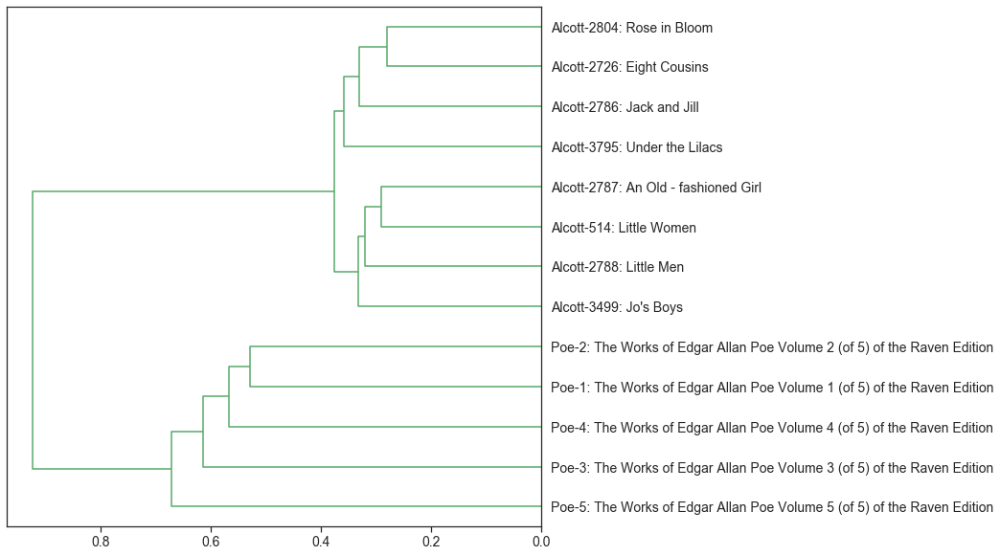

In [163]:
hca(PAIRS.cityblock, color_thresh=8)

<Figure size 432x288 with 0 Axes>

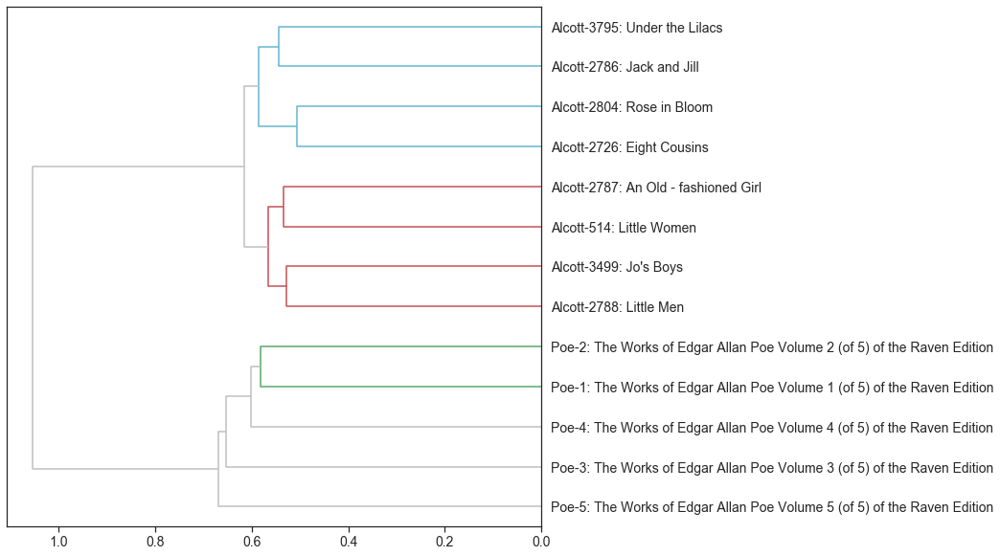

In [164]:
hca(PAIRS.js, color_thresh=.6)

## K-Means

K-Means *only* uses Euclidean distance. Why?

* The K-Means procedure does not explicitly use pairwise distances between data points. 
* Instead, it repeatedly assigns points to the closest centroid thereby using Euclidean distance from data points to a centroid. 
* However, K-Means is *implicitly* based on pairwise Euclidean distances between data points, because the sum of squared deviations from centroid is equal to the sum of pairwise squared Euclidean distances divided by the number of points. 
* The term "centroid" is itself from Euclidean geometry. It is multivariate mean in Euclidean space. Euclidean space is about euclidean distances. Non-Euclidean distances will generally not span Euclidean space. That's why K-Means is for Euclidean distances only.

See the [Cross Validated](https://stats.stackexchange.com/questions/81481/why-does-k-means-clustering-algorithm-use-only-euclidean-distance-metric) post on this.

In [165]:
from sklearn.cluster import KMeans

In [166]:
n_clusters = 4

In [167]:
DOC['y_raw'] = KMeans(n_clusters).fit_predict(TFIDF)
DOC['y_L0'] = KMeans(n_clusters).fit_predict(L0)
DOC['y_L1'] = KMeans(n_clusters).fit_predict(L1)
DOC['y_L2'] = KMeans(n_clusters).fit_predict(L2)

In [168]:
DOC.sort_values('y_raw').style.background_gradient(cmap='YlGn', high=1)

,book_id,title,y_raw,y_L0,y_L1,y_L2
doc_id,,,,,,
12,3795,Alcott-3795: Under the Lilacs,0,0,3,3
5,514,Alcott-514: Little Women,1,0,0,0
6,2726,Alcott-2726: Eight Cousins,1,0,0,3
7,2786,Alcott-2786: Jack and Jill,1,0,0,0
9,2788,Alcott-2788: Little Men,1,0,2,0
10,2804,Alcott-2804: Rose in Bloom,1,0,0,3
11,3499,Alcott-3499: Jo's Boys,1,0,0,0
8,2787,Alcott-2787: An Old - fashioned Girl,2,0,1,2
0,1,Poe-1: The Works of Edgar Allan Poe Volume 1 (of 5) of the Raven Edition,3,1,0,1


# Save Work

In [169]:
DOC.to_csv('DOC3.csv')
LIB.to_csv('LIB3.csv')
TFIDF.to_csv('TFIDF_book_final.csv')

# Principal Component Analysis 

In [170]:
OHCO = ['book_id', 'chap_num']

In [171]:
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
from scipy.linalg import norm

In [172]:
import plotly_express as px
import seaborn as sns

In [173]:
sns.set(style='ticks')
%matplotlib inline

In [174]:
LIB = pd.read_csv('LIB3.csv').set_index('book_id')
VOCAB = pd.read_csv('VOCAB2.csv').set_index('term_id')
TFIDF = pd.read_csv('TFIDF.csv').set_index(OHCO)

In [175]:
TFIDF.shape

(248, 29556)

## Normalize doc vector lengths

We use L2 normalization

In [176]:
# TFIDF = TFIDF.apply(lambda x: x / norm(x, 2), 1)

In [177]:
TFIDF = TFIDF.apply(lambda x: x / np.sqrt(np.square(x).sum()), 1)

## Normalize term vector variance

We do **not** normalize variance, which we would normally do, such as with data containing divergent units of measure. \
This is because to do so would exaggerate the importance of rare words (see Ng, 2008: 6m40s &mdash; 8m00s).

## Center the word vectors

Note that we are taking the column-wise means -- the means for the term vectors. \
We don't really need to do this. But it is typical for PCA. \
**NOTE:** Some argue that centering alters the cosine angles.

In [178]:
TFIDF = TFIDF - TFIDF.mean()

# Compute Covariance Matrix

$n = |X| = |Y|$

$Cov(X,Y) = \dfrac{\sum_{i=1}^{n} (x_i - \mu_X) (y_i - \mu_Y)}{n - 1} = \dfrac{XY}{n-1}$

We could we use the built in Pandas method here, but compute it ourselves.

In [179]:
# COV = TFIDF.cov() # This also centers the vectors
COV = TFIDF.T.dot(TFIDF) / (TFIDF.shape[0] - 1)

In [180]:
COV.head()

,1,2,3,4,5,6,7,8,9,10,...,29549,29550,29551,29552,29553,29554,29555,29556,29557,29558
1,3.759325e-07,-5.998677e-09,-4.502953e-09,-4.502953e-09,-1.493126e-09,-5.998677e-09,-5.998677e-09,-4.176768e-09,-4.176768e-09,4.916907e-07,...,-7.653323e-09,-3.180492e-09,-3.180492e-09,-7.837017e-09,-7.837017e-09,-2.392873e-09,-2.392873e-09,-1.181405e-09,-2.392873e-09,-1.094845e-08
2,-5.998677e-09,5.839759e-06,-1.774761e-08,-1.774761e-08,-5.884898e-09,5.839759e-06,5.839759e-06,-1.646201e-08,-1.646201e-08,1.904993e-06,...,-3.016425e-08,-1.253536e-08,-1.253536e-08,-3.088825e-08,-3.088825e-08,-9.431096e-09,-9.431096e-09,-4.656305e-09,-9.431096e-09,-4.315144e-08
3,-4.502953e-09,-1.774761e-08,3.290628e-06,3.290628e-06,-4.417544e-09,-1.774761e-08,-1.774761e-08,-1.235733e-08,-1.235733e-08,6.000546e-06,...,-2.264303e-08,-9.409764e-09,-9.409764e-09,-2.318650e-08,-2.318650e-08,-7.079525e-09,-7.079525e-09,-3.495291e-09,-7.079525e-09,-3.239196e-08
4,-4.502953e-09,-1.774761e-08,3.290628e-06,3.290628e-06,-4.417544e-09,-1.774761e-08,-1.774761e-08,-1.235733e-08,-1.235733e-08,6.000546e-06,...,-2.264303e-08,-9.409764e-09,-9.409764e-09,-2.318650e-08,-2.318650e-08,-7.079525e-09,-7.079525e-09,-3.495291e-09,-7.079525e-09,-3.239196e-08
5,-1.493126e-09,-5.884898e-09,-4.417544e-09,-4.417544e-09,3.618070e-07,-5.884898e-09,-5.884898e-09,-4.097546e-09,-4.097546e-09,3.347574e-07,...,-7.508161e-09,-3.120167e-09,-3.120167e-09,-7.688370e-09,-7.688370e-09,-2.347487e-09,-2.347487e-09,-1.158997e-09,-2.347487e-09,-1.074079e-08


In [181]:
COV.iloc[:5,:10].style.background_gradient()

,1,2,3,4,5,6,7,8,9,10
1,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000
2,-0.000000,0.000006,-0.000000,-0.000000,-0.000000,0.000006,0.000006,-0.000000,-0.000000,0.000002
3,-0.000000,-0.000000,0.000003,0.000003,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000006
4,-0.000000,-0.000000,0.000003,0.000003,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000006
5,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000


# Decompose the Matrix

There a at least three options to choose from. We go with SciPy's Hermitian Eigendecomposition \
method `eigh()`, since our covarience matrix is symmetric.

In [182]:
from scipy.linalg import eigh

In [183]:
%time eig_vals, eig_vecs = eigh(COV)

Wall time: 38min 7s


## Convert eigen data to dataframes

In [184]:
TERM_IDX = COV.index

In [185]:
EIG_VEC = pd.DataFrame(eig_vecs, index=TERM_IDX, columns=TERM_IDX)

In [186]:
EIG_VAL = pd.DataFrame(eig_vals, index=TERM_IDX, columns=['eig_val'])
EIG_VAL.index.name = 'term_id'

In [187]:
EIG_VEC.iloc[:5, :10].style.background_gradient()

term_id,1,2,3,4,5,6,7,8,9,10
term_id,,,,,,,,,,
1,0.000190,-0.001031,-0.000304,-0.000409,-0.000115,-0.000882,0.000172,-0.000482,0.000705,0.000537
2,0.050576,-0.001631,-0.017232,0.050186,-0.004421,-0.006207,-0.016342,-0.041056,0.080598,0.024476
3,-0.251753,-0.438206,-0.160220,-0.297737,0.218325,-0.217058,0.075961,0.031302,0.078241,0.029414
4,0.527026,-0.456357,0.027362,0.023019,-0.124215,0.060804,-0.069133,0.047233,-0.110051,-0.025309
5,-0.508285,-0.242777,0.262401,0.130595,-0.323529,-0.142930,-0.171910,-0.129455,0.028169,0.015121


In [188]:
EIG_VAL.iloc[:5]

,eig_val
term_id,
1,-1.677703e-16
2,-1.053346e-16
3,-7.552308e-17
4,-6.765879e-17
5,-6.184650e-17


# Select Principal Components

Next, we associate each eigenvalue with its corresponding *column* in the eigenvalue matrix. \
This is why we transpose the `EIG_VEC` dataframe.

## Combine eigenvalues and eignvectors

In [189]:
EIG_PAIRS = EIG_VAL.join(EIG_VEC.T)

In [190]:
EIG_PAIRS.head()

,eig_val,1,2,3,4,5,6,7,8,9,...,29549,29550,29551,29552,29553,29554,29555,29556,29557,29558
term_id,,,,,,,,,,,,,,,,,,,,,
1,-1.677703e-16,0.000190,0.050576,-0.251753,0.527026,-0.508285,0.428594,-0.239088,0.061406,-0.002834,...,0.000362,-0.000065,-0.000066,0.000383,-0.000073,0.000050,-0.000034,-0.000136,0.000084,0.000143
2,-1.053346e-16,-0.001031,-0.001631,-0.438206,-0.456357,-0.242777,0.159917,0.033440,-0.069839,-0.001033,...,0.001012,-0.000332,-0.000327,0.000570,0.000857,0.000218,0.000354,-0.000170,0.000242,0.000354
3,-7.552308e-17,-0.000304,-0.017232,-0.160220,0.027362,0.262401,-0.205032,-0.398608,0.293331,0.136964,...,0.000506,0.000581,0.000528,0.000188,0.000176,0.000148,0.000014,-0.000157,-0.000029,0.000796
4,-6.765879e-17,-0.000409,0.050186,-0.297737,0.023019,0.130595,-0.080832,-0.008371,0.244443,0.058025,...,0.000134,-0.000367,-0.000422,-0.000012,-0.000009,-0.000336,-0.000315,-0.000287,-0.000396,0.000387
5,-6.184650e-17,-0.000115,-0.004421,0.218325,-0.124215,-0.323529,-0.200387,-0.031553,0.464226,0.169672,...,-0.000131,-0.000459,-0.000463,-0.000195,-0.000245,0.000245,0.000235,0.000227,0.000307,-0.000142


Next, we sort in descending order and pick the top K (=10).

## Compute and Show Explained Variance

We might have usd this value to sort our components.

In [191]:
EIG_PAIRS['exp_var'] = np.round((EIG_PAIRS.eig_val / EIG_PAIRS.eig_val.sum()) * 100, 2)

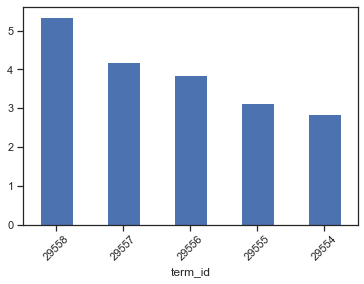

In [192]:
EIG_PAIRS.exp_var.sort_values(ascending=False).head().plot.bar(rot=45)

## Pick Top K (10) Components

We pick these based on explained variance.

In [193]:
COMPS = EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).reset_index(drop=True)
COMPS.index.name = 'comp_id'
COMPS.index = ["PC{}".format(i) for i in COMPS.index.tolist()]

In [194]:
COMPS

,eig_val,1,2,3,4,5,6,7,8,9,...,29550,29551,29552,29553,29554,29555,29556,29557,29558,exp_var
PC0,0.050096,0.000028,0.000069,0.000090,0.000090,3.489732e-05,0.000069,0.000069,0.000099,0.000099,...,0.000055,0.000055,0.000113,0.000113,0.000047,0.000047,0.000021,0.000047,0.000196,5.34
PC1,0.039452,-0.000052,-0.000191,-0.000168,-0.000168,-6.636143e-05,-0.000191,-0.000191,-0.000254,-0.000254,...,-0.000111,-0.000111,-0.000251,-0.000251,-0.000088,-0.000088,-0.000046,-0.000088,-0.000404,4.20
PC2,0.036098,0.000009,0.000035,0.000041,0.000041,2.256769e-05,0.000035,0.000035,0.000132,0.000132,...,0.000021,0.000021,0.000029,0.000029,0.000032,0.000032,0.000015,0.000032,0.000085,3.85
PC3,0.029467,0.000154,0.000548,0.000495,0.000495,2.016357e-04,0.000548,0.000548,0.000450,0.000450,...,0.000356,0.000356,0.000590,0.000590,0.000259,0.000259,0.000134,0.000259,0.001111,3.14
PC4,0.026793,-0.000068,-0.000234,-0.000228,-0.000228,-9.533447e-05,-0.000234,-0.000234,-0.000326,-0.000326,...,-0.000148,-0.000148,-0.000347,-0.000347,-0.000135,-0.000135,-0.000068,-0.000135,-0.000550,2.85
PC5,0.023343,-0.000327,-0.001058,-0.001078,-0.001078,-4.862476e-04,-0.001058,-0.001058,-0.000743,-0.000743,...,-0.000743,-0.000743,-0.001283,-0.001283,-0.000592,-0.000592,-0.000307,-0.000592,-0.002542,2.49
PC6,0.015340,0.000129,0.000281,0.000285,0.000285,2.311249e-04,0.000281,0.000281,-0.006631,-0.006631,...,0.000211,0.000211,0.000329,0.000329,0.000251,0.000251,0.000130,0.000251,0.001117,1.63
PC7,0.012568,-0.000085,-0.000046,-0.000210,-0.000210,-1.387821e-04,-0.000046,-0.000046,0.000178,0.000178,...,-0.000198,-0.000198,-0.000039,-0.000039,-0.000111,-0.000111,-0.000065,-0.000111,-0.000523,1.34
PC8,0.010517,0.000015,-0.000148,-0.000081,-0.000081,-1.883173e-07,-0.000148,-0.000148,-0.000195,-0.000195,...,0.000070,0.000070,-0.000136,-0.000136,-0.000040,-0.000040,-0.000002,-0.000040,-0.000140,1.12
PC9,0.008898,-0.000112,0.000031,-0.000189,-0.000189,-1.880461e-04,0.000031,0.000031,-0.000031,-0.000031,...,-0.000292,-0.000292,-0.000127,-0.000127,-0.000133,-0.000133,-0.000148,-0.000133,-0.000351,0.95


# Inspect terms associated with eigenvectors

In [195]:
VOCAB.loc[[int(x) for x in EIG_PAIRS.sort_values('exp_var', ascending=False).head(10).index], 'term_str']

term_id
29558          être
29557           été
29556       émeutes
29555         élite
29554      échapper
29553    æstheticus
29552      æschylus
29551    ærostation
29550      æronauts
29549       æronaut
Name: term_str, dtype: object

## Show Loadings

Loadings sow the contribution of each term to the component. \
We'll just look at the topi 10 words for the first two components in the Book version.

In [196]:
LOADINGS = COMPS[TERM_IDX].T
LOADINGS.index.name = 'term_id'

In [197]:
LOADINGS.head().style.background_gradient()

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
1,0.000028,-0.000052,0.000009,0.000154,-0.000068,-0.000327,0.000129,-0.000085,0.000015,-0.000112
2,0.000069,-0.000191,0.000035,0.000548,-0.000234,-0.001058,0.000281,-0.000046,-0.000148,0.000031
3,0.000090,-0.000168,0.000041,0.000495,-0.000228,-0.001078,0.000285,-0.000210,-0.000081,-0.000189
4,0.000090,-0.000168,0.000041,0.000495,-0.000228,-0.001078,0.000285,-0.000210,-0.000081,-0.000189
5,0.000035,-0.000066,0.000023,0.000202,-0.000095,-0.000486,0.000231,-0.000139,-0.000000,-0.000188


In [198]:
LOADINGS['term_str'] = LOADINGS.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

In [199]:
l0_pos = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
l0_neg = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
l1_pos = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')
l1_neg = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')

In [200]:
print('Books PC0+', l0_pos)
print('Books PC0-', l0_neg)
print('Books PC1+', l1_pos)
print('Books PC1-', l1_neg)

Books PC0+ polly tom fanny maud fan shaw trix sydney grandma nt
Books PC0- jo ben meg dan rose mac laurie beth phebe bab
Books PC1+ ben bab celia thorny betty mac rose phebe sancho sanch
Books PC1- jo meg laurie dan beth amy march nat bhaer demi


# Project Docs onto New Subspace

We get the dot product of the DTM matrix and the new component matrix, which we will call DCM -- for document-component matrix. \
This has the effect of replacing the features of the DTM with the features of the transposed component matrix.

In [201]:
DCM = TFIDF.dot(COMPS[TERM_IDX].T)

In [202]:
DCM

PC0       PC1       PC2       PC3       PC4       PC5  \
book_id chap_num                                                               
1       1         0.045586 -0.068268  0.021243  0.154930 -0.066606 -0.295966   
        2         0.036468 -0.052018  0.007954  0.116133 -0.046357 -0.195441   
        3         0.031147 -0.054016  0.006790  0.103811 -0.048130 -0.174429   
        4         0.038437 -0.061656  0.016392  0.134503 -0.061723 -0.256758   
        5         0.034846 -0.060136  0.017363  0.130076 -0.060269 -0.236491   
...                    ...       ...       ...       ...       ...       ...   
3795    20        0.099089 -0.425193 -0.435227 -0.217947  0.045435  0.081270   
        21        0.074833 -0.294456 -0.290467 -0.129541  0.024497  0.043422   
        22        0.086546 -0.360335 -0.361546 -0.169126  0.033315  0.056944   
        23        0.103214 -0.451264 -0.475770 -0.251713  0.058225  0.107191   
        24        0.056451 -0.178924 -0.106545  0.053196 -0.053017 -0.164683   

                       PC6       PC7       PC8       PC9  
book_id chap_num                                          
1       1         0.092448 -0.045482 -0.000052 -0.043629  
        2         0.050429 -0.027351  0.004047 -0.025503  
        3         0.038767 -0.013583 -0.005808 -0.001074  
        4         0.085044 -0.032434  0.002938 -0.054203  
        5         0.065547 -0.026885 -0.000811 -0.043410  
...                    ...       ...       ...       ...  
3795    20        0.018139 -0.001406  0.001315  0.030075  
        21        0.025105  0.004605  0.004458  0.018747  
        22        0.015199 -0.011090 -0.005427 -0.012233  
        23        0.009404 -0.011621 -0.007712  0.014169  
        24       -0.932541  0.018355 -0.024794 -0.007313  

[248 rows x 10 columns]

We add metadata to our new, reduced matrices for display purposes.

In [203]:
DCM = DCM.join(LIB[['author','title']], on='book_id')

In [204]:
DCM['doc'] = DCM.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [205]:
DCM.head().style.background_gradient()

# Visualize

In [206]:
def vis_pcs(M, a, b, label='author', prefix='PC'):
    fig = px.scatter(M, prefix + str(a), prefix + str(b), 
                        color=label, 
                        hover_name='doc', marginal_x='box')
    fig.show()

## PC 0 and 1

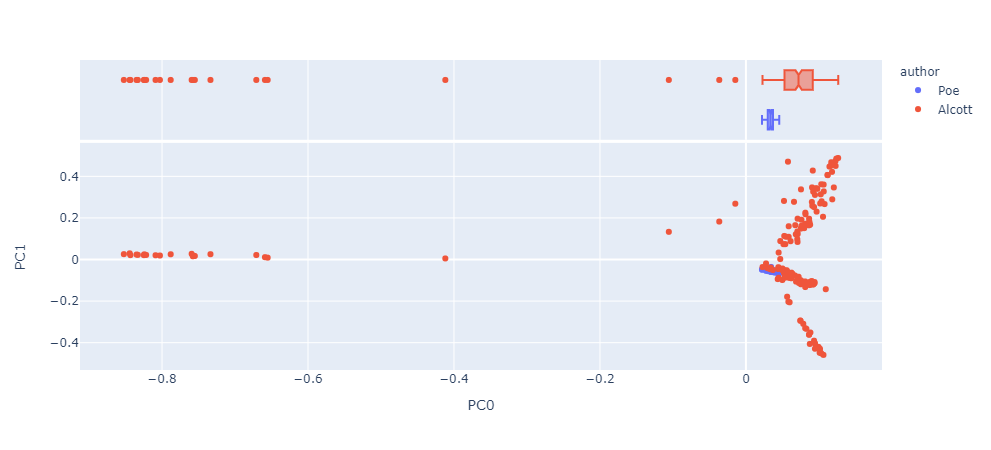

In [207]:
vis_pcs(DCM, 0, 1)

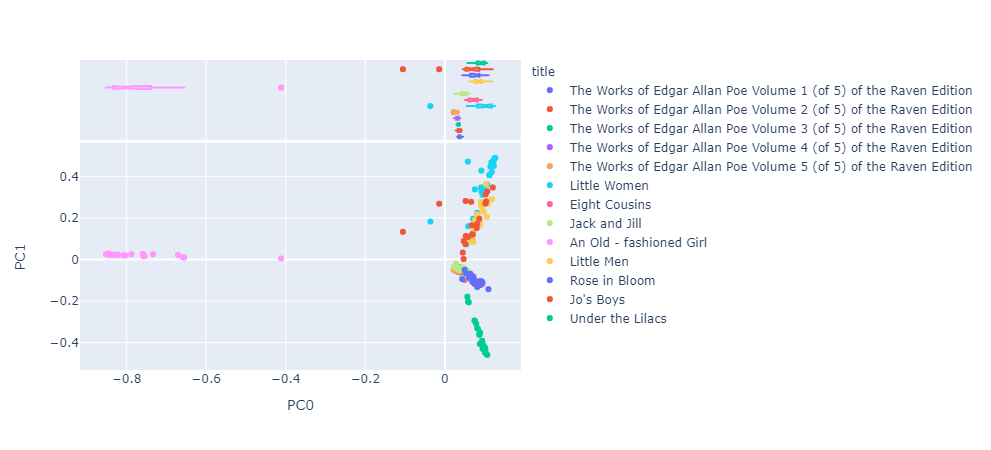

In [208]:
vis_pcs(DCM, 0, 1, label='title')

## PC 1 and 2

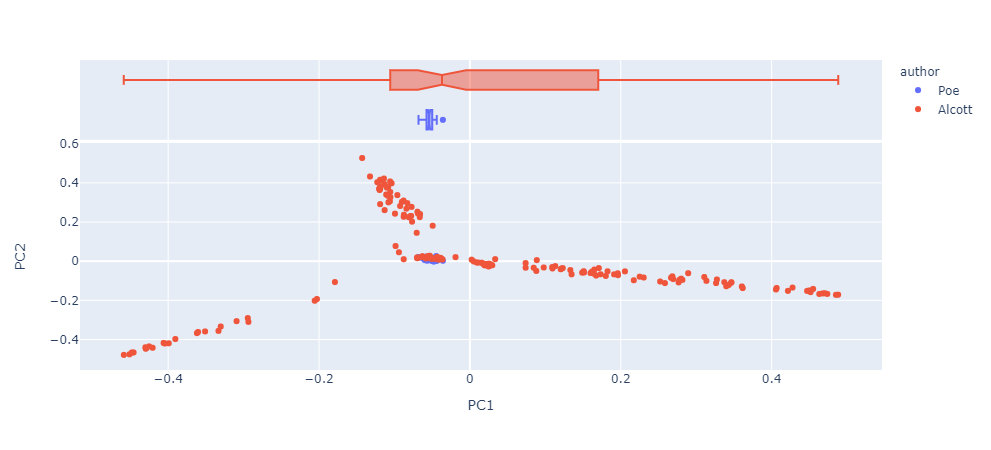

In [209]:
vis_pcs(DCM, 1, 2)

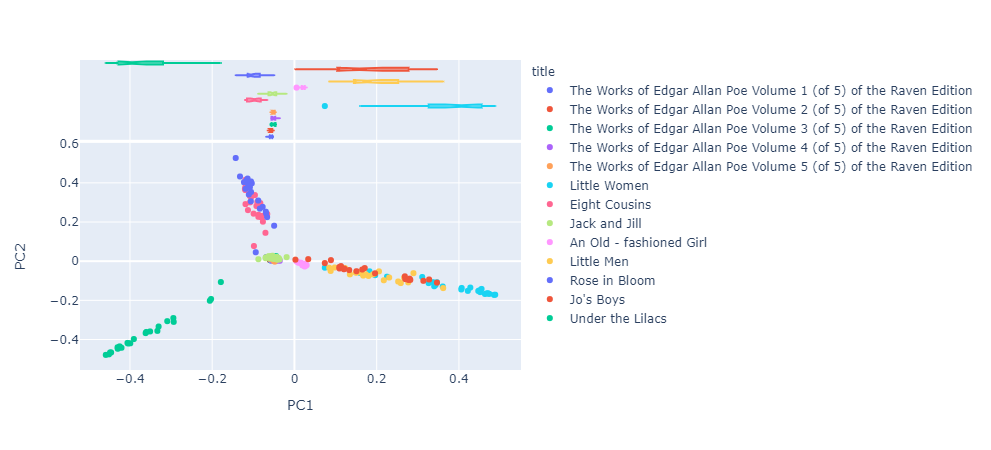

In [210]:
vis_pcs(DCM, 1, 2, label='title')

## PC 2 and 3

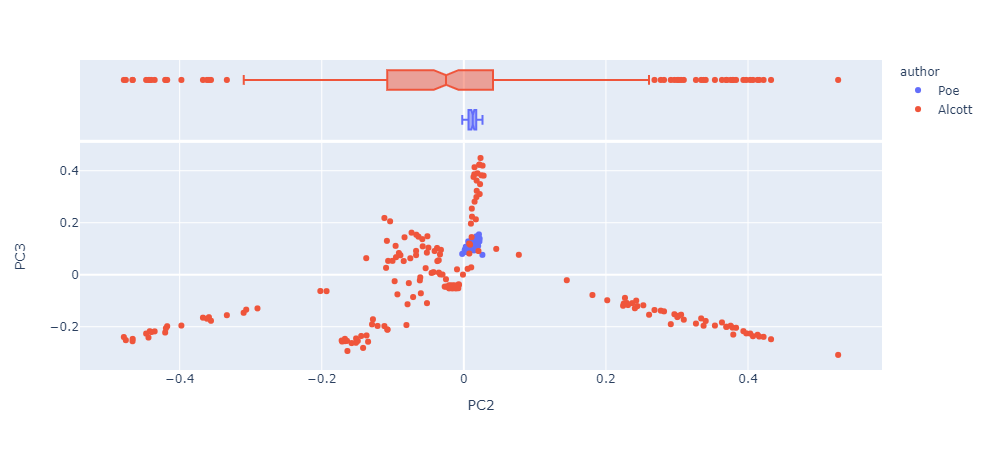

In [211]:
vis_pcs(DCM, 2, 3)

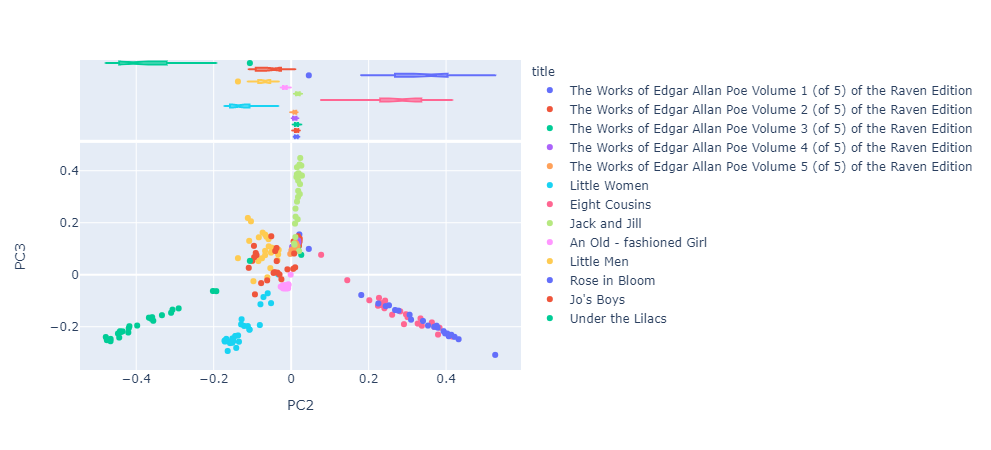

In [212]:
vis_pcs(DCM, 2, 3, label='title')

## PC 3 and 4

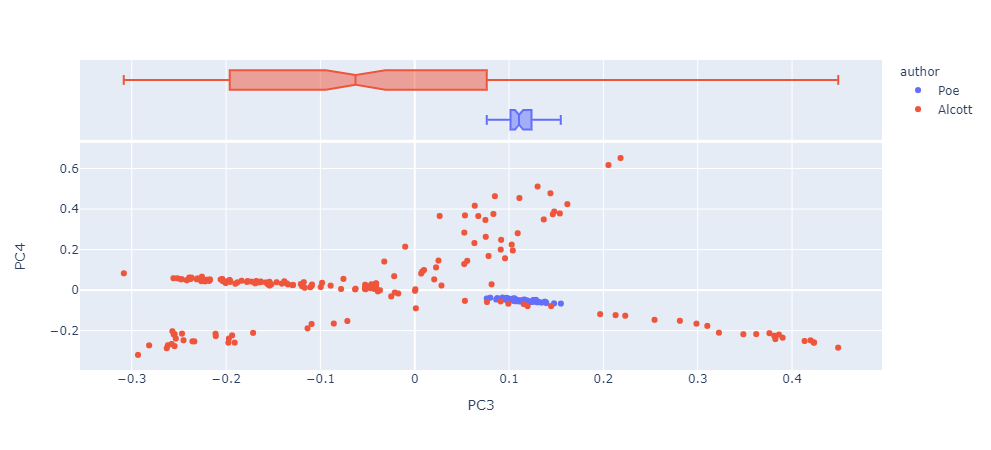

In [213]:
vis_pcs(DCM, 3, 4, label='author')

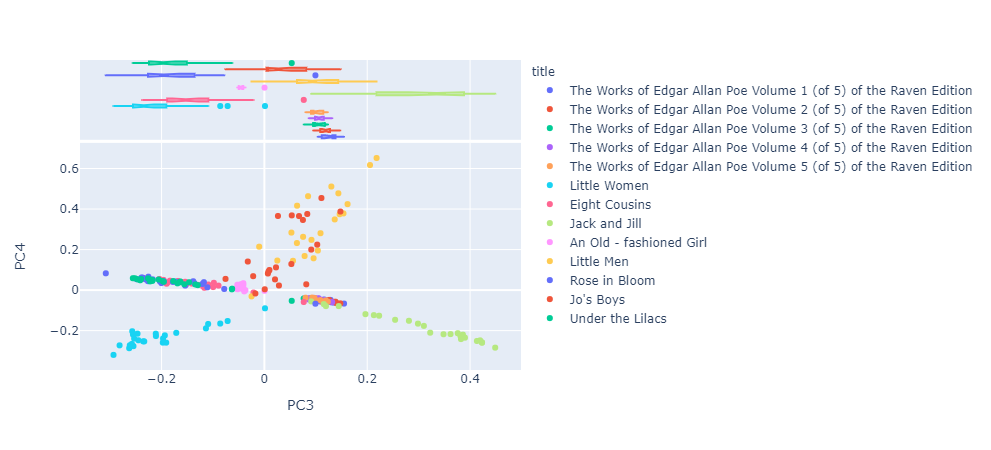

In [214]:
vis_pcs(DCM, 3, 4, label='title')

# Compare to Scikit Learn

In [215]:
pca_engine = PCA(n_components=10)

In [216]:
DCM_sk = pd.DataFrame(pca_engine.fit_transform(TFIDF), index=TFIDF.index)
DCM_sk.columns = ['PC{}'.format(i) for i in DCM_sk.columns]
DCM_sk = DCM_sk.join(LIB[['author','title']], on='book_id')
DCM_sk['doc'] = DCM_sk.apply(lambda x: "{}-{}-{}".format(x.author, x.title, x.name[1]), 1)

In [217]:
DCM_sk.head().style.background_gradient()

## PC 0 and 1

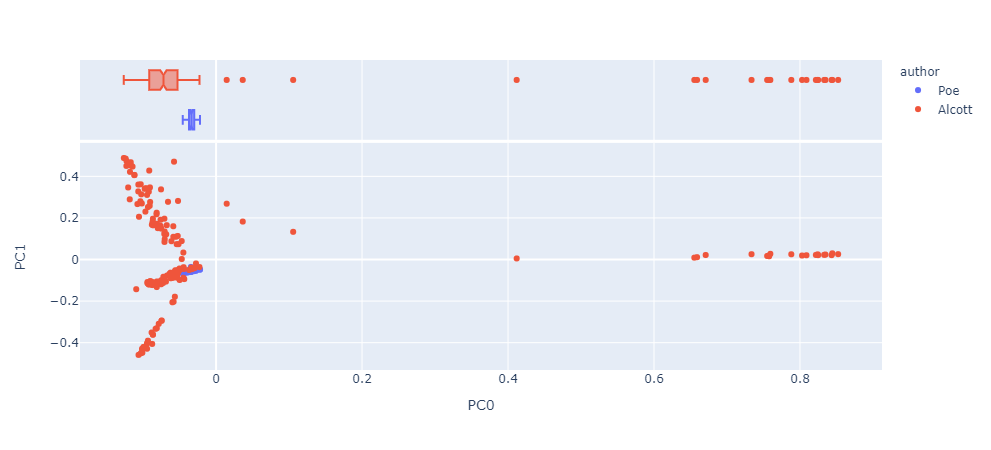

In [218]:
vis_pcs(DCM_sk, 0, 1)

## PC 0 and 1

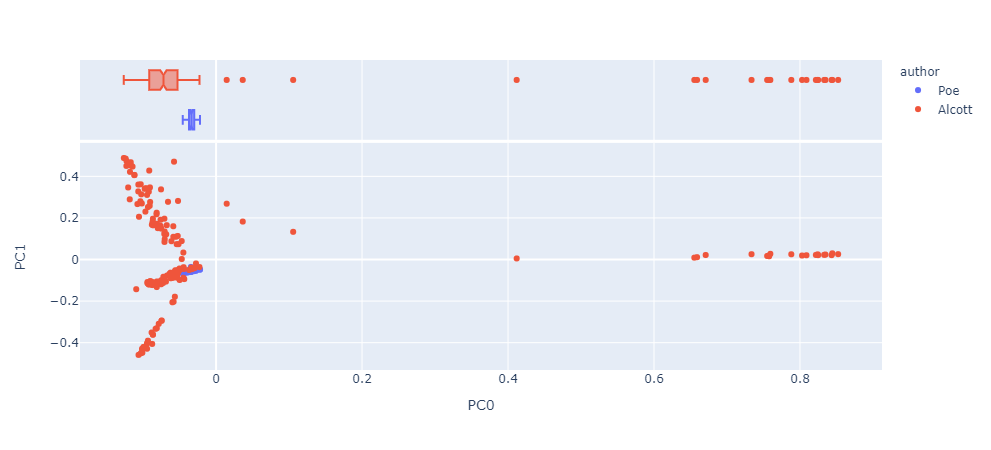

In [219]:
vis_pcs(DCM_sk, 0, 1)

In [222]:
# px.scatter_3d(DCM_sk, 'PC0', 'PC1','PC2', color='title', hover_name='doc', height=1000, width=1200)

## Show Loadings

In [223]:
LOADINGS_sk = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS_sk.columns = ["PC{}".format(i) for i in LOADINGS_sk.columns]

In [224]:
LOADINGS_sk.index = TFIDF.columns
LOADINGS_sk.index.name = 'term_id'
LOADINGS_sk['term_str'] = LOADINGS_sk.apply(lambda x: VOCAB.loc[int(x.name)].term_str, 1)

In [225]:
pc0_pos = LOADINGS_sk.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
pc0_neg = LOADINGS_sk.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
pc1_pos = LOADINGS_sk.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')
pc1_neg = LOADINGS_sk.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')

In [226]:
print('BOOKS PC0+', pc0_pos)
print('BOOKS PC0-', pc0_neg)
print('BOOKS PC1+', pc1_pos)
print('BOOKS PC1-', pc1_neg)

BOOKS PC0+ polly tom fanny maud fan shaw trix sydney grandma nt
BOOKS PC0- jo ben meg dan rose mac laurie beth phebe bab
BOOKS PC1+ jo meg laurie dan beth amy march nat bhaer demi
BOOKS PC1- ben bab celia thorny betty mac rose phebe sancho sanch


# SAVE

In [227]:
DCM.to_csv('PCA_DCM_chaps.csv')
COMPS.to_csv('PCA_TCM_chaps.csv')
DCM.to_csv('PCA_DCM_books.csv')
COMPS.to_csv('PCA_TCM_books.csv')

# Topic Models (LDA)


In [228]:
n_terms = 4000
n_topics = 30
# raf - do minimum of 20 
max_iter = 5
OHCO = ['book_id', 'chap_num', 'para_num']

## Imports

In [229]:
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation as LDA

In [230]:
%matplotlib inline

# Prepare Data

## Convert TOKENS to table of paragraphs

Scikit Learn wants an F1 style corpus. We create onefrom our annotated TOKEN table, keeping only regular nouns.

In [231]:
TOKENS = pd.read_csv('TOKEN2.csv')

In [232]:
TOKENS.head()

,book_id,chap_num,para_num,sent_num,token_num,pos_tuple,pos,token_str,term_str,term_id
0,2787,1,1,0,1,"('IT', 'NNP')",NNP,IT,it,14145
1,2787,1,1,0,2,"(""'S"", 'POS')",POS,'S,s,22463
2,2787,1,1,0,3,"('time', 'NN')",NN,time,time,26439
3,2787,1,1,0,4,"('to', 'TO')",TO,to,to,26510
4,2787,1,1,0,5,"('go', 'VB')",VB,go,go,11429


In [233]:
PARAS = TOKENS[TOKENS.pos.str.match(r'^NNS?$')]\
    .groupby(OHCO).term_str\
    .apply(lambda x: ' '.join(x))\
    .to_frame()\
    .rename(columns={'term_str':'para_str'})

In [234]:
PARAS.head()

para_str
book_id chap_num para_num                                                   
1       1        1         accounts city state excitement phenomena natur...
                 2         day date crowd people purposes square city day...
                 3         origin bulk masses area space queer substance ...
                 4         meantime city object curiosity cause smoke min...
                 5         balloon doubt feet earth crowd view person occ...

## Create Vector Space

We use Scikit Learn's CountVectorizer to convert our F1 corpus of paragraphs into a document-term vector space of word counts.

In [235]:
tfv = CountVectorizer(max_features=n_terms, stop_words='english')
tf = tfv.fit_transform(PARAS.para_str)
TERMS = tfv.get_feature_names()

# Generate Model

We run Scikit Learn's [LatentDirichletAllocation algorithm](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html#sklearn.decomposition.LatentDirichletAllocation) and extract the THETA and PHI tables.

In [236]:
lda = LDA(n_components=n_topics, max_iter=max_iter, learning_offset=50., random_state=0)

## THETA

In [237]:
THETA = pd.DataFrame(lda.fit_transform(tf), index=PARAS.index)
THETA.columns.name = 'topic_id'

In [238]:
THETA.sample(20).style.background_gradient()

## PHI

In [239]:
PHI = pd.DataFrame(lda.components_, columns=TERMS)
PHI.index.name = 'topic_id'
PHI.columns.name  = 'term_str'

In [240]:
PHI.T.head().style.background_gradient()

topic_id,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29
term_str,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
aback,1.033333,0.033333,0.251742,0.033333,0.033333,0.033333,0.814925,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,4.033333,1.033333,2.033333,0.033333,0.033333,0.033333,0.033333,0.033333,2.033333,0.033333,0.033333,0.033333
ability,2.033287,0.093171,4.890068,0.033333,0.033333,3.265507,0.033333,1.859361,0.033333,1.008706,0.033333,1.033333,0.354354,1.633178,0.033333,0.033334,0.033333,0.033333,0.033333,2.802126,0.104133,0.033333,0.033333,0.033333,0.033333,5.322708,0.033399,0.033334,0.033333,0.033333
absence,2.112087,9.632519,3.307857,0.033333,1.237051,6.487703,4.407342,0.639597,2.732606,5.765650,1.890409,0.033333,1.128253,0.033333,0.194323,0.424132,0.794770,0.033333,2.843909,0.039627,4.754014,0.446947,0.033333,0.033333,0.033333,2.324727,0.459613,0.620334,10.201389,3.321809
absent,1.033333,0.033333,1.512178,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.909590,2.008445,0.033333,0.579377,0.033333,0.033333,0.033333,1.157076,0.033333,4.033333
absorbed,0.033333,0.033333,0.033333,0.033333,2.026674,0.033333,0.033333,0.033333,0.033333,0.033333,0.033333,0.767203,0.033333,0.033333,0.033333,1.211021,0.033333,0.033333,0.033333,0.033333,0.033333,2.034619,0.033333,1.033333,0.033333,0.033333,0.033333,0.033333,0.033333,1.127149


# Inspect Results

## Get Top Terms per Topic

In [241]:
TOPICS = PHI.stack().to_frame().rename(columns={0:'weight'})\
    .groupby('topic_id')\
    .apply(lambda x: 
           x.weight.sort_values(ascending=False)\
               .head(10)\
               .reset_index()\
               .drop('topic_id',1)\
               .term_str)

In [242]:
TOPICS

term_str,0,1,2,3,4,5,6,7,8,9
topic_id,,,,,,,,,,
0,chance,idea,corner,dog,thing,things,face,smile,eye,fun
1,life,word,mind,letter,letters,flowers,boy,friends,face,things
2,uncle,time,piece,manner,hand,board,fact,length,box,thing
3,arm,breath,course,window,round,home,head,eyes,queer,face
4,eyes,face,hand,look,heart,hands,voice,words,tender,kind
5,eyes,question,man,head,happiness,life,sake,face,cause,love
6,way,heart,life,music,time,pleasure,sort,world,day,father
7,head,laughter,face,thing,boys,work,places,effect,girls,steps
8,man,tone,fellow,head,book,words,minute,business,eye,look


In [243]:
TOPICS['label'] = TOPICS.apply(lambda x: str(x.name) + ' ' + ' '.join(x), 1)

## Sort Topics by Doc Weight

In [244]:
TOPICS['doc_weight_sum'] = THETA.sum()

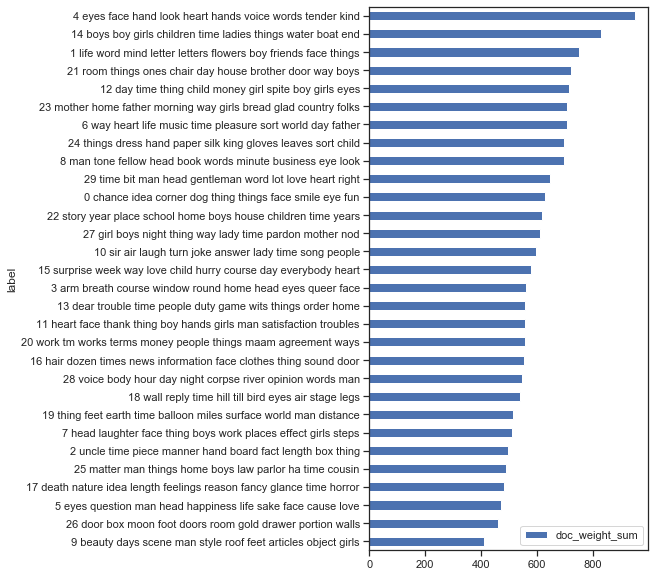

In [245]:
TOPICS.sort_values('doc_weight_sum', ascending=True).plot.barh(y='doc_weight_sum', x='label', figsize=(5,10)) 

## Explore Topics by Author

In [246]:
LIB = pd.read_csv('LIB3.csv').set_index('book_id')

In [247]:
topic_cols = [t for t in range(n_topics)]
AUTHORS = THETA.join(LIB, on='book_id')\
    .reset_index().set_index(['author']+OHCO)\
    .groupby('author')[topic_cols].mean()\
    .T                                            
AUTHORS.index.name = 'topic_id'

In [248]:
AUTHORS['topterms'] = TOPICS[[i for i in range(10)]].apply(lambda x: ' '.join(x), 1)

In [249]:
AUTHORS.sort_values('Alcott', ascending=False).style.background_gradient()

author,Alcott,Poe,topterms
topic_id,,,
4,0.058236,0.026527,eyes face hand look heart hands voice words tender kind
14,0.051595,0.019103,boys boy girls children time ladies things water boat end
21,0.044982,0.016925,room things ones chair day house brother door way boys
1,0.044380,0.027477,life word mind letter letters flowers boy friends face things
23,0.043846,0.017903,mother home father morning way girls bread glad country folks
12,0.043372,0.021972,day time thing child money girl spite boy girls eyes
6,0.042088,0.025352,way heart life music time pleasure sort world day father
24,0.041513,0.024015,things dress hand paper silk king gloves leaves sort child
0,0.037182,0.023251,chance idea corner dog thing things face smile eye fun


In [251]:
AUTHORS.sort_values('Poe', ascending=False).style.background_gradient()

author,Alcott,Poe,topterms
topic_id,,,
28,0.020691,0.071338,voice body hour day night corpse river opinion words man
2,0.018633,0.065651,uncle time piece manner hand board fact length box thing
17,0.018551,0.061727,death nature idea length feelings reason fancy glance time horror
5,0.019059,0.056162,eyes question man head happiness life sake face cause love
19,0.021997,0.056067,thing feet earth time balloon miles surface world man distance
8,0.036012,0.048340,man tone fellow head book words minute business eye look
9,0.017287,0.046684,beauty days scene man style roof feet articles object girls
26,0.021389,0.042705,door box moon foot doors room gold drawer portion walls
25,0.023863,0.040609,matter man things home boys law parlor ha time cousin


In [252]:
import plotly_express as px

In [253]:
# px.scatter(AUTHORS.reset_index(), 'Alcott', 'melville', hover_name='topterms', text='topic_id')\
#     .update_traces(mode='text')

# Clutser Topics

In [254]:
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist
from sklearn.cluster import AgglomerativeClustering
from sklearn.preprocessing import normalize
import matplotlib.pyplot as plt

In [255]:
def plot_tree(tree, labels):
    plt.figure()
    fig, axes = plt.subplots(figsize=(5, 10))
    dendrogram = sch.dendrogram(tree, labels=labels, orientation="left")
    plt.tick_params(axis='both', which='major', labelsize=14)

In [256]:
SIMS = pdist(normalize(PHI), metric='euclidean')
TREE = sch.linkage(SIMS, method='ward')

In [257]:
labels  = ["{}: {}".format(a,b) for a, b in zip(AUTHORS.index,  AUTHORS.topterms.tolist())]

<Figure size 432x288 with 0 Axes>

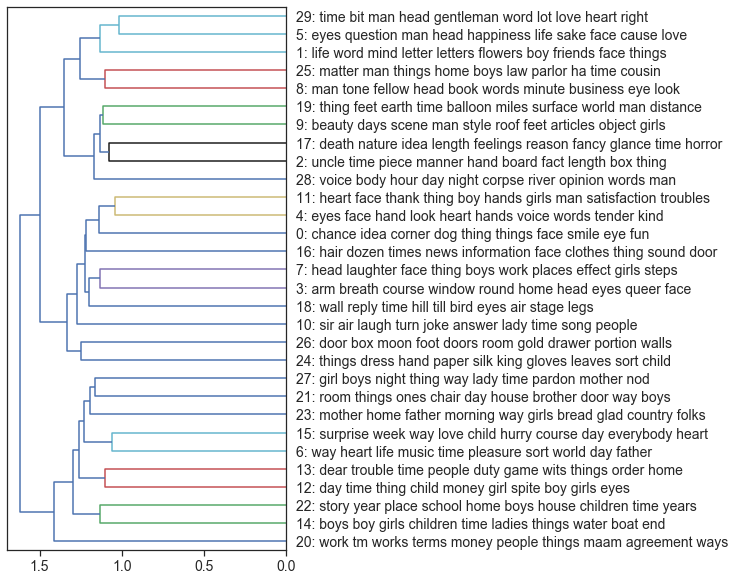

In [258]:
plot_tree(TREE, labels)

# LDA Viz

In [259]:
import pyLDAvis
import pyLDAvis.sklearn
pyLDAvis.enable_notebook()

In [261]:
pyLDAvis.sklearn.prepare(lda, tf, tfv)

PreparedData(topic_coordinates=              x         y  topics  cluster      Freq
topic                                               
4      0.055277 -0.025554       1        1  5.066647
6      0.077687 -0.087160       2        1  4.272000
28    -0.158026 -0.026497       3        1  4.078618
14     0.132269  0.071415       4        1  3.961017
17    -0.155995 -0.028904       5        1  3.838922
12     0.104851 -0.041427       6        1  3.835141
2     -0.163517  0.011929       7        1  3.835006
21     0.116758  0.033986       8        1  3.764543
29     0.039110 -0.125415       9        1  3.732413
19    -0.115011  0.010052      10        1  3.600946
1      0.089463 -0.101513      11        1  3.520710
24     0.099636  0.156502      12        1  3.505319
5     -0.128994 -0.072309      13        1  3.448617
26    -0.149724  0.152819      14        1  3.329010
20     0.005021 -0.182030      15        1  3.200353
11     0.041207 -0.024105      16        1  3.167181
8     -0.059759 -0.018380      17        1  3.141014
23     0.115628  0.009166      18        1  3.122586
9     -0.142168  0.000178      19        1  3.089391
27     0.083885 -0.016527      20        1  3.087471
18    -0.022798  0.107886      21        1  2.977301
22     0.040190  0.044622      22        1  2.914220
3      0.023950  0.084419      23        1  2.872600
7      0.027493  0.050660      24        1  2.743084
0      0.029081  0.083105      25        1  2.735823
15     0.040136 -0.080130      26        1  2.714709
25    -0.057678 -0.047686      27        1  2.661187
10     0.018295  0.006041      28        1  2.631148
13    -0.017463 -0.002263      29        1  2.621478
16     0.031193  0.057119      30        1  2.531547, topic_info=        Term         Freq        Total Category  logprob  loglift
3963    work   632.000000   632.000000  Default  30.0000  30.0000
2232  mother   704.000000   704.000000  Default  29.0000  29.0000
1497    girl   623.000000   623.000000  Default  28.0000  28.0000
3000    room   740.000000   740.000000  Default  27.0000  27.0000
1259    face  1105.000000  1105.000000  Default  26.0000  26.0000
...      ...          ...          ...      ...      ...      ...
65       air    21.537879   568.287106  Topic30  -5.2479   0.4035
1707   house    21.168858   577.795968  Topic30  -5.2652   0.3697
1497    girl    21.263313   623.530930  Topic30  -5.2607   0.2979
2530  people    20.577387   604.288486  Topic30  -5.2935   0.2965
389     boys    20.798688   895.413467  Topic30  -5.2828  -0.0861

[1949 rows x 6 columns], token_table=      Topic      Freq       Term
term                            
5         2  0.137626  absurdity
5         7  0.068813  absurdity
5        10  0.068813  absurdity
5        24  0.068813  absurdity
5        27  0.550504  absurdity
...     ...       ...        ...
3995     16  0.399104  yesterday
3995     17  0.053214  yesterday
3995     21  0.133035  yesterday
3995     26  0.053214  yesterday
3995     30  0.026607  yesterday

[12041 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 7, 29, 15, 18, 13, 3, 22, 30, 20, 2, 25, 6, 27, 21, 12, 9, 24, 10, 28, 19, 23, 4, 8, 1, 16, 26, 11, 14, 17])

# Word Embeddings (word2vec)


In [262]:
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
BAG = OHCO[:4] # Paragraphs
# BAG = OHCO[:5] # Sentences
window = 5

## Imports

In [263]:
from gensim.models import word2vec
from sklearn.manifold import TSNE
import plotly_express as px

C:\ProgramData\Anaconda3\lib\site-packages\gensim\corpora\dictionary.py:11: DeprecationWarning:

Using or importing the ABCs from 'collections' instead of from 'collections.abc' is deprecated, and in 3.8 it will stop working

C:\ProgramData\Anaconda3\lib\site-packages\scipy\sparse\sparsetools.py:21: DeprecationWarning:

`scipy.sparse.sparsetools` is deprecated!
scipy.sparse.sparsetools is a private module for scipy.sparse, and should not be used.



In [264]:
%matplotlib inline

# Process

## Import TOKENS and convert to a corpus for Gensim

We import data from the TOKEN table of the novels corpus, excluding proper nouns.

In [265]:
TOKENS = pd.read_csv('TOKEN2.csv').set_index(OHCO)

In [266]:
corpus = TOKENS[~TOKENS.pos.str.match('NNPS?')]\
    .groupby(BAG)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [267]:
corpus

[['the'],
 ['late',
  'accounts',
  'from',
  'that',
  'city',
  'seems',
  'to',
  'be',
  'in',
  'a',
  'high',
  'state',
  'of',
  'philosophical',
  'excitement'],
 ['indeed',
  'phenomena',
  'have',
  'there',
  'occurred',
  'of',
  'a',
  'nature',
  'so',
  'completely',
  'unexpected',
  'so',
  'entirely',
  'novel',
  'so',
  'utterly',
  'at',
  'variance',
  'with',
  'preconceived',
  'opinions',
  'as',
  'to',
  'leave',
  'no',
  'doubt',
  'on',
  'my',
  'mind',
  'that',
  'long',
  'ere',
  'this',
  'all',
  'is',
  'in',
  'an',
  'uproar',
  'all',
  'physics',
  'in',
  'a',
  'ferment',
  'all',
  'reason',
  'and',
  'astronomy',
  'together',
  'by',
  'the',
  'ears'],
 ['it',
  'appears',
  'that',
  'on',
  'the',
  'day',
  'of',
  'i',
  'am',
  'not',
  'positive',
  'about',
  'the',
  'date',
  'a',
  'vast',
  'crowd',
  'of',
  'people',
  'for',
  'purposes',
  'not',
  'specifically',
  'mentioned',
  'were',
  'assembled',
  'in',
  'the',
 

## Generate word embeddings with Gensim's library

In [268]:
model = word2vec.Word2Vec(corpus, size=246, window=window, min_count=200, workers=4)

## Visualize with tSNE

### Generate coordinates to plot

In [269]:
coords = pd.DataFrame(index=range(len(model.wv.vocab)))
coords['label'] = [w for w in model.wv.vocab]
coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))

In [270]:
coords.head()

,label,vector
0,the,"[0.22036165, 0.26431423, -0.2840596, 0.0789844..."
1,late,"[-0.091123305, -0.119603, -0.14193687, -0.0994..."
2,from,"[-0.38256493, -0.25111318, 0.5238992, 0.039146..."
3,that,"[-0.15131615, 0.36850616, -0.21218912, 0.04042..."
4,to,"[-0.3417644, 0.112480424, 0.8044965, -0.105765..."


### Use ScikitLearn's TSNE library

In [271]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=23)
tsne_values = tsne_model.fit_transform(coords['vector'].tolist())

In [272]:
coords['x'] = tsne_values[:,0]
coords['y'] = tsne_values[:,1]

In [273]:
coords.head()

,label,vector,x,y
0,the,"[0.22036165, 0.26431423, -0.2840596, 0.0789844...",9.654496,3.837436
1,late,"[-0.091123305, -0.119603, -0.14193687, -0.0994...",-0.693029,5.529316
2,from,"[-0.38256493, -0.25111318, 0.5238992, 0.039146...",12.801660,2.025463
3,that,"[-0.15131615, 0.36850616, -0.21218912, 0.04042...",-3.497712,2.166096
4,to,"[-0.3417644, 0.112480424, 0.8044965, -0.105765...",-7.868403,-0.119167


### Plot the coordinates

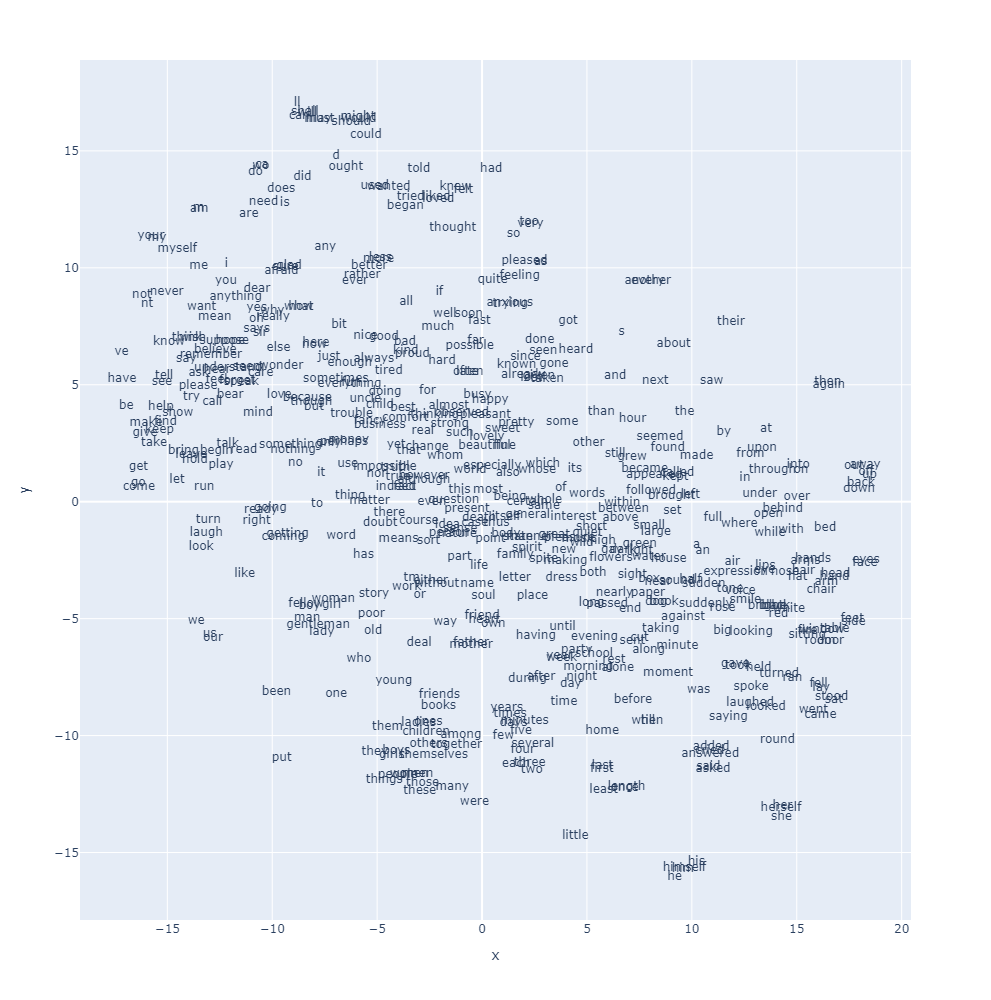

In [274]:
px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

# Semantic Algebra

## Analogy

$A : B :: C : D? \rightarrow B - A + C = D$


In [275]:
def complete_analogy(A, B, C, n=2):
    try:
        return model.wv.most_similar(positive=[B, C], negative=[A])[0:n]
    except KeyError as e:
        print('Error:', e)
        return None

In [276]:
complete_analogy('i', 'we', 'you')

[('us', 0.7015376687049866), ('our', 0.558246910572052)]

In [277]:
complete_analogy('man', 'woman', 'he')

[('she', 0.7519389390945435), ('feeling', 0.4981950521469116)]

In [278]:
complete_analogy('man','boy','woman')

[('girl', 0.8022274374961853), ('child', 0.7688707113265991)]

# Sentiment Analysis


In [279]:
# set up 
#data_dir = 'data/'

novels_csv = 'TOKEN2.csv'
vocab_csv = 'VOCAB2.csv'
lib_csv = 'LIB3.csv'
bow_csv = 'BOW.csv'

# For TOKENS
OHCO = ['book_id', 'chap_num', 'para_num', 'sent_num', 'token_num']
BOOKS = OHCO[:1]
CHAPS = OHCO[:2]
PARAS = OHCO[:3]
SENTS = OHCO[:4]

salex_csv = 'salex_nrc.csv'
emo_cols = "anger anticipation disgust fear joy sadness surprise trust polarity".split()

In [280]:
import pandas as pd
import numpy as np
import seaborn as sns
import plotly_express as px
from IPython.core.display import display, HTML

In [281]:
sns.set()
%matplotlib inline

## Acquire Data

In [282]:
TOKENS = pd.read_csv(novels_csv).set_index(OHCO)
VOCAB = pd.read_csv(vocab_csv).set_index('term_id')
LIB = pd.read_csv(lib_csv).set_index('book_id')
BOW = pd.read_csv(bow_csv)

# Add token_str to BOW
BOW['term_str'] = BOW.term_id.map(VOCAB.term_str)
BOW = BOW.set_index(['book_id','chap_num','term_id'])

In [283]:
BOW.sort_index()

n  c term_str
book_id chap_num term_id                 
1       1        5          1  1   005484
                 10         3  1        1
                 13         1  1     1000
                 16         1  1    10600
                 17         1  1     1080
...                       ... ..      ...
3795    24       29449      2  1   yellow
                 29473    104  1      you
                 29474      4  1    young
                 29475      2  1  younger
                 29478     15  1     your

[304741 rows x 3 columns]

In [284]:
LIB

,book_id.1,book_title,book_file,author,title
book_id,,,,,
2787,"An Old - fashioned Girl, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_AN_OLD-FASHIONED_GIRL...,2787,Alcott,An Old - fashioned Girl
2726,"Eight Cousins, by Louisa M. Alcott",epubs_\ALCOTT_MAY_LOUISA_EIGHT_COUSINS-pg2726.txt,2726,Alcott,Eight Cousins
2786,"Jack and Jill, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JACK_AND_JILL-pg2786.txt,2786,Alcott,Jack and Jill
3499,"Jo's Boys, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_JO’S_BOYS-pg3499.txt,3499,Alcott,Jo's Boys
2788,"Little Men, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_MEN-pg2788.txt,2788,Alcott,Little Men
514,"Little Women, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_LITTLE_WOMEN-pg514.txt,514,Alcott,Little Women
2804,"Rose in Bloom, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_ROSE_IN_BLOOM-pg2804.txt,2804,Alcott,Rose in Bloom
3795,"Under the Lilacs, by Louisa May Alcott",epubs_\ALCOTT_MAY_LOUISA_UNDER_THE_LILACS-pg37...,3795,Alcott,Under the Lilacs
1,The Works of Edgar Allan Poe Volume 1 (of 5) o...,epubs/2147-0.txt,1,Poe,The Works of Edgar Allan Poe Volume 1 (of 5) o...


In [285]:
# book name and id 
old = 2787
eight = 2726
jackjill = 2786
jo = 3499
littleM = 2788
littleW = 514
rose = 2804
under = 3795
poe1 = 1
poe2 = 2
poe3 = 3
poe4 = 4
poe5 = 5

## Get SA Lexicon

In [286]:
salex_csv = 'salex_nrc.csv'

In [287]:
SALEX = pd.read_csv(salex_csv).set_index('term_str')
SALEX.columns = [col.replace('nrc_','') for col in SALEX.columns]
SALEX['polarity'] = SALEX.positive - SALEX.negative

In [288]:
SALEX

,anger,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_str,,,,,,,,,,,
abandon,0,0,0,1,0,1,0,1,0,0,-1
abandoned,1,0,0,1,0,1,0,1,0,0,-1
abandonment,1,0,0,1,0,1,0,1,1,0,-1
abduction,0,0,0,1,0,1,0,1,1,0,-1
aberration,0,0,1,0,0,1,0,0,0,0,-1
...,...,...,...,...,...,...,...,...,...,...,...
young,0,1,0,0,1,0,1,0,1,0,1
youth,1,1,0,1,1,0,1,0,1,0,1
zeal,0,1,0,0,1,0,1,0,1,1,1


# Compute Sentiment

## Combine SALEX with VOCAB

In [289]:
VOCAB.head()

,term_rank,term_str,n,num,stop,stem_porter,pos_max,term_rank2,p,zipf_k,zipf_k2,zipf_k3,p2,h,df,idf,tfidf_sum,h2,x_factor2
term_id,,,,,,,,,,,,,,,,,,,
26151,1,the,58042,0,1,the,DT,1,1.963798,58042,58042,1.963798,0.052274,0.222570,247,0.001755,0.022318,7.652003,0.000000
1110,2,and,41247,0,1,and,CC,2,1.395554,82494,82494,2.791108,0.037148,0.176474,247,0.001755,0.016572,7.820398,5.420687
17817,3,of,29442,0,1,of,IN,3,0.996143,88326,88326,2.988429,0.026516,0.138865,247,0.001755,0.011051,7.532582,8.275387
26510,4,to,28593,0,1,to,TO,4,0.967418,114372,114372,3.869671,0.025752,0.135947,247,0.001755,0.011093,7.777130,10.781392
219,5,a,26310,0,1,a,DT,5,0.890175,131550,131550,4.450873,0.023695,0.127937,247,0.001755,0.010247,7.782000,12.524645


In [290]:
len(VOCAB)

29556

In [291]:
V = pd.concat([VOCAB.reset_index().set_index('term_str'), SALEX], join='inner', axis=1)\
    .reset_index().set_index('term_id')

In [292]:
V.head()

,term_str,term_rank,n,num,stop,stem_porter,pos_max,term_rank2,p,zipf_k,...,anticipation,disgust,fear,joy,negative,positive,sadness,surprise,trust,polarity
term_id,,,,,,,,,,,,,,,,,,,,,
11482,good,69,2193,0,0,good,JJ,68,0.074198,151317,...,1,0,0,1,0,1,0,1,1,1
10624,found,142,975,0,0,found,VBD,139,0.032988,138450,...,0,0,0,1,0,1,0,0,1,1
16868,mother,144,963,0,0,mother,NN,141,0.032582,138672,...,1,0,0,1,1,1,1,0,1,0
29474,young,151,917,0,0,young,JJ,147,0.031026,138467,...,1,0,0,1,0,1,0,1,0,1
3230,boy,167,828,0,0,boy,NN,162,0.028015,138276,...,0,1,0,0,1,0,0,0,0,-1


In [293]:
len(V)

2678

In [294]:
V.to_csv('Vocab_Sentiment.csv')

## Combine VOCAB with BOW

In [295]:
BOWIDX = BOW.index
B = BOW.merge(V, on='term_str', how='left')
B.index = BOWIDX
B = B.dropna()

# didnt have tf, tfidf columns
bcols = ['n_x', 'term_str', 'term_rank', 'n_y', 'num', 'pos_max', 'term_rank2', 'p', 
'tfidf_sum', 'anger', 'anticipation', 'disgust', 'fear', 'joy', 'negative', 'positive', 'sadness', 'surprise', 'trust', 'polarity']

B = B[bcols]

for col in emo_cols:
    B[col] = B[col] * B.tfidf_sum # used to be B.tfidf

In [296]:
B.head()

n_x    term_str  term_rank   n_y  num pos_max  \
book_id chap_num term_id                                                  
1       1        224        2   abandoned     4054.0  21.0  0.0     VBN   
                 295        2     absence     1545.0  65.0  0.0      NN   
                 336        1       abyss     4196.0  20.0  0.0      NN   
                 363        3    accident     1288.0  81.0  0.0      NN   
                 382        2  accomplish     5340.0  14.0  0.0      VB   

                          term_rank2         p  tfidf_sum    anger  \
book_id chap_num term_id                                             
1       1        224           585.0  0.000711   0.005090  0.00509   
                 295           541.0  0.002199   0.008545  0.00000   
                 336           586.0  0.000677   0.006253  0.00000   
                 363           525.0  0.002741   0.010454  0.00000   
                 382           592.0  0.000474   0.002949  0.00000   

                          anticipation  disgust      fear       joy  negative  \
book_id chap_num term_id                                                        
1       1        224               0.0      0.0  0.005090  0.000000       1.0   
                 295               0.0      0.0  0.008545  0.000000       1.0   
                 336               0.0      0.0  0.006253  0.000000       1.0   
                 363               0.0      0.0  0.010454  0.000000       1.0   
                 382               0.0      0.0  0.000000  0.002949       0.0   

                          positive   sadness  surprise  trust  polarity  
book_id chap_num term_id                                                 
1       1        224           0.0  0.005090  0.000000    0.0 -0.005090  
                 295           0.0  0.008545  0.000000    0.0 -0.008545  
                 336           0.0  0.006253  0.000000    0.0 -0.006253  
                 363           0.0  0.010454  0.010454    0.0 -0.010454  
                 382           1.0  0.000000  0.000000    0.0  0.002949

In [297]:
B.tfidf_sum

book_id  chap_num  term_id
1        1         224        0.005090
                   295        0.008545
                   336        0.006253
                   363        0.010454
                   382        0.002949
                                ...   
3795     24        28947      0.017297
                   29240      0.014370
                   29244      0.011817
                   29283      0.013311
                   29474      0.019783
Name: tfidf_sum, Length: 43398, dtype: float64

## Explore Emotion Words and POS

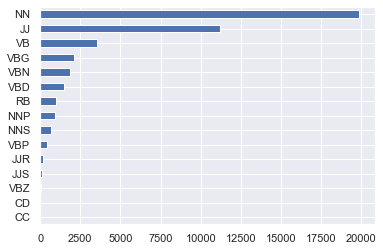

In [298]:
B.pos_max.value_counts().sort_values().plot.barh()

In [299]:
EMO_BOOKS = B.groupby(['book_id'])[emo_cols].mean()
EMO_CHAPS = B.groupby(['book_id','chap_num'])[emo_cols].mean()

In [300]:
EMO_BOOKS.index = LIB.book_title

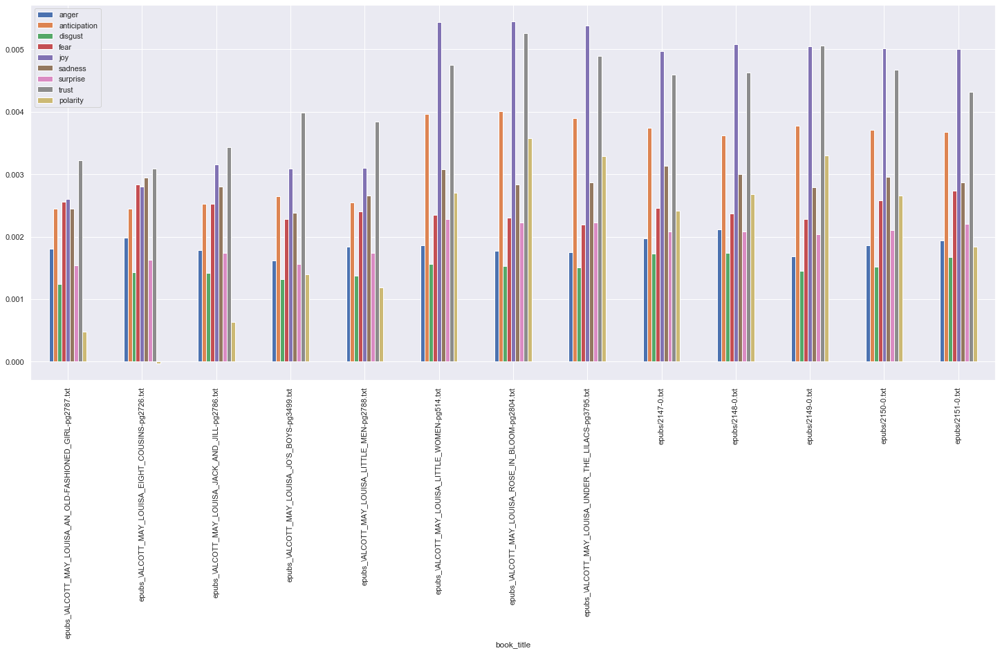

In [301]:
EMO_BOOKS.plot.bar(figsize=(25,10))

# Compare Texts

In [302]:
EIGHT = EMO_CHAPS.loc[eight].copy()
JACKJILL = EMO_CHAPS.loc[jackjill].copy()
OLD = EMO_CHAPS.loc[old].copy()
JO = EMO_CHAPS.loc[jo].copy()
LITTLEM = EMO_CHAPS.loc[littleM].copy()
LITTLEW = EMO_CHAPS.loc[littleW].copy()
ROSE = EMO_CHAPS.loc[rose].copy()
UNDER = EMO_CHAPS.loc[under].copy()
POE1 = EMO_CHAPS.loc[poe1].copy()
POE2 = EMO_CHAPS.loc[poe2].copy()
POE3 = EMO_CHAPS.loc[poe3].copy()
POE4 = EMO_CHAPS.loc[poe4].copy()
POE5 = EMO_CHAPS.loc[poe5].copy()

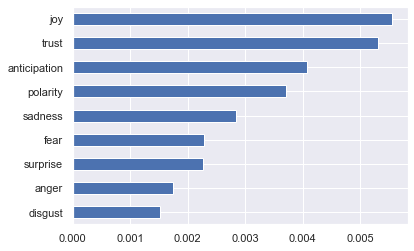

In [303]:
EIGHT.mean().sort_values().plot.barh();

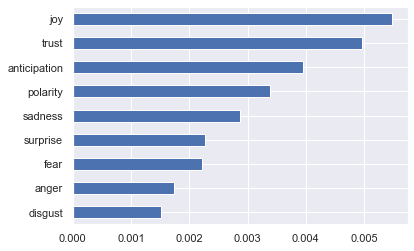

In [304]:
JACKJILL.mean().sort_values().plot.barh();

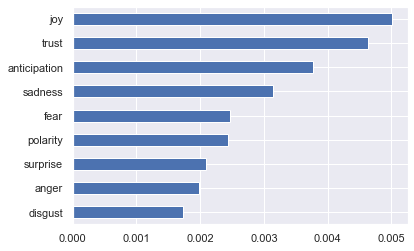

In [305]:
OLD.mean().sort_values().plot.barh();

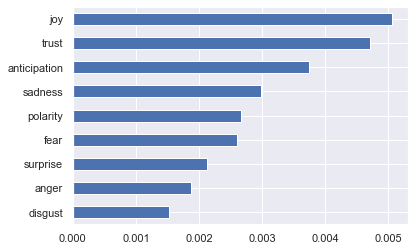

In [306]:
JO.mean().sort_values().plot.barh();

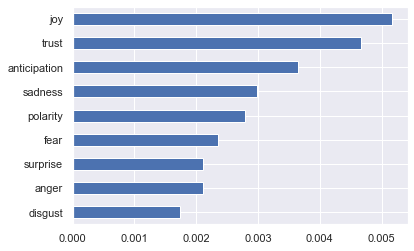

In [307]:
LITTLEM.mean().sort_values().plot.barh();

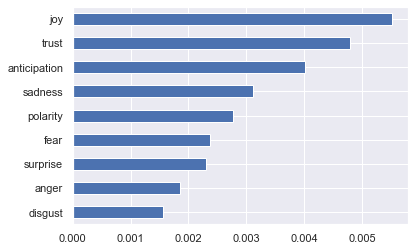

In [308]:
LITTLEW.mean().sort_values().plot.barh();

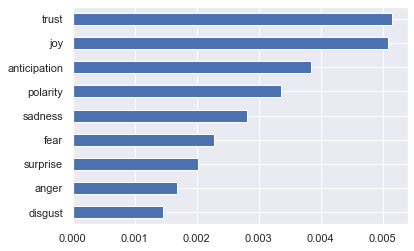

In [309]:
ROSE.mean().sort_values().plot.barh();

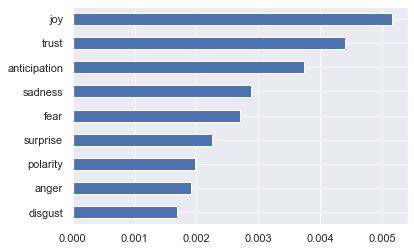

In [310]:
UNDER.mean().sort_values().plot.barh();

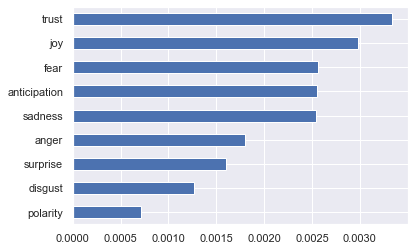

In [311]:
POE1.mean().sort_values().plot.barh();

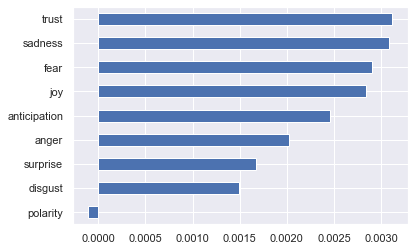

In [312]:
POE2.mean().sort_values().plot.barh();

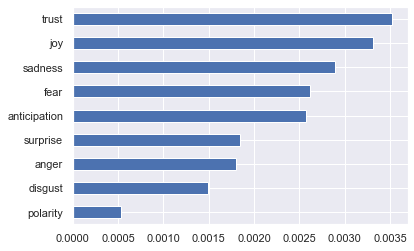

In [313]:
POE3.mean().sort_values().plot.barh();

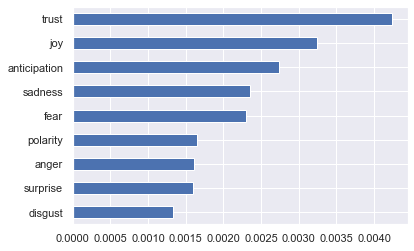

In [314]:
POE4.mean().sort_values().plot.barh();

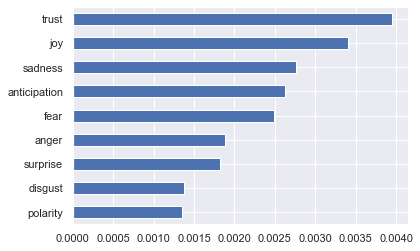

In [315]:
POE5.mean().sort_values().plot.barh();

## What is Trust?

In [316]:
trust_words = pd.Series(SALEX[SALEX['trust'] == 1].index.tolist())

In [317]:
trust_words.sample(10)

657           praise
395              god
467        indelible
475         innocent
402    grandchildren
227            crisp
363        formative
154           cogent
809        statement
419             hail
dtype: object

## Mean Sentiment by Chapter

In [318]:
EIGHT_chaps = EMO_CHAPS.loc[eight] 
JACKJILL_chaps = EMO_CHAPS.loc[jackjill] 
OLD_chaps = EMO_CHAPS.loc[old]
JO_chaps = EMO_CHAPS.loc[jo]
LITTLEM_chaps = EMO_CHAPS.loc[littleM]
LITTLEW_chaps = EMO_CHAPS.loc[littleW]
ROSE_chaps = EMO_CHAPS.loc[rose]
UNDER_chaps = EMO_CHAPS.loc[under]
POE1_chaps = EMO_CHAPS.loc[poe1]
POE2_chaps = EMO_CHAPS.loc[poe2]
POE3_chaps = EMO_CHAPS.loc[poe3]
POE4_chaps = EMO_CHAPS.loc[poe4]
POE5_chaps = EMO_CHAPS.loc[poe5]

In [319]:
EIGHT_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.002218,0.004540,0.001484,0.003062,0.006274,0.003834,0.002254,0.004984,0.003144
2,0.001857,0.004506,0.001574,0.002005,0.005895,0.002520,0.003465,0.004947,0.004326
3,0.001897,0.003304,0.001740,0.002407,0.004911,0.003439,0.001908,0.004843,0.002505
4,0.001169,0.004936,0.001146,0.002664,0.005836,0.003226,0.001989,0.005441,0.003755
5,0.001603,0.004802,0.001289,0.001786,0.006715,0.002772,0.003053,0.006427,0.004784
6,0.001410,0.003965,0.001530,0.002149,0.006129,0.002271,0.002076,0.005548,0.004771
7,0.001307,0.004421,0.001533,0.001956,0.006353,0.002553,0.002243,0.005287,0.005002
8,0.001903,0.004445,0.001755,0.002628,0.005297,0.003283,0.002914,0.005953,0.003931
9,0.001636,0.004147,0.001135,0.002048,0.005737,0.002030,0.002395,0.004421,0.004652


In [320]:
JACKJILL_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.001793,0.003098,0.001548,0.003142,0.004031,0.003306,0.001774,0.004641,0.001883
2,0.002136,0.004500,0.002011,0.003764,0.005664,0.004873,0.002492,0.005253,0.002350
3,0.001995,0.003372,0.001716,0.002380,0.004607,0.003098,0.002114,0.003975,0.001979
4,0.001551,0.005056,0.001528,0.002388,0.006800,0.003040,0.002172,0.004980,0.004206
5,0.001435,0.004892,0.001685,0.001621,0.006808,0.001647,0.002754,0.006024,0.005665
6,0.001556,0.004274,0.001887,0.001990,0.005831,0.003013,0.002687,0.004382,0.003402
7,0.002273,0.003367,0.001721,0.002673,0.004079,0.003289,0.001747,0.004715,0.001162
8,0.001661,0.003811,0.001556,0.002072,0.004923,0.002559,0.001561,0.003987,0.002300
9,0.001677,0.003164,0.001471,0.002239,0.004627,0.002819,0.002045,0.005261,0.003203


In [321]:
OLD_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.002019,0.004333,0.001820,0.002760,0.005201,0.003030,0.002605,0.004602,0.002061
2,0.002308,0.003560,0.001850,0.002333,0.004168,0.003346,0.002060,0.003974,0.001395
3,0.002285,0.003932,0.001803,0.002519,0.004768,0.003258,0.001873,0.005167,0.002094
4,0.002103,0.003894,0.001705,0.002674,0.005317,0.003370,0.002277,0.004908,0.002476
5,0.002975,0.003015,0.002636,0.002908,0.003972,0.003532,0.001871,0.004262,0.000745
6,0.001952,0.003586,0.001809,0.002469,0.004458,0.002916,0.002014,0.004083,0.001611
7,0.001587,0.003562,0.001582,0.002506,0.005612,0.003146,0.002041,0.004299,0.002788
8,0.001483,0.003932,0.001619,0.002230,0.005600,0.003119,0.002221,0.005099,0.003772
9,0.001931,0.003886,0.001728,0.002572,0.005390,0.004147,0.002012,0.005199,0.002765


In [322]:
JO_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
23,0.001711,0.003629,0.001553,0.002066,0.005673,0.002821,0.002080,0.005062,0.003484
24,0.001716,0.003998,0.001454,0.002393,0.006021,0.002311,0.002060,0.005355,0.004496
25,0.001746,0.003985,0.001358,0.002538,0.004789,0.002745,0.002161,0.004625,0.002666
26,0.001357,0.003812,0.001049,0.001938,0.005070,0.002381,0.002425,0.004762,0.003803
27,0.001966,0.003334,0.001484,0.002175,0.004628,0.002569,0.001737,0.004079,0.002096
28,0.001792,0.003518,0.001669,0.002832,0.004641,0.002907,0.001924,0.005304,0.002986
29,0.002356,0.003099,0.001745,0.003464,0.003780,0.003648,0.001964,0.004219,0.000951
30,0.001594,0.003945,0.001309,0.002142,0.005277,0.002834,0.002248,0.004574,0.003576
31,0.001755,0.003664,0.001267,0.002571,0.004950,0.002695,0.002318,0.004897,0.002940


In [323]:
LITTLEM_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
22,0.001785,0.003750,0.001787,0.002236,0.005582,0.002740,0.002084,0.005468,0.004154
23,0.002356,0.004103,0.002114,0.002144,0.006150,0.002857,0.002435,0.005605,0.004182
24,0.001761,0.004529,0.001863,0.001663,0.006232,0.002777,0.002075,0.006388,0.005421
25,0.002469,0.003776,0.001694,0.002690,0.005523,0.003226,0.001929,0.005328,0.003356
26,0.001614,0.003995,0.001388,0.001859,0.005453,0.002806,0.002331,0.003904,0.003043
27,0.002439,0.003094,0.001652,0.002928,0.003759,0.003048,0.001786,0.003501,0.000319
28,0.002013,0.003729,0.001581,0.001976,0.005615,0.003668,0.001817,0.004648,0.002764
29,0.002069,0.003301,0.001672,0.002546,0.005001,0.003122,0.002194,0.003922,0.002122
30,0.002039,0.003404,0.001828,0.002421,0.004544,0.002933,0.002504,0.004006,0.001399


In [324]:
LITTLEW_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.002052,0.004010,0.001842,0.002318,0.005238,0.003585,0.002448,0.004331,0.002100
2,0.001776,0.003493,0.001483,0.002046,0.005644,0.002693,0.002659,0.004547,0.003660
3,0.001800,0.004667,0.001469,0.002537,0.006348,0.003205,0.002148,0.004726,0.003391
4,0.001973,0.003821,0.001636,0.002361,0.004632,0.003131,0.002273,0.004230,0.002058
5,0.001650,0.004220,0.002032,0.002279,0.006232,0.002956,0.002502,0.005562,0.003870
6,0.000982,0.004549,0.001082,0.002181,0.007809,0.002587,0.002988,0.005677,0.005554
7,0.002452,0.003284,0.002122,0.002751,0.004118,0.004315,0.001663,0.003842,0.000161
8,0.002709,0.003708,0.001602,0.003192,0.004442,0.003729,0.002076,0.004001,0.000252
9,0.001779,0.004138,0.001609,0.002076,0.005712,0.002866,0.001917,0.004763,0.002859


In [325]:
ROSE_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
23,0.001609,0.003660,0.001236,0.002305,0.005043,0.002370,0.001954,0.004940,0.003559
24,0.001425,0.004351,0.001625,0.002022,0.005578,0.002525,0.002311,0.005487,0.004037
25,0.001402,0.003752,0.001074,0.002127,0.005203,0.002545,0.002153,0.005468,0.003955
26,0.001662,0.004195,0.001591,0.002177,0.005248,0.002305,0.001908,0.005493,0.003854
27,0.001895,0.003833,0.001689,0.002083,0.004454,0.002666,0.002131,0.005202,0.003150
28,0.002000,0.003267,0.001573,0.002402,0.004061,0.003286,0.001835,0.004129,0.001605
29,0.001352,0.003378,0.001359,0.001965,0.005141,0.002507,0.002147,0.004419,0.003433
30,0.001730,0.003685,0.001645,0.002391,0.004637,0.002935,0.001753,0.004979,0.003192
31,0.001780,0.003626,0.001460,0.002412,0.004425,0.003060,0.001865,0.004883,0.002682


In [326]:
UNDER_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.002549,0.003411,0.001843,0.002711,0.004791,0.003506,0.002684,0.003989,0.000824
2,0.001793,0.003777,0.001297,0.002110,0.004738,0.003673,0.002419,0.004055,0.001927
3,0.002085,0.003429,0.001932,0.002826,0.005213,0.003500,0.001680,0.004076,0.001397
4,0.002407,0.003201,0.001971,0.002944,0.005131,0.002912,0.002636,0.003701,0.000866
5,0.001834,0.003775,0.002256,0.002640,0.005407,0.003162,0.002346,0.005033,0.002706
6,0.001181,0.004377,0.001346,0.001833,0.006532,0.002028,0.002331,0.006214,0.005582
7,0.001725,0.004087,0.001815,0.002544,0.006032,0.002877,0.003189,0.004218,0.002466
8,0.001874,0.005514,0.001895,0.003013,0.007739,0.002827,0.002836,0.006139,0.003768
9,0.001541,0.004073,0.001475,0.002695,0.006097,0.002523,0.002821,0.004585,0.002720


In [327]:
POE1_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.001730,0.002349,0.001298,0.002443,0.002332,0.002380,0.001464,0.003069,0.000164
2,0.001763,0.002934,0.001305,0.002483,0.002925,0.002309,0.001873,0.003522,0.001008
3,0.001839,0.002918,0.001342,0.002634,0.003720,0.002219,0.001589,0.004329,0.001976
4,0.001839,0.002068,0.001201,0.002619,0.002164,0.002357,0.001524,0.003019,0.000168
5,0.001741,0.002245,0.001140,0.002318,0.002318,0.002366,0.001316,0.003051,0.000477
6,0.001590,0.003068,0.000820,0.002482,0.003149,0.002126,0.001517,0.003783,0.001812
7,0.002317,0.002207,0.001517,0.003564,0.002163,0.003376,0.001531,0.002662,-0.001412
8,0.001619,0.002624,0.001497,0.001964,0.005094,0.003226,0.001986,0.003229,0.001505


In [328]:
POE2_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.001388,0.002631,0.001088,0.002046,0.002484,0.002055,0.001552,0.003861,0.001597
2,0.002267,0.002486,0.001931,0.003169,0.003162,0.003161,0.001604,0.003646,-0.000070
3,0.002452,0.002592,0.001714,0.003675,0.002274,0.003192,0.001818,0.002919,-0.001598
4,0.001483,0.002492,0.001204,0.002095,0.002214,0.002108,0.001336,0.004870,0.002183
5,0.001629,0.002746,0.001210,0.002903,0.002999,0.002738,0.001808,0.003624,0.000699
6,0.001686,0.002896,0.001435,0.003017,0.002694,0.003077,0.002093,0.003693,0.000121
7,0.002642,0.002188,0.001949,0.003538,0.002438,0.003559,0.001455,0.002584,-0.001417
8,0.002090,0.002141,0.001416,0.002706,0.002540,0.003079,0.001729,0.002636,-0.000483
9,0.003100,0.001197,0.002210,0.003699,0.001192,0.004640,0.001920,0.001011,-0.003636


In [329]:
POE3_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.001852,0.002303,0.001319,0.002805,0.002827,0.003004,0.001415,0.002615,-0.000300
2,0.001975,0.002989,0.001447,0.003145,0.004757,0.004224,0.002329,0.003130,0.000001
3,0.001914,0.002547,0.001507,0.002801,0.002530,0.002885,0.001959,0.003094,-0.000297
4,0.001509,0.002628,0.001037,0.001854,0.003519,0.002299,0.001687,0.003985,0.002253
5,0.002038,0.002396,0.001962,0.002830,0.002509,0.002935,0.001661,0.003364,-0.000038
6,0.001547,0.002564,0.001689,0.002270,0.003754,0.001992,0.001989,0.004907,0.001555


In [330]:
POE4_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.002208,0.003418,0.001410,0.003039,0.003556,0.002442,0.001314,0.005215,0.002064
2,0.000865,0.003475,0.001212,0.002392,0.005598,0.002030,0.001609,0.007227,0.005574
3,0.001727,0.002297,0.002106,0.002446,0.002505,0.002571,0.001227,0.003849,-0.000156
4,0.001982,0.002217,0.001241,0.002844,0.002337,0.002499,0.001560,0.002583,-0.000344
5,0.001518,0.002305,0.001212,0.002454,0.003084,0.002566,0.001415,0.004010,0.001432
6,0.001330,0.002634,0.001068,0.001784,0.003284,0.002368,0.001607,0.004015,0.001981
7,0.001639,0.003248,0.001035,0.001972,0.003389,0.001986,0.001742,0.005709,0.003164
8,0.001819,0.002460,0.001420,0.002429,0.003257,0.002238,0.001543,0.004152,0.001907
9,0.001762,0.002941,0.001280,0.002121,0.003980,0.002283,0.002422,0.004358,0.003011


In [331]:
POE5_chaps.style.background_gradient(cmap='YlGn', high=.25)

,anger,anticipation,disgust,fear,joy,sadness,surprise,trust,polarity
chap_num,,,,,,,,,
1,0.001793,0.002454,0.001667,0.001775,0.003737,0.002615,0.001428,0.003914,0.002327
2,0.001835,0.003057,0.001478,0.002568,0.003499,0.002888,0.002000,0.004059,0.001609
3,0.001870,0.002206,0.001632,0.003402,0.002952,0.003448,0.001663,0.002932,-0.000437
4,0.001588,0.002672,0.001020,0.002272,0.003879,0.002332,0.002117,0.003444,0.001659
5,0.002313,0.002639,0.001337,0.003201,0.003107,0.002827,0.002053,0.002695,-0.000078
6,0.002083,0.002543,0.001783,0.002507,0.002525,0.002946,0.001216,0.003876,0.000195
7,0.001999,0.002211,0.001417,0.002223,0.002475,0.002614,0.001735,0.004142,0.001043
8,0.002384,0.003240,0.001089,0.002932,0.005959,0.003410,0.002626,0.005965,0.003344
9,0.001637,0.002653,0.001472,0.001957,0.002769,0.002323,0.001608,0.004346,0.002026


## Create Stacked Dataframes (for Plotly Express)

In [332]:
EIGHT_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(eight))
JACKJILL_chaps_thin= EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(jackjill))
OLD_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(old))
JO_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(jo))
LITTLEM_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(littleM))
LITTLEW_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(littleW))
ROSE_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(rose))
UNDER_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(under))
POE1_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(poe1))
POE2_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(poe2))
POE3_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(poe3))
POE4_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(poe4))
POE5_chaps_thin = EMO_CHAPS.stack().to_frame().reset_index().rename(columns={0:'value','level_2':'emo'}).query("book_id == {}".format(poe5))

In [333]:
def plot_sentiments(df, emo='polarity'):
    FIG = dict(figsize=(25, 5), legend=True, fontsize=14, rot=45)
    df[emo].plot(**FIG)

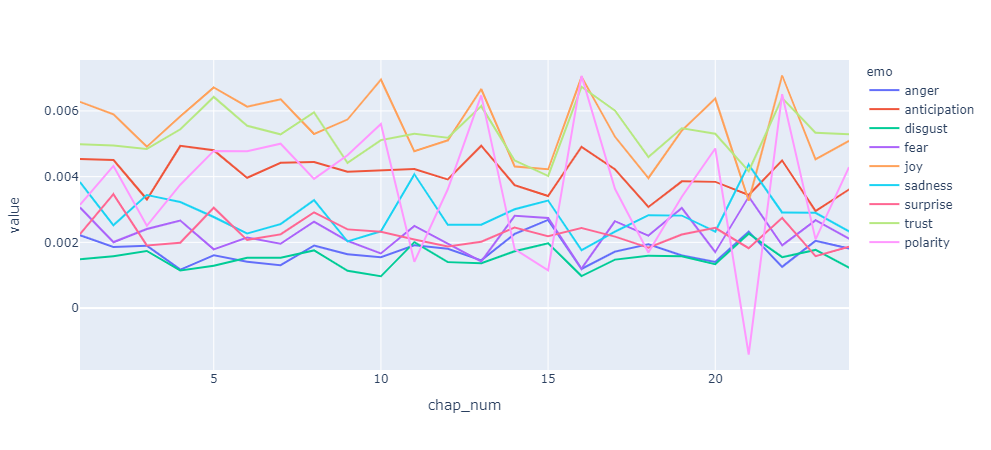

In [334]:
# plot_sentiments(PERSUASION_chaps, emo_cols)
px.line(EIGHT_chaps_thin, x='chap_num', y='value', color='emo')

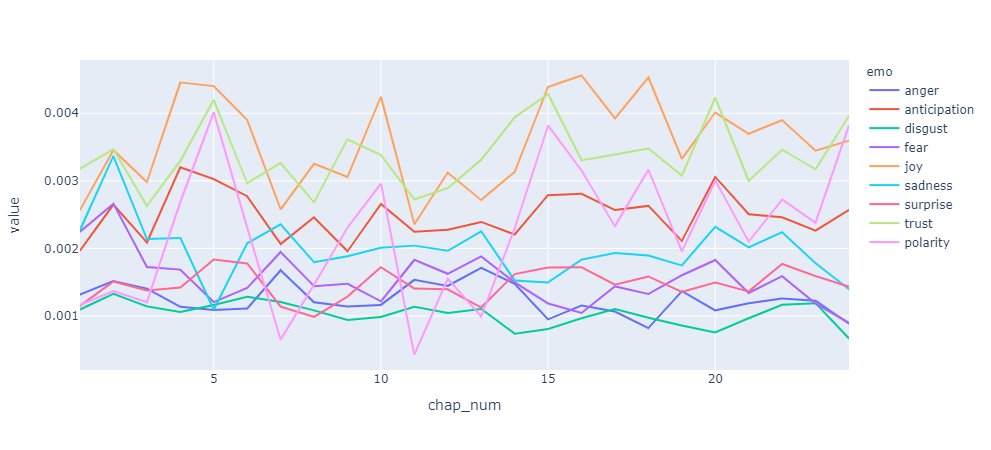

In [408]:
# plot_sentiments(MOBYDICK_chaps, emo_cols)
px.line(JACKJILL_chaps_thin, x='chap_num', y='value', color='emo')

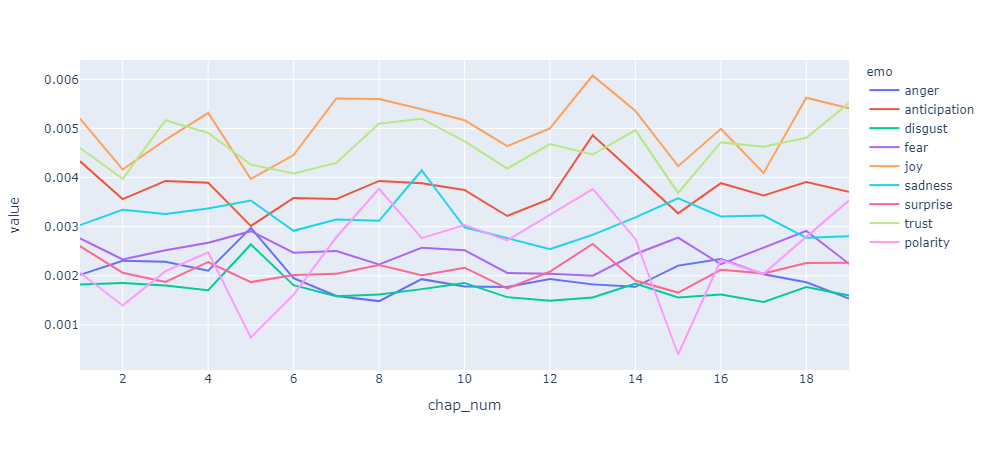

In [335]:
px.line(OLD_chaps_thin, x='chap_num', y='value', color='emo')

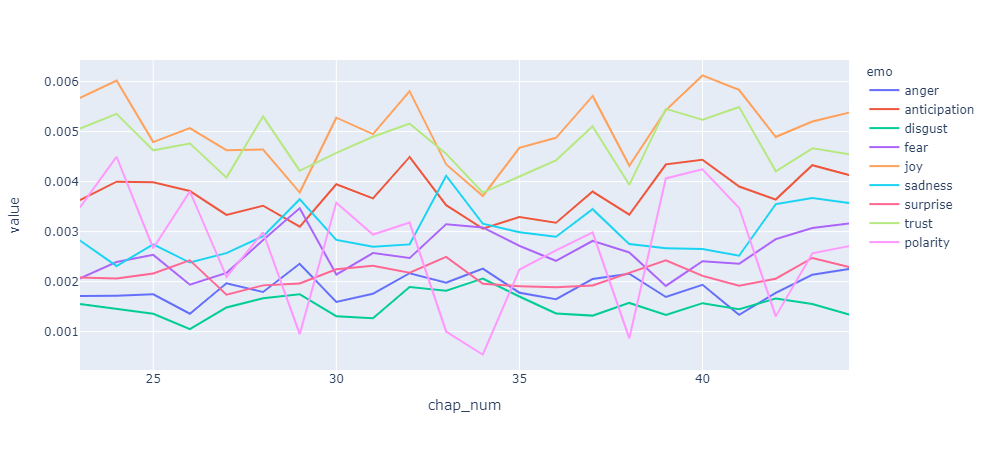

In [336]:
px.line(JO_chaps_thin, x='chap_num', y='value', color='emo')

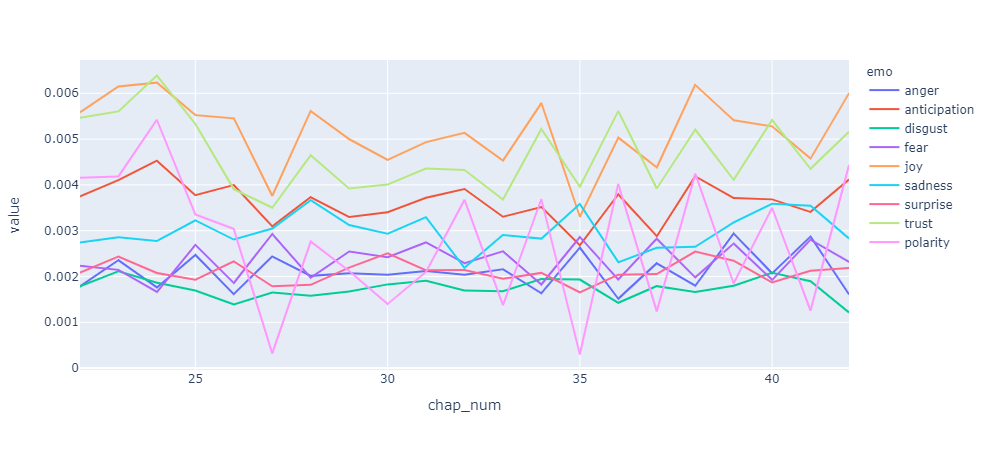

In [337]:
px.line(LITTLEM_chaps_thin, x='chap_num', y='value', color='emo')

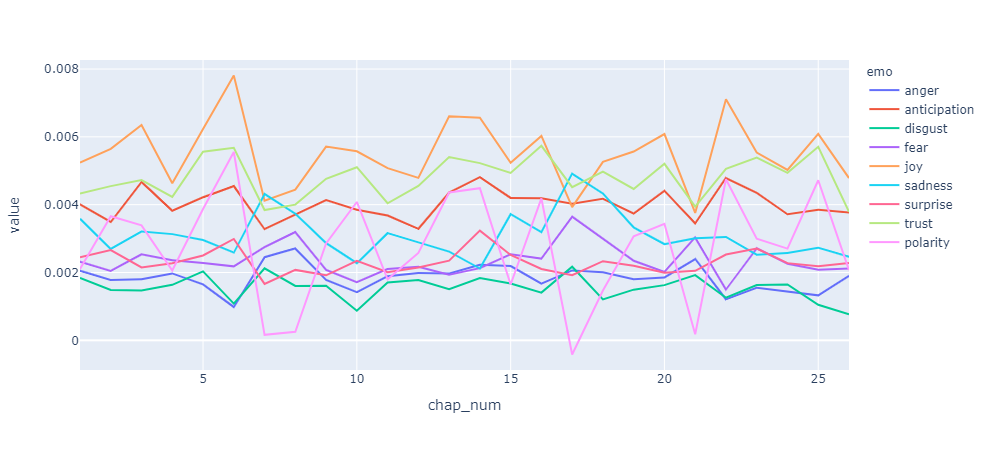

In [338]:
px.line(LITTLEW_chaps_thin, x='chap_num', y='value', color='emo')

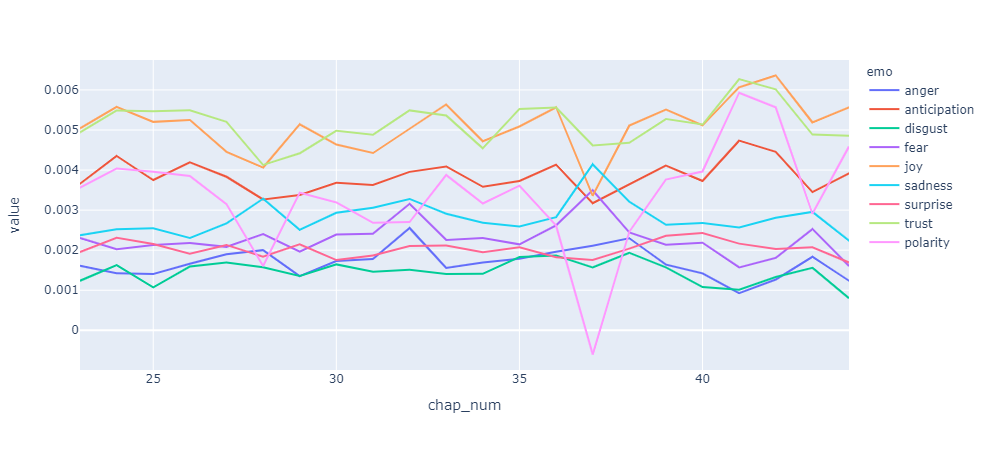

In [339]:
px.line(ROSE_chaps_thin, x='chap_num', y='value', color='emo')

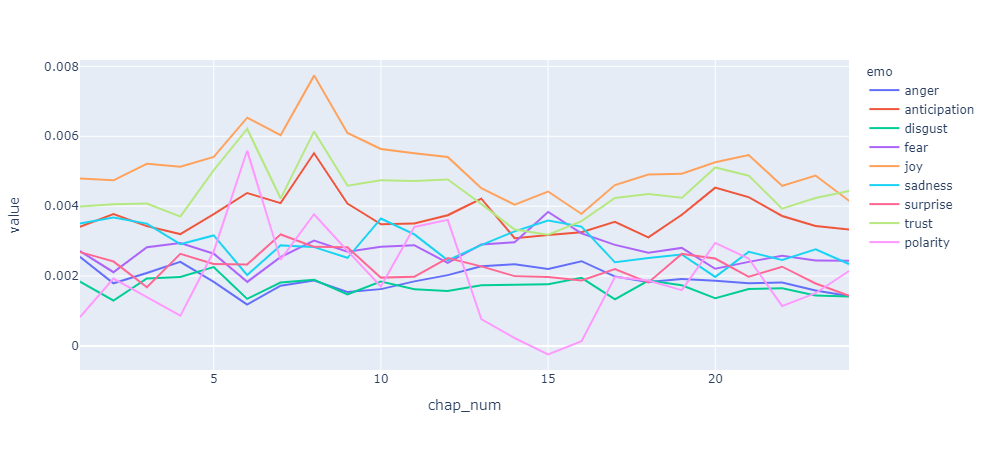

In [340]:
px.line(UNDER_chaps_thin, x='chap_num', y='value', color='emo')

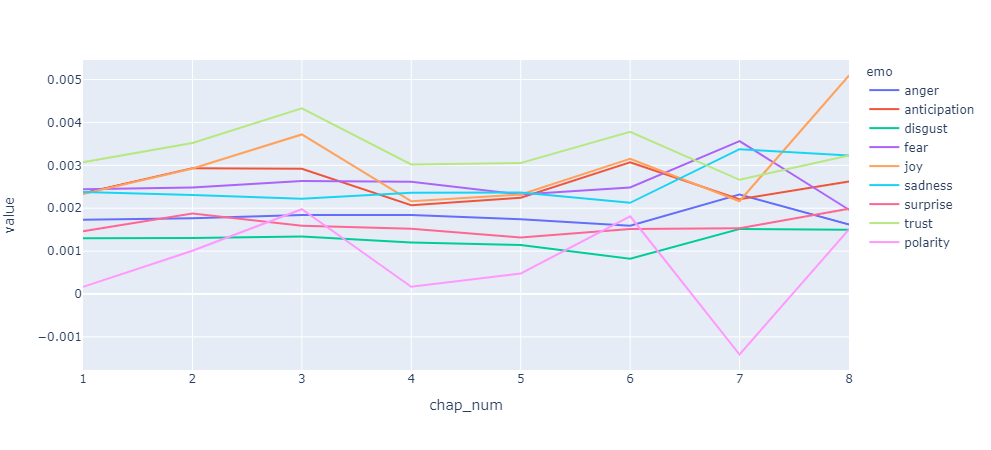

In [341]:
px.line(POE1_chaps_thin, x='chap_num', y='value', color='emo')

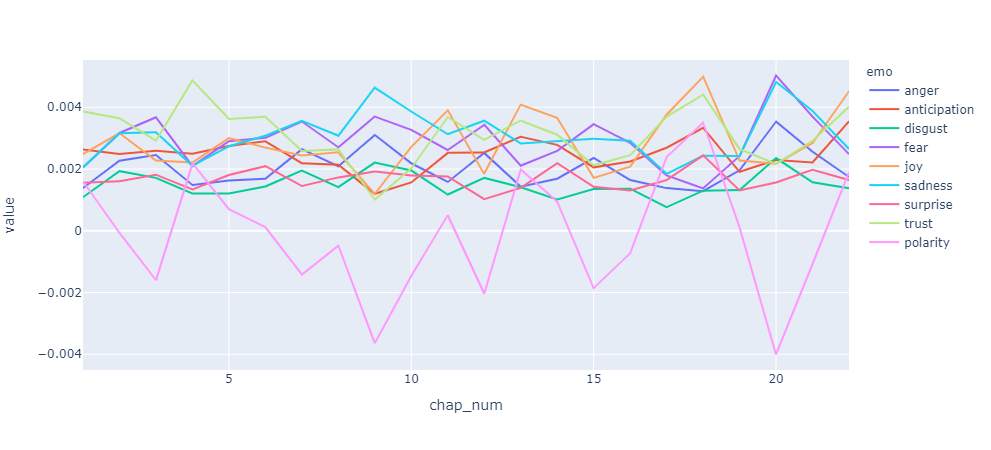

In [342]:
px.line(POE2_chaps_thin, x='chap_num', y='value', color='emo')

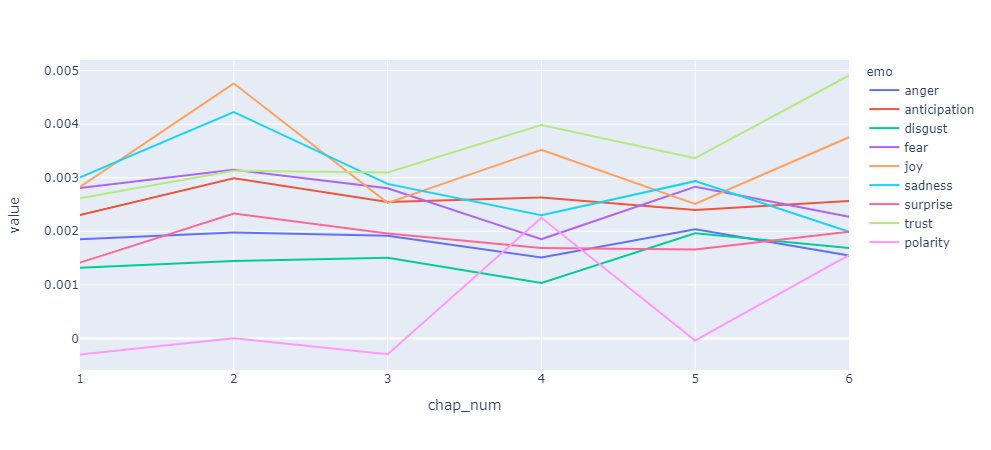

In [343]:
px.line(POE3_chaps_thin, x='chap_num', y='value', color='emo')

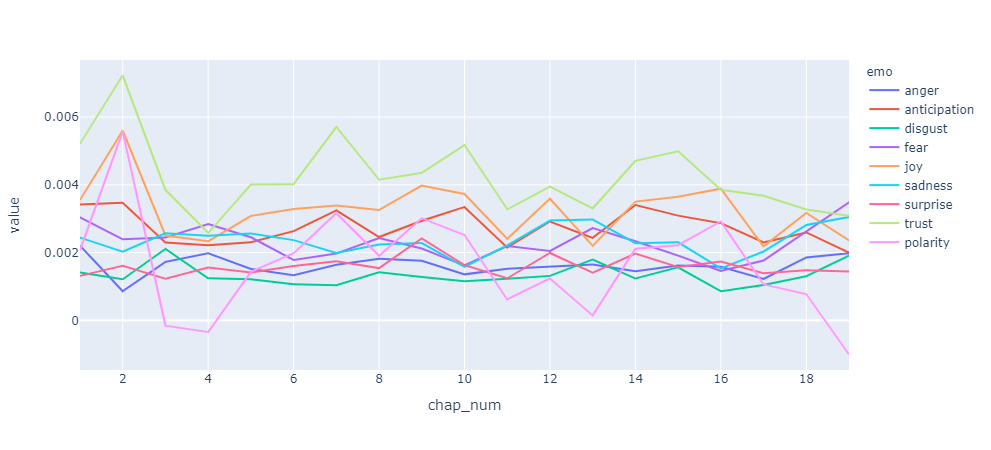

In [344]:
px.line(POE4_chaps_thin, x='chap_num', y='value', color='emo')

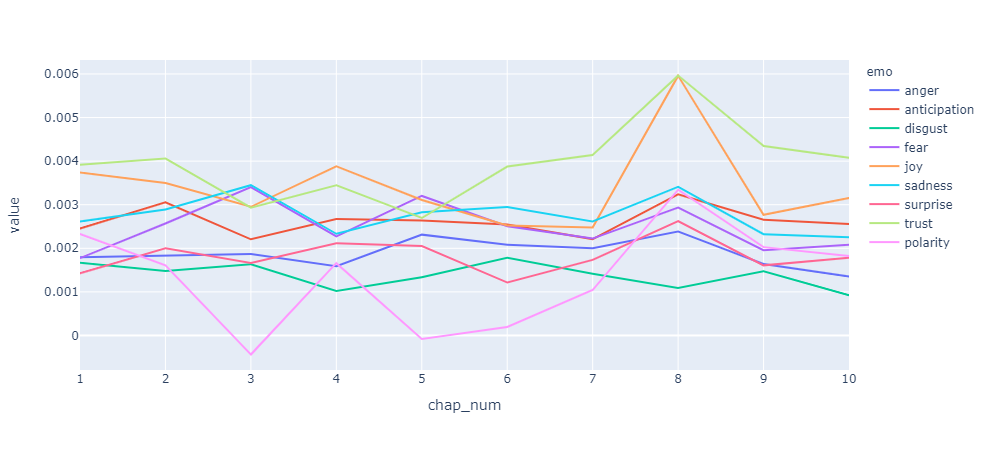

In [345]:
px.line(POE5_chaps_thin, x='chap_num', y='value', color='emo')

# Cose Read Sentiment in Texts

## Combine VOCAB + SALEX with TOKENS

We need to do this to reconstruct the sentences, which are lost in the BOW representation.

In [346]:
TOKENSIDX = TOKENS.index
T = TOKENS.merge(V, on='term_str', how='left')
T.index = TOKENSIDX
T = T.fillna(0)

In [347]:
EIGHT2 = T.loc[eight].copy()
JACKJILL2 = T.loc[jackjill].copy()
OLD2 = T.loc[old].copy()
JO2 = T.loc[jo].copy()
LITTLEM2 = T.loc[littleM].copy()
LITTLEW2 = T.loc[littleW].copy()
ROSE2 = T.loc[rose].copy()
UNDER2 = T.loc[under].copy()
POE12 = T.loc[poe1].copy()
POE22 = T.loc[poe2].copy() 
POE32 = T.loc[poe3].copy()
POE42 = T.loc[poe4].copy()
POE52 = T.loc[poe5].copy()

In [348]:
emo = 'polarity'

In [349]:
EIGHT2['html'] = EIGHT2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
JACKJILL2['html'] =  JACKJILL2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
OLD2['html'] =  OLD2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
JO2['html'] =  JO2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
LITTLEM2['html'] =  LITTLEM2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
LITTLEW2['html'] =  LITTLEW2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
ROSE2['html'] =  ROSE2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
UNDER2['html'] =  UNDER2.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
POE12['html'] =  POE12.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
POE22['html'] =  POE22.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
POE32['html'] =  POE32.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
POE42['html'] =  POE42.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)
POE52['html'] =  POE52.apply(lambda x: "<span class='sent{}'>{}</span>".format(int(np.sign(x[emo])), x.term_str), 1)

In [350]:
EIGHT2['html'].sample(10)

chap_num  para_num  sent_num  token_num
4         58        0         10             <span class='sent0'>declare</span>
21        20        1         15                 <span class='sent0'>and</span>
17        83        1         7                <span class='sent0'>tarts</span>
          62        3         10                  <span class='sent0'>to</span>
18        26        1         23                  <span class='sent0'>of</span>
7         77        2         25                   <span class='sent0'>a</span>
4         39        0         4                  <span class='sent0'>the</span>
2         2         1         2                <span class='sent0'>could</span>
24        96        3         8            <span class='sent0'>gutenberg</span>
9         93        0         9                  <span class='sent0'>who</span>
Name: html, dtype: object

In [351]:
EIGHT2

pos_tuple  pos token_str  \
chap_num para_num sent_num token_num                                     
1        0        0        0            ('Rose', 'NNP')  NNP      Rose   
                           1             ('sat', 'VBD')  VBD       sat   
                           2              ('all', 'DT')   DT       all   
                           3            ('alone', 'RB')   RB     alone   
                           4               ('in', 'IN')   IN        in   
...                                                 ...  ...       ...   
24       129      0        40              ('to', 'TO')   TO        to   
                           41            ('hear', 'VB')   VB      hear   
                           42           ('about', 'IN')   IN     about   
                           43             ('new', 'JJ')   JJ       new   
                           44         ('eBooks', 'NNS')  NNS    eBooks   

                                     term_str  term_id  term_rank    n  num  \
chap_num para_num sent_num token_num                                          
1        0        0        0             rose    22269        0.0  0.0  0.0   
                           1              sat    22651        0.0  0.0  0.0   
                           2              all      889        0.0  0.0  0.0   
                           3            alone      951        0.0  0.0  0.0   
                           4               in    13335        0.0  0.0  0.0   
...                                       ...      ...        ...  ...  ...   
24       129      0        40              to    26510        0.0  0.0  0.0   
                           41            hear    12264        0.0  0.0  0.0   
                           42           about      283        0.0  0.0  0.0   
                           43             new    17347        0.0  0.0  0.0   
                           44          ebooks     8403        0.0  0.0  0.0   

                                      stop stem_porter  ... disgust  fear  \
chap_num para_num sent_num token_num                    ...                 
1        0        0        0           0.0           0  ...     0.0   0.0   
                           1           0.0           0  ...     0.0   0.0   
                           2           0.0           0  ...     0.0   0.0   
                           3           0.0           0  ...     0.0   0.0   
                           4           0.0           0  ...     0.0   0.0   
...                                    ...         ...  ...     ...   ...   
24       129      0        40          0.0           0  ...     0.0   0.0   
                           41          0.0           0  ...     0.0   0.0   
                           42          0.0           0  ...     0.0   0.0   
                           43          0.0           0  ...     0.0   0.0   
                           44          0.0           0  ...     0.0   0.0   

                                      joy  negative  positive  sadness  \
chap_num para_num sent_num token_num                                     
1        0        0        0          0.0       0.0       0.0      0.0   
                           1          0.0       0.0       0.0      0.0   
                           2          0.0       0.0       0.0      0.0   
                           3          0.0       0.0       0.0      0.0   
                           4          0.0       0.0       0.0      0.0   
...                                   ...       ...       ...      ...   
24       129      0        40         0.0       0.0       0.0      0.0   
                           41         0.0       0.0       0.0      0.0   
                           42         0.0       0.0       0.0      0.0   
                           43         0.0       0.0       0.0      0.0   
                           44         0.0       0.0       0.0      0.0   

                                      surprise  trust  polarity  \
chap_num para_num sent_

In [357]:
EIGHT2_sents = EIGHT2.groupby(SENTS[1:])[emo_cols].mean()
JACKJILL2_sents = JACKJILL2.groupby(SENTS[1:])[emo_cols].mean()
OLD2_sents = OLD2.groupby(SENTS[1:])[emo_cols].mean()
JO2_sents = JO2.groupby(SENTS[1:])[emo_cols].mean()
LITTLEM2_sents = LITTLEM2.groupby(SENTS[1:])[emo_cols].mean()
LITTLEW2_sents = LITTLEW2.groupby(SENTS[1:])[emo_cols].mean()
ROSE2_sents = ROSE2.groupby(SENTS[1:])[emo_cols].mean()
UNDER2_sents = UNDER2.groupby(SENTS[1:])[emo_cols].mean()
POE12_sents = POE12.groupby(SENTS[1:])[emo_cols].mean()
POE22_sents = POE22.groupby(SENTS[1:])[emo_cols].mean()
POE32_sents = POE32.groupby(SENTS[1:])[emo_cols].mean()
POE42_sents = POE42.groupby(SENTS[1:])[emo_cols].mean()
POE52_sents = POE52.groupby(SENTS[1:])[emo_cols].mean()

In [358]:
EIGHT2_sents['sent_str'] = EIGHT2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
EIGHT2['html_str'] = EIGHT2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [359]:
JACKJILL2_sents['sent_str'] = JACKJILL2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
JACKJILL2_sents['html_str'] = JACKJILL2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [360]:
OLD2_sents['sent_str'] = OLD2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
OLD2_sents['html_str'] = OLD2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [361]:
JO2_sents['sent_str'] = JO2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
JO2_sents['html_str'] = JO2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [362]:
LITTLEM2_sents['sent_str'] = LITTLEM2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
LITTLEM2_sents['html_str'] = LITTLEM2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [363]:
LITTLEW2_sents['sent_str'] = LITTLEW2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
LITTLEW2_sents['html_str'] = LITTLEW2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [364]:
ROSE2_sents['sent_str'] = ROSE2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
ROSE2_sents['html_str'] = ROSE2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [365]:
UNDER2_sents['sent_str'] = UNDER2.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
UNDER2_sents['html_str'] = UNDER2.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [366]:
POE12_sents['sent_str'] = POE12.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
POE12_sents['html_str'] = POE12.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [367]:
POE22_sents['sent_str'] = POE22.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
POE22_sents['html_str'] = POE22.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [368]:
POE32_sents['sent_str'] = POE32.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
POE32_sents['html_str'] = POE32.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [369]:
POE42_sents['sent_str'] = POE42.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
POE42_sents['html_str'] = POE42.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [370]:
POE52_sents['sent_str'] = POE52.groupby(SENTS[1:]).term_str.apply(lambda x: x.str.cat(sep=' '))
POE52_sents['html_str'] = POE52.groupby(SENTS[1:]).html.apply(lambda x: x.str.cat(sep=' '))

In [371]:
def sample_sentences(df):
    rows = []
    for idx in df.sample(10).index:

        valence = round(df.loc[idx, emo], 4)     
        t = 0
        if valence > t: color = '#ccffcc'
        elif valence < t: color = '#ffcccc'
        else: color = '#f2f2f2'
        z=0
        rows.append("""<tr style="background-color:{0};padding:.5rem 1rem;font-size:110%;">
        <td>{1}</td><td>{3}</td><td width="400" style="text-align:left;">{2}</td>
        </tr>""".format(color, valence, df.loc[idx, 'html_str'], idx))

    display(HTML('<style>#sample1 td{font-size:120%;vertical-align:top;} .sent-1{color:red;font-weight:bold;} .sent1{color:green;font-weight:bold;}</style>'))
    display(HTML('<table id="sample1"><tr><th>Sentiment</th><th>ID</th><th width="600">Sentence</th></tr>'+''.join(rows)+'</table>'))

In [387]:
# sample_sentences(EIGHT2_sents)

In [388]:
# sample_sentences(JACKJILL2_sents)

# Try VADER

In [381]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [384]:
EIGHT_vader_cols = EIGHT2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
EIGHT_vader = pd.concat([EIGHT2_sents, EIGHT_vader_cols], axis=1)

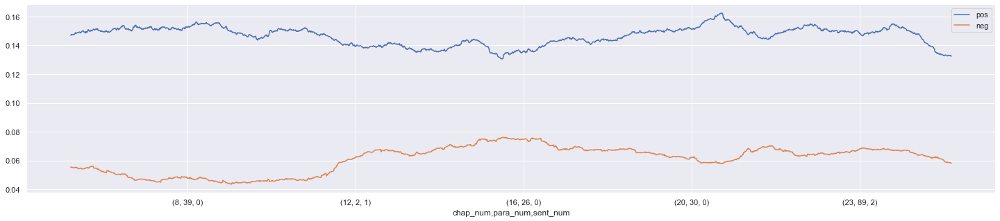

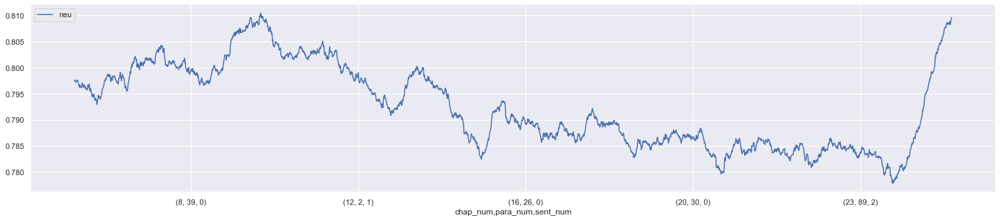

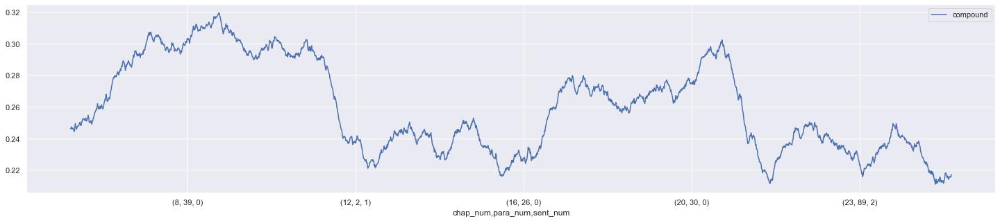

In [386]:
w = int(EIGHT_vader.shape[0] / 5)
EIGHT_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
EIGHT_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
EIGHT_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

In [389]:
JACKJILL_vader_cols = JACKJILL2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
JACKJILL_vader = pd.concat([JACKJILL2_sents, JACKJILL_vader_cols], axis=1)

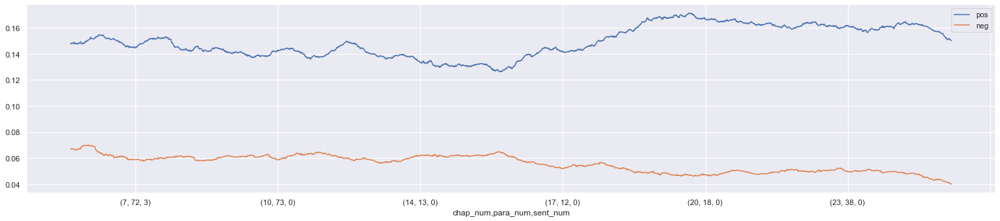

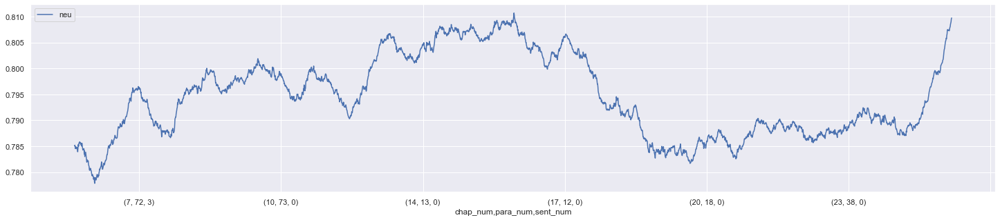

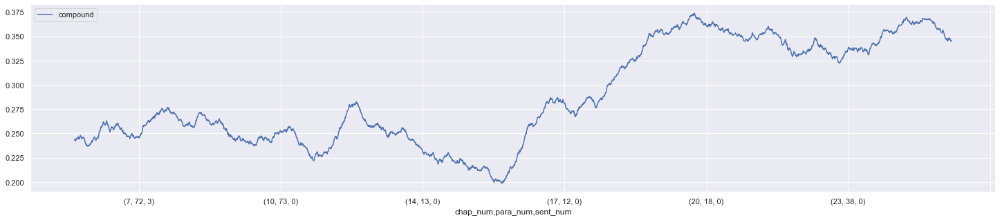

In [390]:
w = int(JACKJILL_vader.shape[0] / 5)
JACKJILL_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
JACKJILL_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
JACKJILL_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

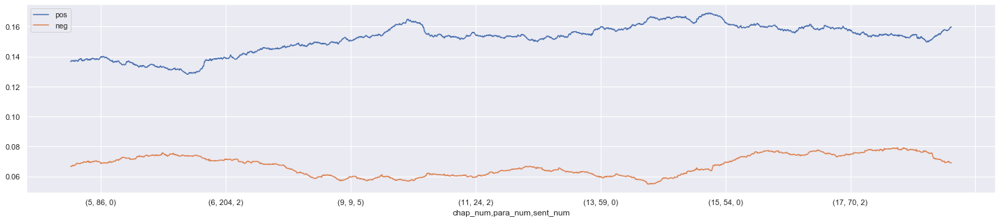

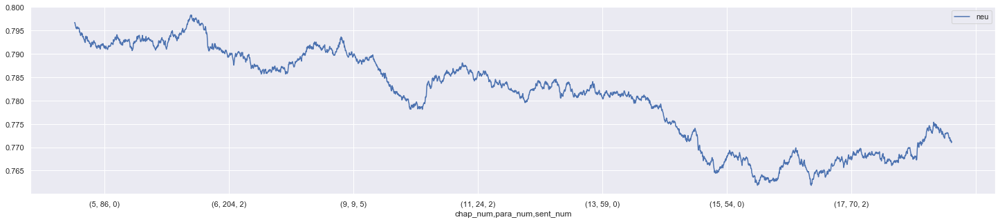

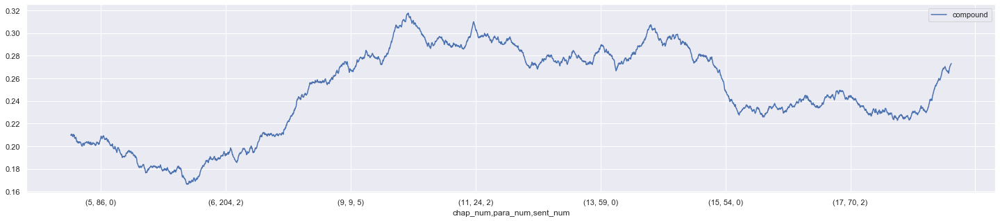

In [391]:
OLD_vader_cols = OLD2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
OLD_vader = pd.concat([OLD2_sents, OLD_vader_cols], axis=1)
w = int(OLD_vader.shape[0] / 5)
OLD_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
OLD_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
OLD_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

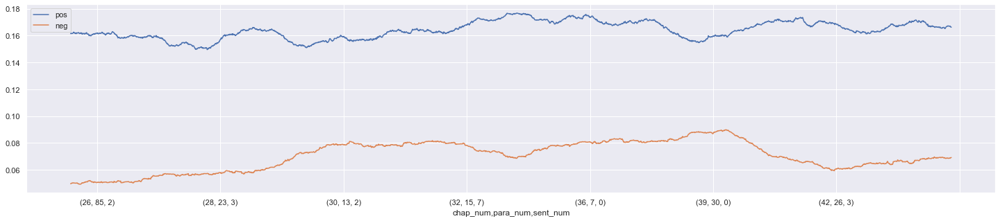

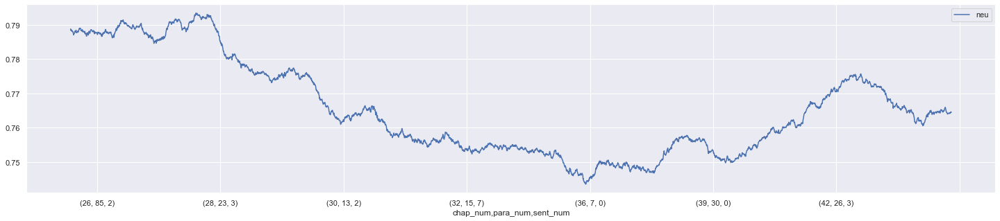

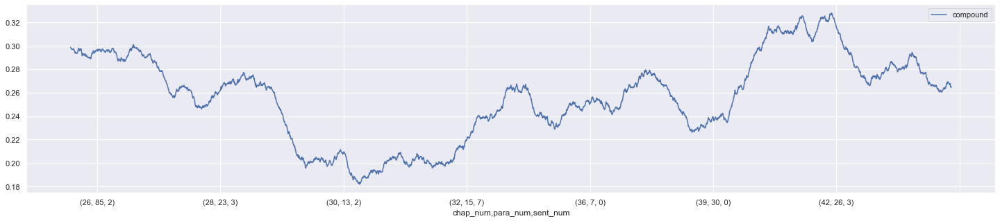

In [392]:
JO_vader_cols = JO2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
JO_vader = pd.concat([JO2_sents, JO_vader_cols], axis=1)
w = int(JO_vader.shape[0] / 5)
JO_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
JO_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
JO_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

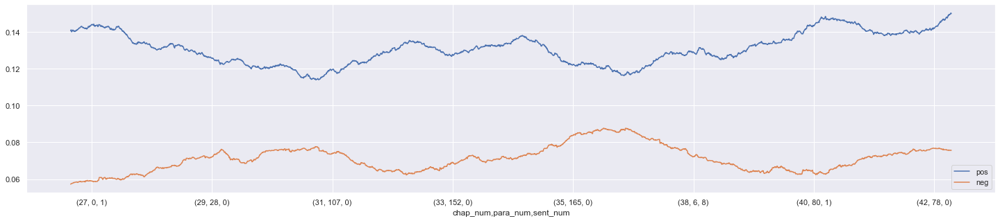

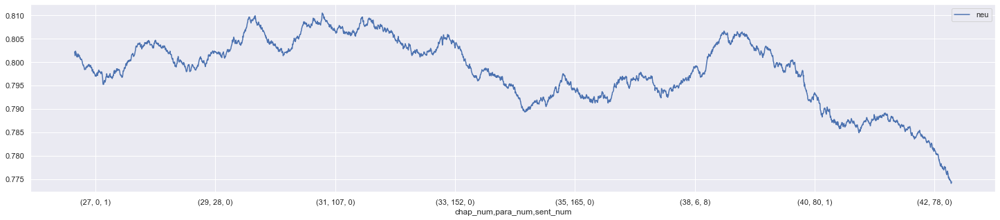

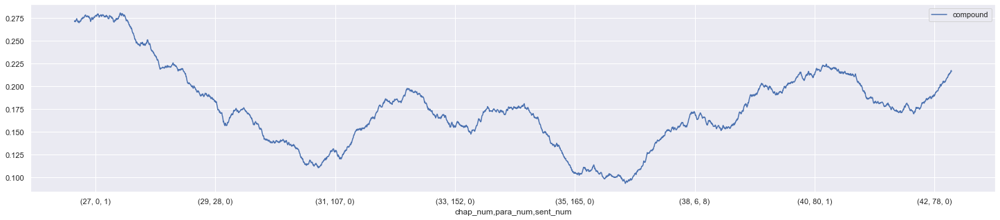

In [394]:
LITTLEM_vader_cols = LITTLEM2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
LITTLEM_vader = pd.concat([LITTLEM2_sents, LITTLEM_vader_cols], axis=1)
w = int(LITTLEM_vader.shape[0] / 5)
LITTLEM_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
LITTLEM_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
LITTLEM_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

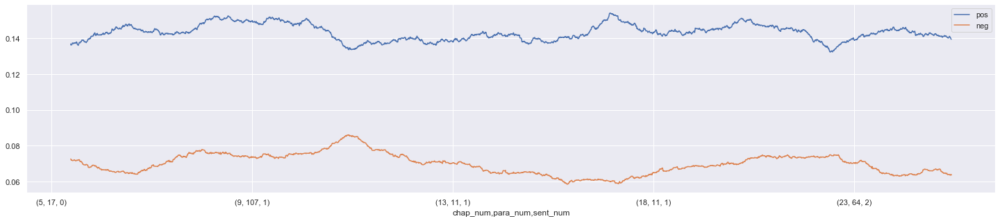

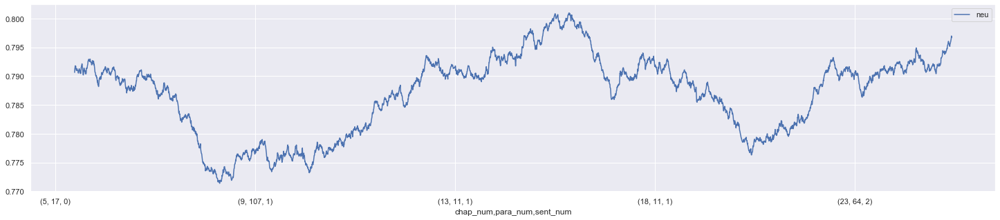

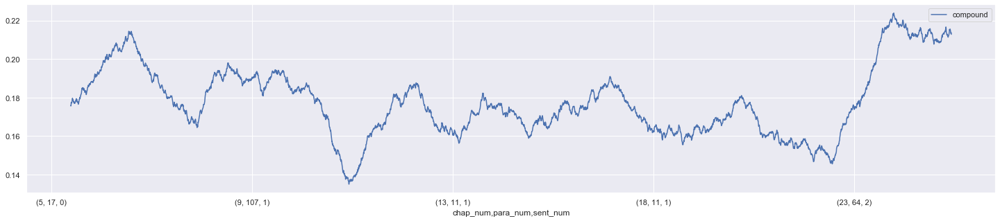

In [395]:
LITTLEW_vader_cols = LITTLEW2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
LITTLEW_vader = pd.concat([LITTLEW2_sents, LITTLEW_vader_cols], axis=1)
w = int(LITTLEW_vader.shape[0] / 5)
LITTLEW_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
LITTLEW_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
LITTLEW_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

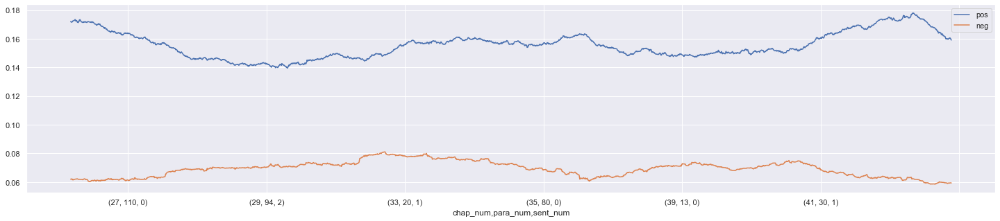

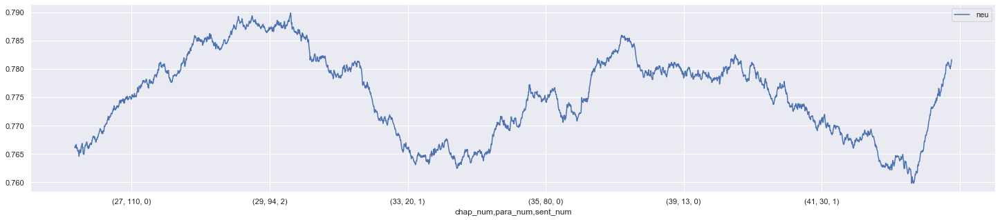

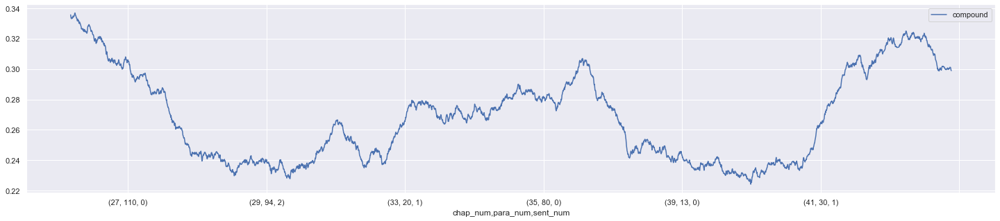

In [397]:
ROSE_vader_cols = ROSE2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
ROSE_vader = pd.concat([ROSE2_sents, ROSE_vader_cols], axis=1)
w = int(ROSE_vader.shape[0] / 5)
ROSE_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
ROSE_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
ROSE_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

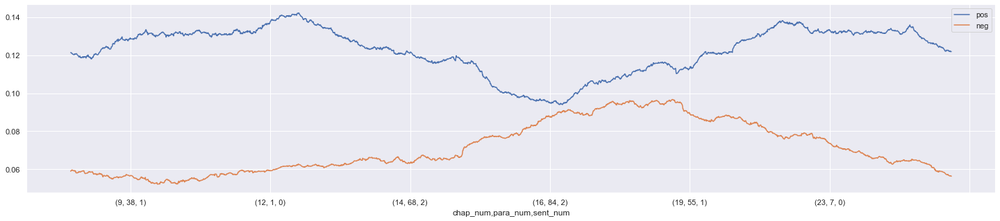

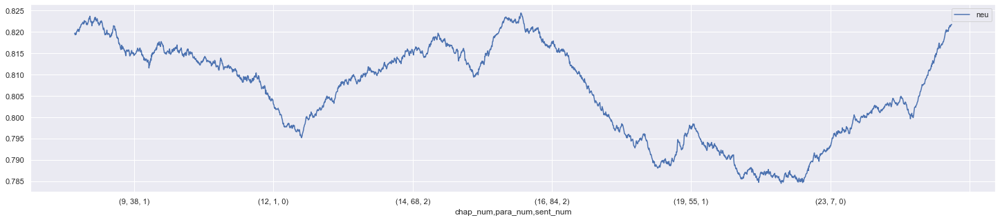

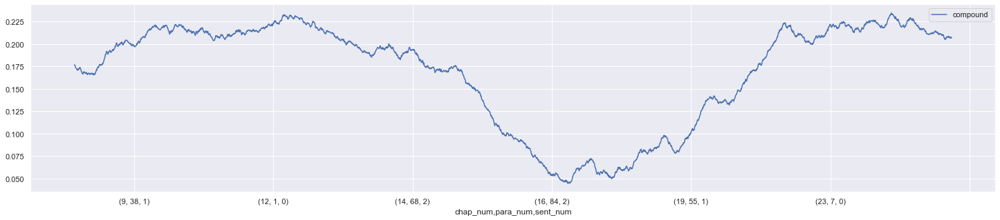

In [398]:
UNDER_vader_cols = UNDER2_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
UNDER_vader = pd.concat([UNDER2_sents, UNDER_vader_cols], axis=1)
w = int(UNDER_vader.shape[0] / 5)
UNDER_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
UNDER_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
UNDER_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

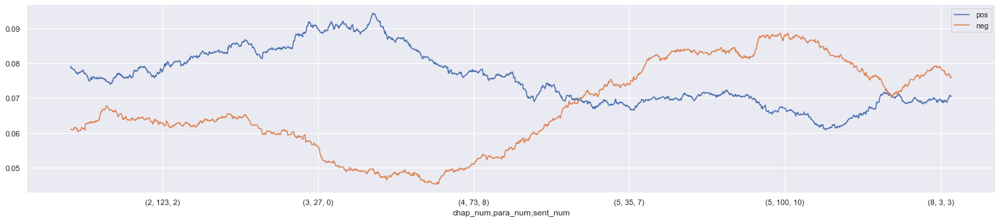

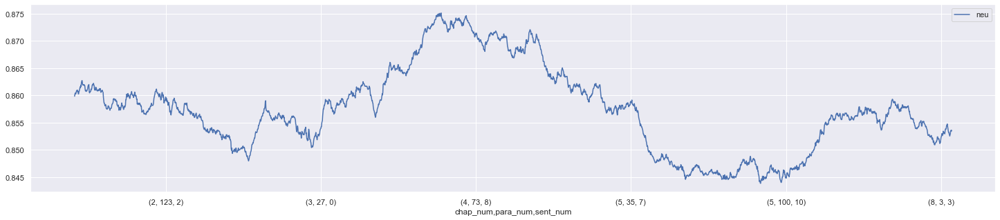

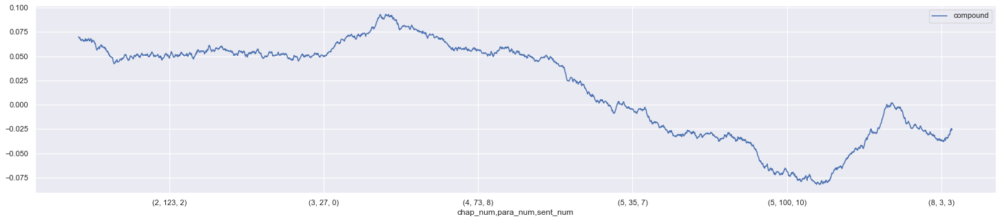

In [399]:
POE1_vader_cols = POE12_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
POE1_vader = pd.concat([POE12_sents, POE1_vader_cols], axis=1)
w = int(POE1_vader.shape[0] / 5)
POE1_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
POE1_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
POE1_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

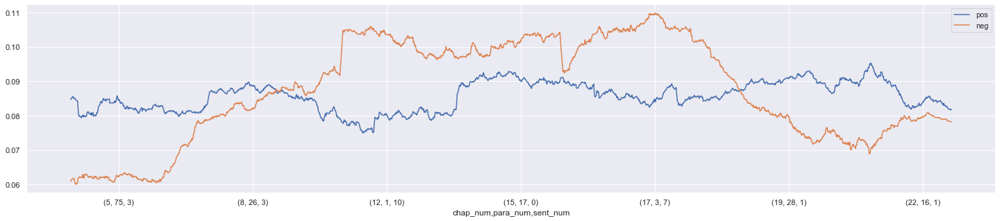

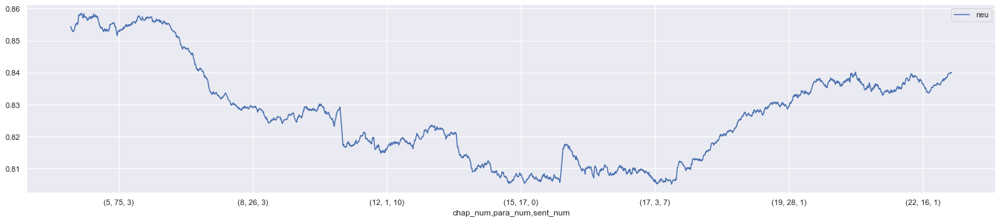

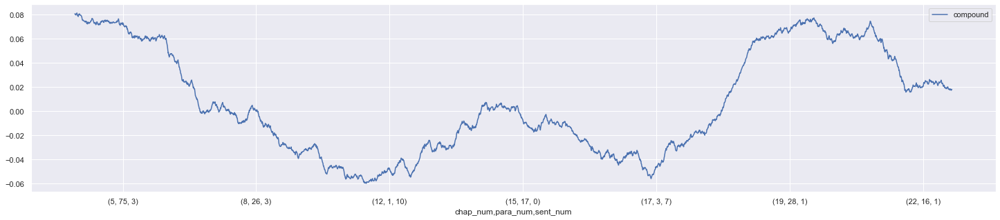

In [400]:
POE2_vader_cols = POE22_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
POE2_vader = pd.concat([POE22_sents, POE2_vader_cols], axis=1)
w = int(POE2_vader.shape[0] / 5)
POE2_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
POE2_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
POE2_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

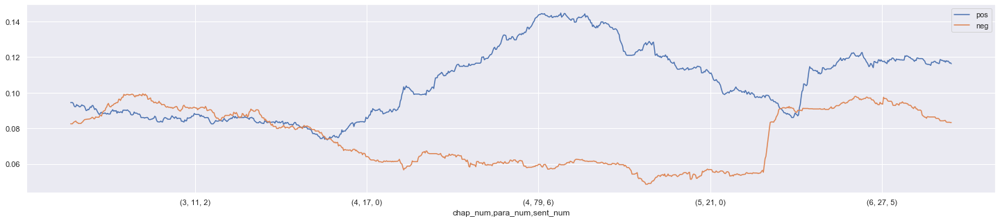

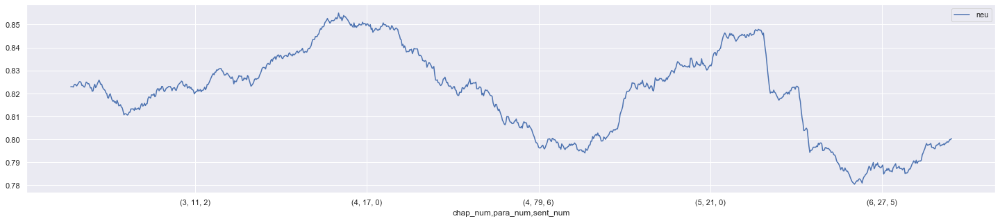

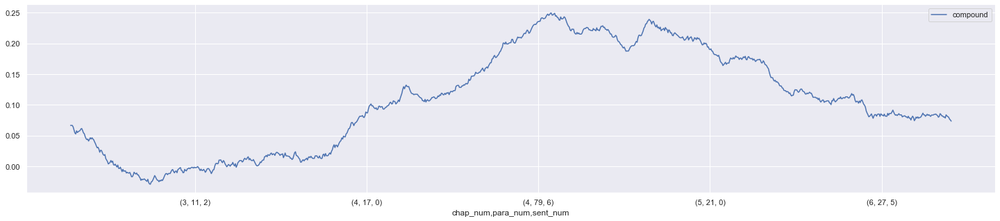

In [401]:
POE3_vader_cols = POE32_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
POE3_vader = pd.concat([POE32_sents, POE3_vader_cols], axis=1)
w = int(POE3_vader.shape[0] / 5)
POE3_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
POE3_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
POE3_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

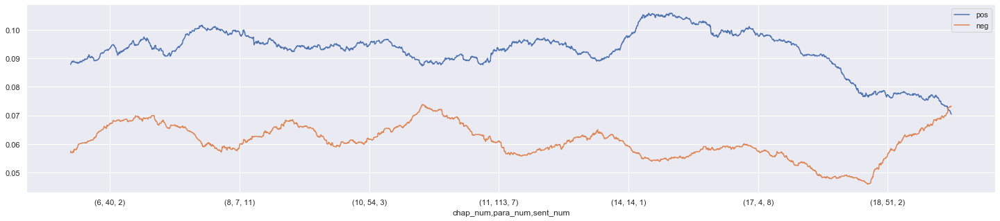

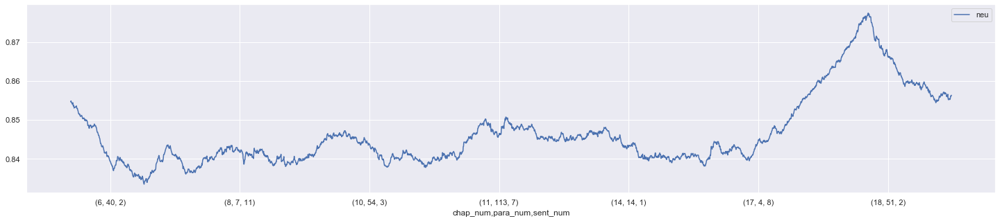

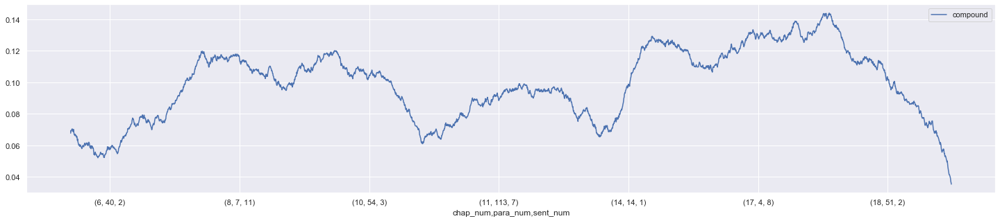

In [402]:
POE4_vader_cols = POE42_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
POE4_vader = pd.concat([POE42_sents, POE4_vader_cols], axis=1)
w = int(POE4_vader.shape[0] / 5)
POE4_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
POE4_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
POE4_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))

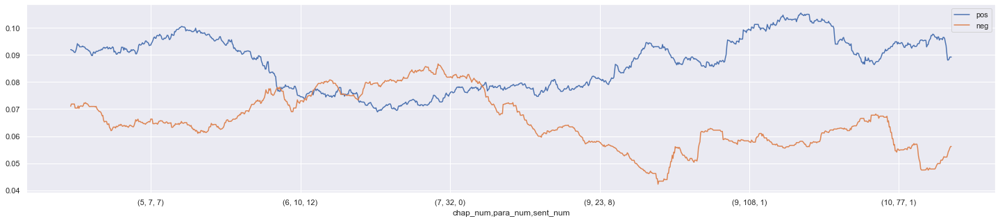

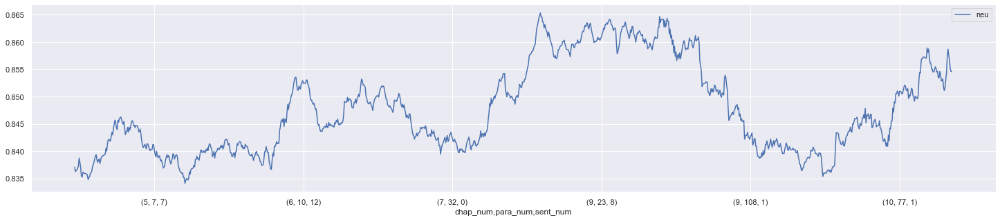

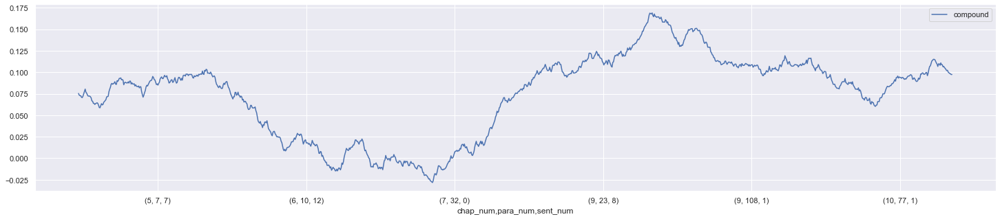

In [403]:
POE5_vader_cols = POE52_sents.sent_str.apply(analyser.polarity_scores).apply(lambda x: pd.Series(x))
POE5_vader = pd.concat([POE52_sents, POE5_vader_cols], axis=1)
w = int(POE5_vader.shape[0] / 5)
POE5_vader[['pos','neg']].rolling(w).mean().plot(figsize=(25,5))
POE5_vader[['neu']].rolling(w).mean().plot(figsize=(25,5))
POE5_vader[['compound']].rolling(w).mean().plot(figsize=(25,5))